In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

In [2]:
cities = pd.read_csv('dim_cities.csv')
respondants = pd.read_csv('dim_respondents.csv')
survey = pd.read_csv('fact_survey_responses.csv')

In [3]:
survey.columns = survey.columns.str.lower()
respondants.columns = respondants.columns.str.lower()
cities.columns = cities.columns.str.lower()

Column Description:
---
---
Table 1 - survey

- `response_id` : Unique id of the response recorded
- `respondent_id`: unique id of survey respnodant
- `consume_frequency`: frequency of consuming energy drink.
- `consume_time`: at what time respondant drinks energy drink.
- `consume_reason` : reason for consumption
- `heard_before`: has respondant heard about CodeX Energy Drink Brand.
- `brand_peception`: what does respondant thinks about brand CodeX.
- `general_perception`: what does respondant thinks about enegry drink in general.
- `tried_before`: has respondant ever tried CodeX energy drink.
- `taste_experience`: if respondant has tried CodeX enegry drink before
- `reasons_preventing_trying`: if respondant hasn't tried energy drink - reason. If tried then what are the reasons to not purchase again/ difficulty in purchasing again.
- `current_brands`: which brand's enegry drink respondant currently consumes.
- `reasons_for_choosing_brands`: why respondant consumes a particular brand over others.
- `improvements_desired`: what improvements respondant wants to see in energy drinks currently available in market.
- `ingredients_expected`: what ingredients respondant expects in a energy drink.
- `health_concerns`: is respondant concerned about the health impact of energy drink.
- `interest_in_natural_or_organic`: is respondant interested in an energy drink with the natural/organic ingredients.
- `marketing_channels`: marketing channel or platform where the respondent most frequently sees energy drink advertisements.
- `packaging_preference`: which packaging attracts the respondant.
- `limited_edition_packaging`: to what extent does limited edition packaging influences respondants likelihood of purchasing an energy drink?
- `price_range` : which price range respondant considers reasonable for an energy drink.
- `purchase_location` : where does respondant purchases energy drink.
- `typical_consumption_situations`:In which situations or activities respondant typically consume energy drinks.
---
---

Table 2 - respondants

---

- `respondent_id` : unique id given to each survey respondant.
- `name` : name of survey respondent
- `age` : age of survey respondent
- `gender`: gender of survey respondant
- `city_id`: unique ID of each city the respondent belongs to
---
---

Table 3 - cities

---
- `city_id`: unique ID of each city the respondent belongs to
- `city`: name of city
- `tier`: tier category of the city


In [4]:
tables = [respondants,cities,survey]
for i in tables:
    print(i.duplicated().sum())
    print("******")
    print(i.isnull().sum())

0
******
respondent_id    0
name             0
age              0
gender           0
city_id          0
dtype: int64
0
******
city_id    0
city       0
tier       0
dtype: int64
0
******
response_id                       0
respondent_id                     0
consume_frequency                 0
consume_time                      0
consume_reason                    0
heard_before                      0
brand_perception                  0
general_perception                0
tried_before                      0
taste_experience                  0
reasons_preventing_trying         0
current_brands                    0
reasons_for_choosing_brands       0
improvements_desired              0
ingredients_expected              0
health_concerns                   0
interest_in_natural_or_organic    0
marketing_channels                0
packaging_preference              0
limited_edition_packaging         0
price_range                       0
purchase_location                 0
typical_consumption_s

- Demographics - Age,Gender,Income level,Education,Occupation,Marital status,Ethnicity,Location
- Demographics info - related columns in dataset - age,gender,city_id,city,tier, -- Also considering - purchase_location, price_range

In [5]:
df = pd.merge(survey,respondants, on = 'respondent_id').merge(cities, on = 'city_id')
df.head()

,response_id,respondent_id,consume_frequency,consume_time,consume_reason,heard_before,brand_perception,general_perception,tried_before,taste_experience,...,limited_edition_packaging,price_range,purchase_location,typical_consumption_situations,name,age,gender,city_id,city,tier
0,103001,120031,2-3 times a week,To stay awake during work/study,Increased energy and focus,Yes,Neutral,Not sure,No,5,...,Yes,50-99,Supermarkets,Studying/working late,Aniruddh Issac,15-18,Female,CT117,Ahmedabad,Tier 2
1,103002,120032,2-3 times a month,Throughout the day,To boost performance,No,Neutral,Not sure,No,5,...,No,50-99,Supermarkets,Sports/exercise,Trisha Rout,19-30,Male,CT118,Pune,Tier 2
2,103003,120033,Rarely,Before exercise,Increased energy and focus,No,Neutral,Not sure,No,2,...,Not Sure,100-150,Supermarkets,Studying/working late,Yuvraj Virk,15-18,Male,CT116,Hyderabad,Tier 1
3,103004,120034,2-3 times a week,To stay awake during work/study,To boost performance,No,Positive,Dangerous,Yes,5,...,No,Above 150,Supermarkets,Sports/exercise,Pranay Chand,31-45,Female,CT113,Bangalore,Tier 1
4,103005,120035,Daily,To stay awake during work/study,Increased energy and focus,Yes,Neutral,Effective,Yes,5,...,Yes,100-150,Online retailers,Studying/working late,Mohanlal Joshi,19-30,Female,CT120,Lucknow,Tier 2


In [6]:
# heard_before = No and tried_before = Yes.
heard_before_y_tried_before_n = df[(df['heard_before'] == 'No') & (df['tried_before'] == 'Yes')].index
df.loc[heard_before_y_tried_before_n,'tried_before'] = 'No'

In [7]:
index_to_check = (df[(df['tried_before'] == 'Yes')]['reasons_preventing_trying']).index
df.loc[index_to_check,'reasons_preventing_trying'] = 'None'

In [8]:
object_dtype_columns = df.select_dtypes(include = 'object')
object_dtype_columns = object_dtype_columns.drop(columns = 'name')

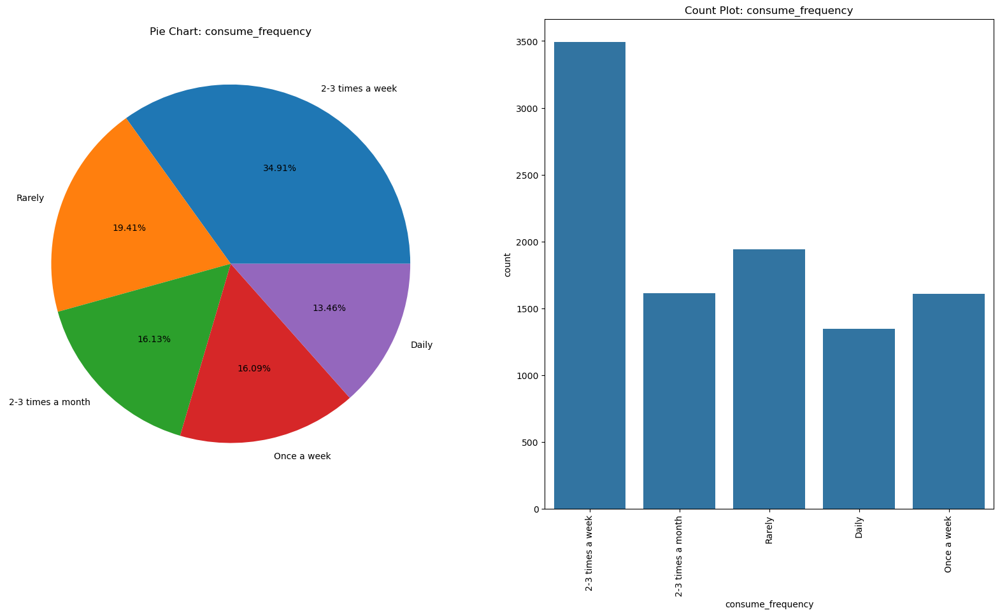

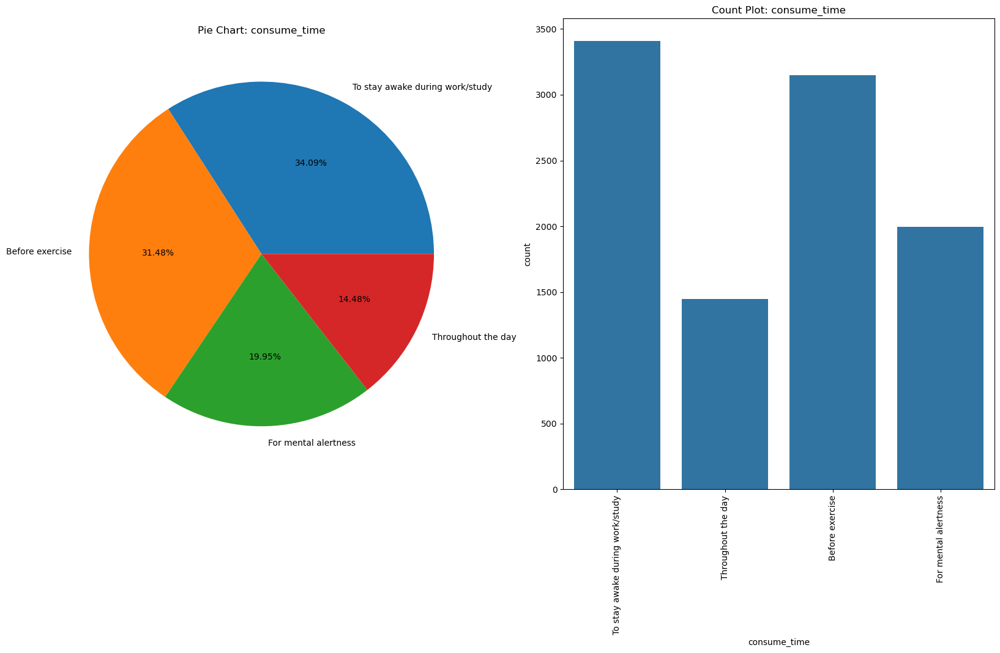

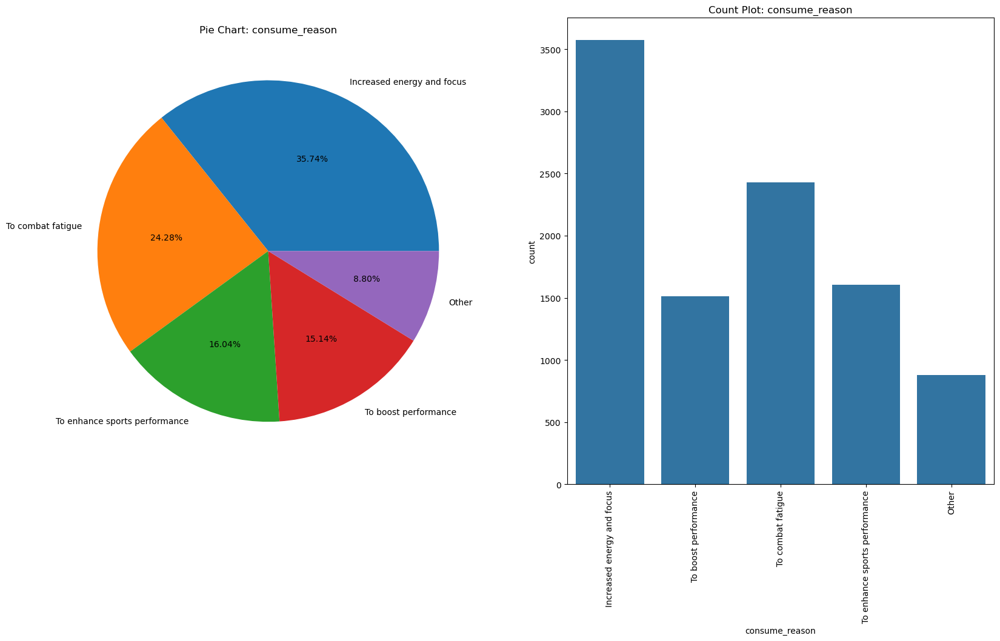

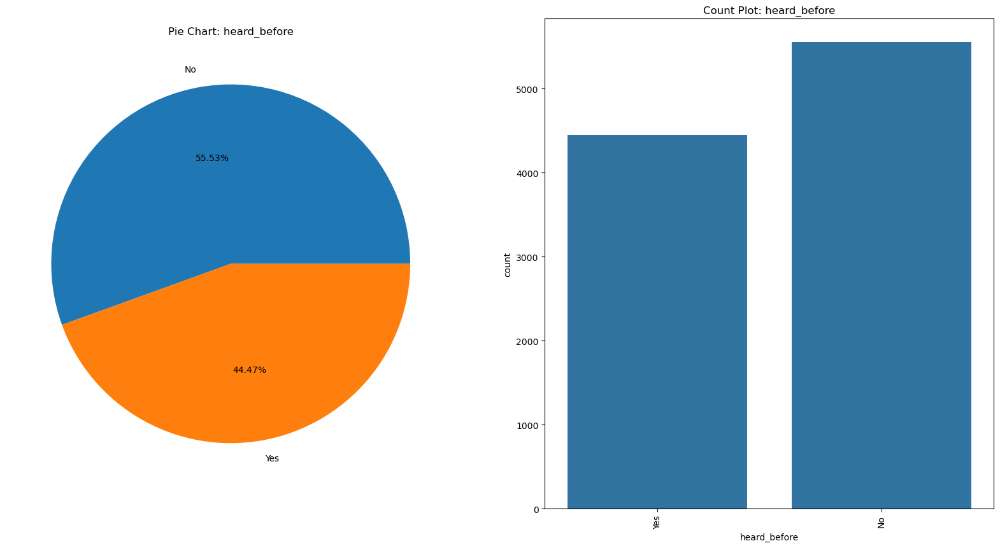

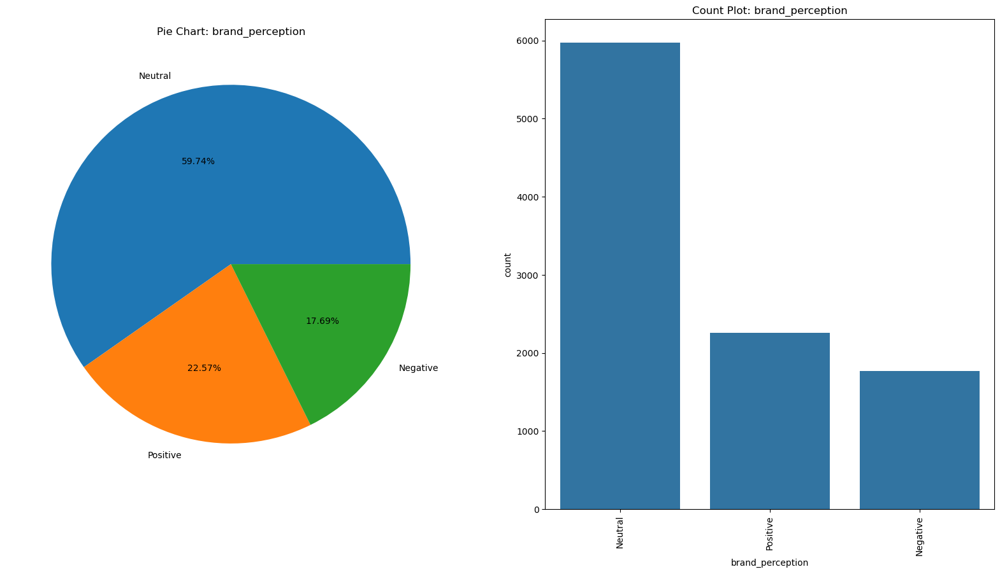

...

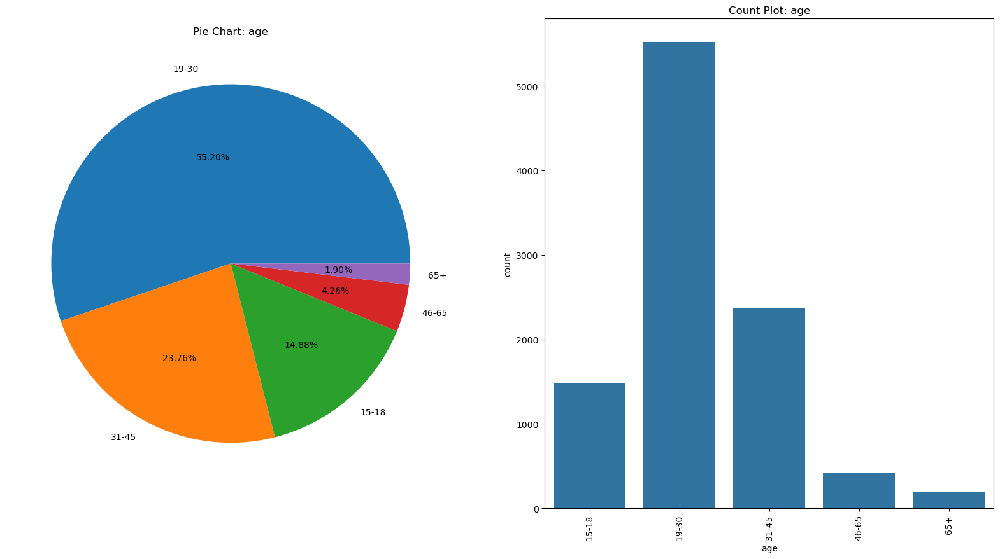

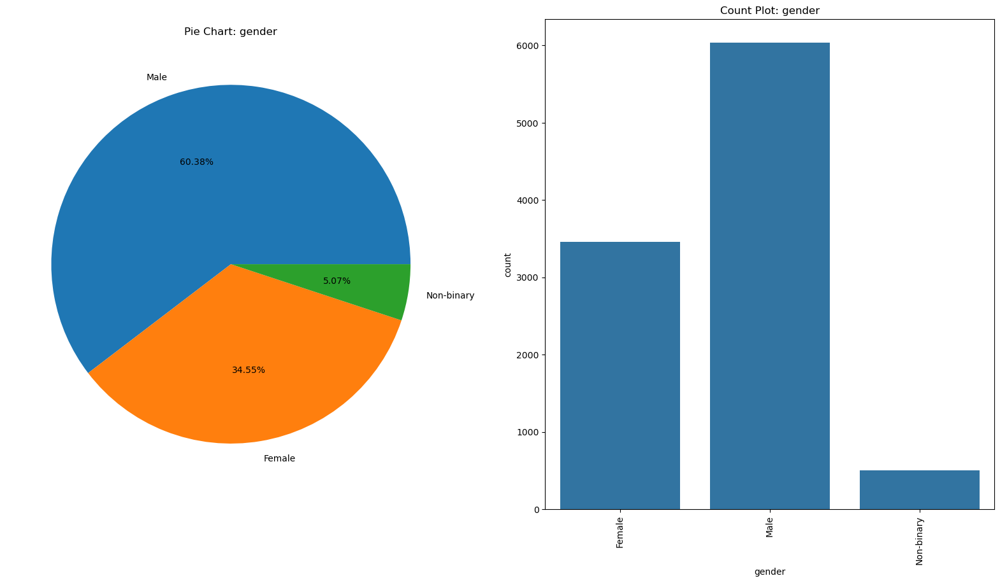

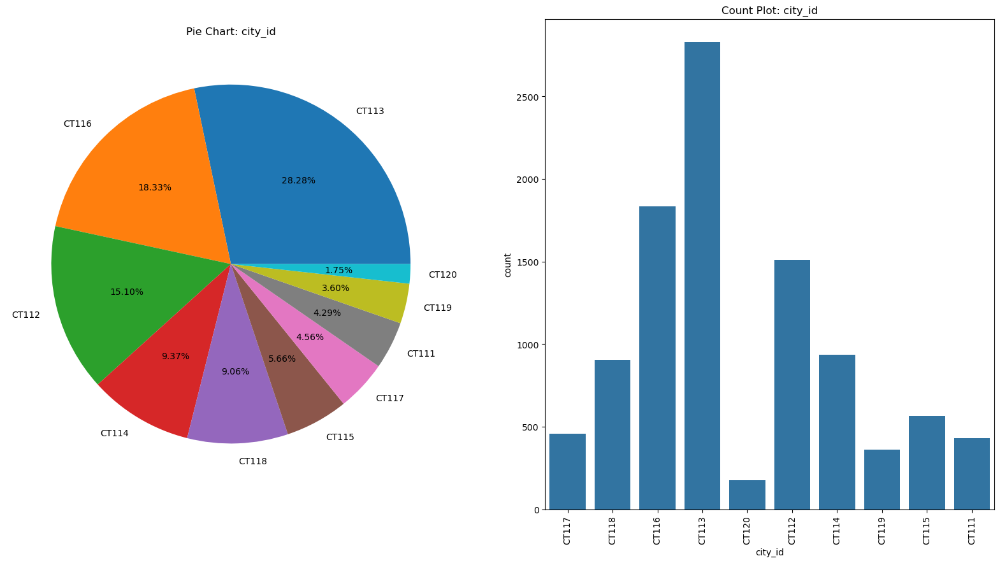

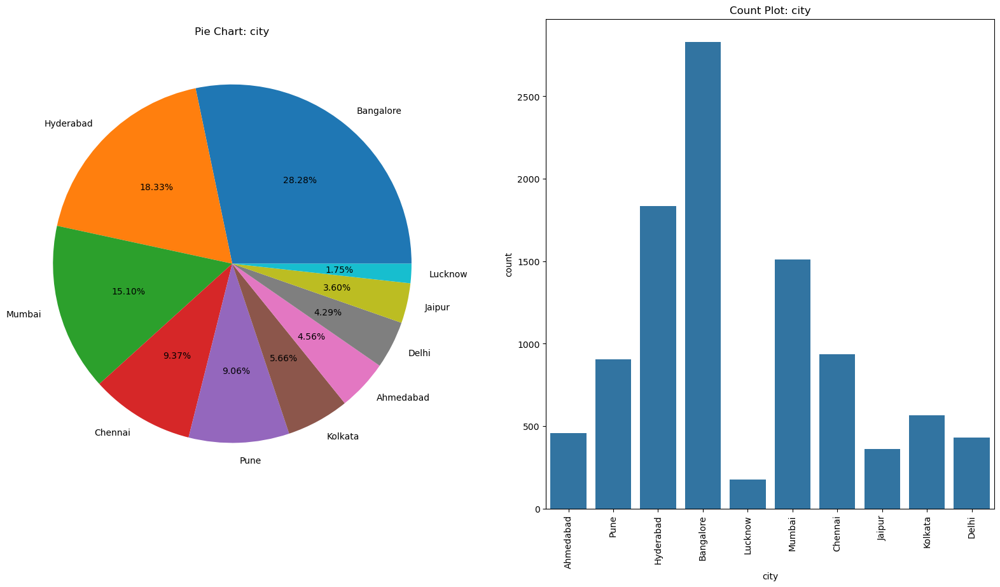

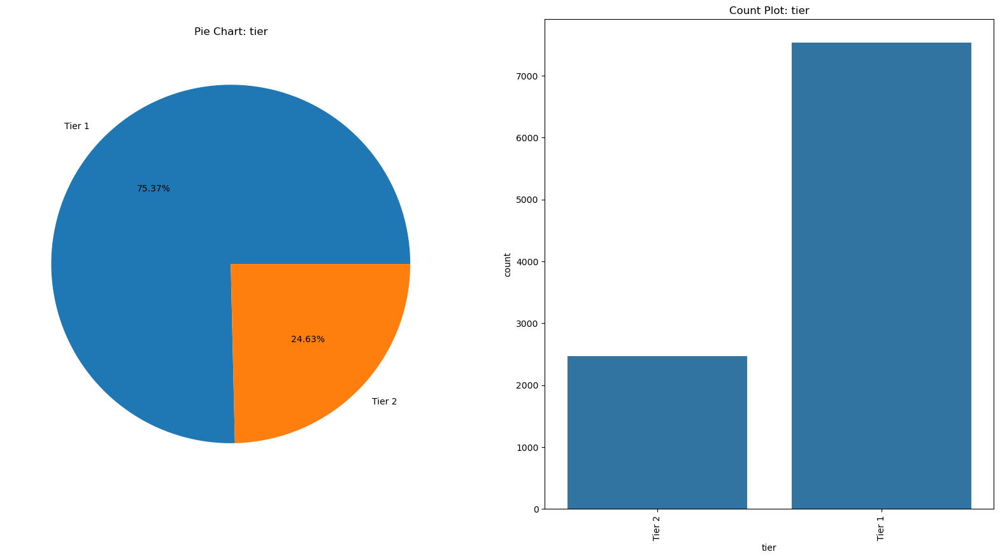

In [9]:
for col in object_dtype_columns:
    fig = plt.figure(figsize = (20,10))
    ax1 = fig.add_subplot(1,2,1)
    ax1.pie(object_dtype_columns[col].value_counts(), labels = object_dtype_columns[col].value_counts().index, autopct = "%1.2f%%")
    ax1.set_title(f'Pie Chart: {col}')
    
    ax2 = fig.add_subplot(1,2,2)
    sns.countplot(data = object_dtype_columns, x = col, ax = ax2)
    ax2.set_title(f'Count Plot: {col}')
    ax2.tick_params(axis = 'x', rotation = 90)
    plt.show()

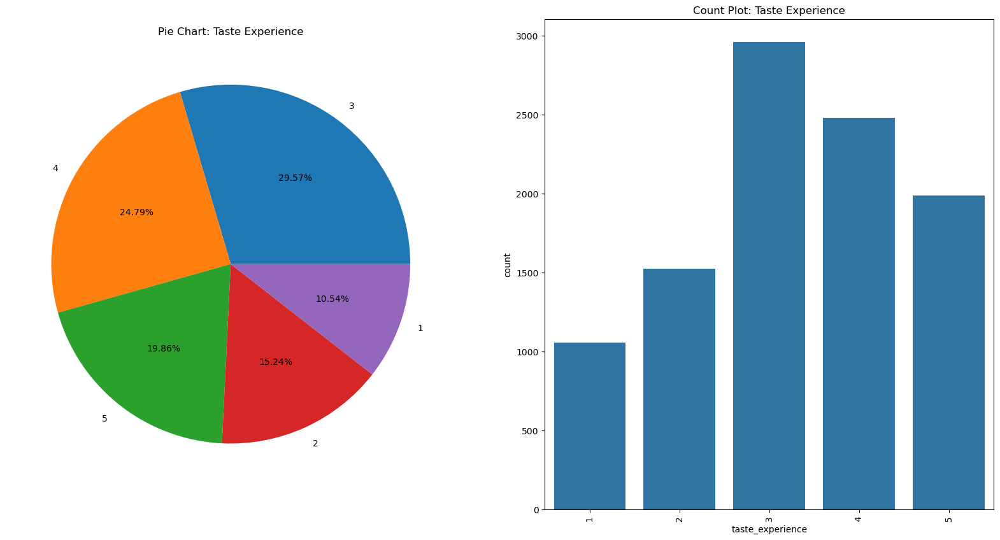

In [10]:
df.select_dtypes(exclude = 'object')  # only taste_experience is worth analysing.
fig = plt.figure(figsize = (20,10))
ax1 = fig.add_subplot(1,2,1)
ax1.pie(df['taste_experience'].value_counts(), labels = df['taste_experience'].value_counts().index, autopct = "%1.2f%%")
ax1.set_title('Pie Chart: Taste Experience')
    
ax2 = fig.add_subplot(1,2,2)
sns.countplot(data = df, x = 'taste_experience', ax = ax2)
ax2.set_title('Count Plot: Taste Experience')
ax2.tick_params(axis = 'x', rotation = 90)
plt.show()

In [11]:
consume_freq_score_map = {
    'Rarely' : 1,
    '2-3 times a month' : 2,
    'Once a week' : 3,        # means 4 times in month.
    '2-3 times a week' : 4,
    'Daily' : 5
}
df['consume_freq_scores'] = df['consume_frequency'].map(consume_freq_score_map)

In [12]:
def heatmap_creator(col_1,col_2):
    sns.heatmap(pd.crosstab(index = df[col_1],columns = df[col_2]))

In [13]:
def chi_sq_test(col_1,col_2):
    contingency = pd.crosstab(index = df[col_1], columns = df[col_2])
    chi2_statistic, p_value, dof, expected = chi2_contingency(contingency)
    sample_size = contingency.values.sum()
    r,k = contingency.shape
    cramers_v = np.sqrt((chi2_statistic)/((sample_size) * np.min((r-1,k-1))))
    print(f' Chi-sq Statistic: {chi2_statistic}, Pvalue: {p_value}, Cramers_V: {cramers_v}')
    return contingency,expected

In [14]:
def heatmap_analysis(col_1,col_2):
    contingency, expected = chi_sq_test(col_1,col_2)
    print('************')
    print()
    fig = plt.figure(figsize = (15,10))
    ax1 = fig.add_subplot(2,2,1)
    sns.heatmap(contingency,linewidth = 1, annot = True,ax = ax1, fmt = '.1f',)
    ax1.set_title(f'{col_1} Vs {col_2}')
    ax1.set_xlabel(col_2)
    ax1.set_ylabel(col_1)
    
    ax2 = fig.add_subplot(2,2,2)
    sns.heatmap(expected,linewidth = 1, annot = True,ax = ax2, fmt = '.2f')
    ax2.set_title(f'{col_1} Vs {col_2} Expected')
    ax2.set_xlabel(col_2)
    ax2.set_ylabel(col_1)

    residuals = (contingency - expected)/np.sqrt(expected)
    fig = plt.figure(figsize = (15,10))
    mask = (residuals.abs() < 2)   # using mask to avoid confusion.
    ax3 = fig.add_subplot(2,2,3)
    sns.heatmap(residuals,linewidth = 1, annot = True, ax = ax3, fmt = '.2f', cmap = 'coolwarm', mask = mask)
    ax3.set_title(f'{col_1} Vs {col_2} Residuals')
    ax3.set_xlabel(col_2)
    ax3.set_ylabel(col_1)

    ax4 = fig.add_subplot(2,2,4)
    prop_within_age = contingency.div(contingency.sum(axis=0), axis=1) * 100
    sns.heatmap(prop_within_age,linewidth = 1, annot = True, ax = ax4, fmt = '.2f', cmap = 'coolwarm')
    ax4.set_title(f'{col_1} Vs {col_2} Proportions')
    ax4.set_xlabel(col_2)
    ax4.set_ylabel(col_1)
    
    plt.tight_layout()
    plt.show()

    significant_cells = np.where(residuals.abs() > 2)
    for i,j in zip(*significant_cells): # i for the index and j for the columns.
        col_1_value = prop_within_age.index[i]   # name/group from the index 
        col_2_value = prop_within_age.columns[j]   # name/group from the column
        observed_value = prop_within_age.iloc[i,j]          # actual value to compare with the others.
        other_values = prop_within_age.loc[col_1_value].drop(col_2_value)
        other_mean = other_values.mean()
        percent_difference = np.round(((observed_value - other_mean) / other_mean) * 100,2)
        print(f'{col_2_value} selected {col_1_value} over other groups {percent_difference} %')

 Chi-sq Statistic: 17.363750114269557, Pvalue: 0.3624448349335045, Cramers_V: 0.020834916675061096
************



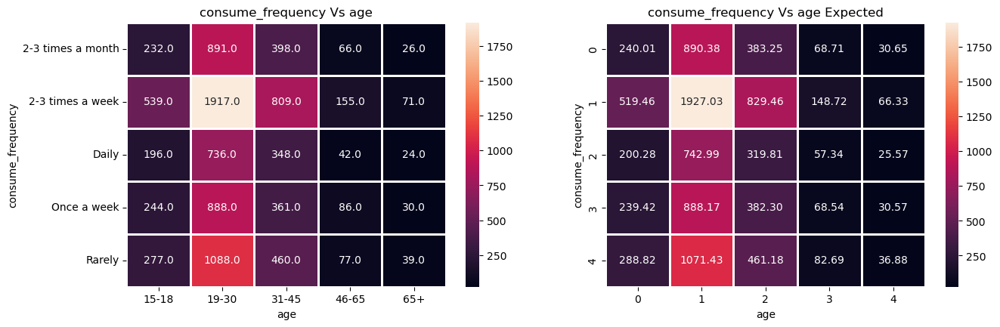

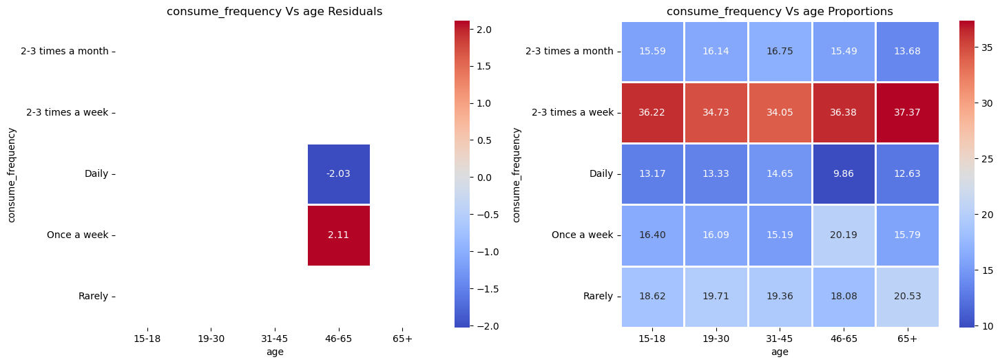

46-65 selected Daily over other groups -26.68 %
46-65 selected Once a week over other groups 27.23 %


In [15]:
# consume_freq vs age.
heatmap_analysis('consume_frequency','age')
# not statistically significant difference and the consumption freq is almost same across all the age groups - 2/3 times a day.

 Chi-sq Statistic: 242.02200353376315, Pvalue: 6.290713475884667e-45, Cramers_V: 0.08981870694789647
************



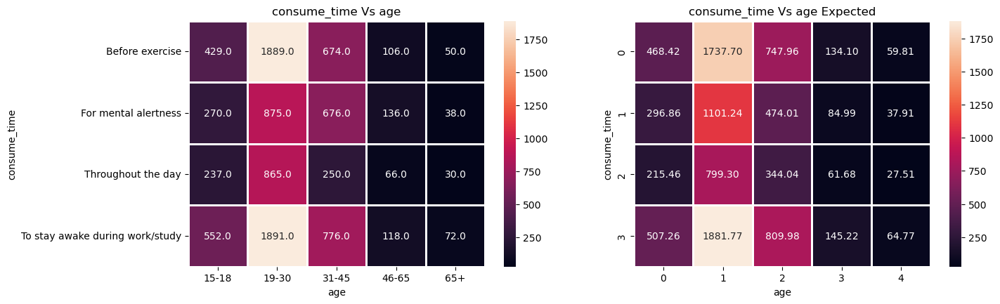

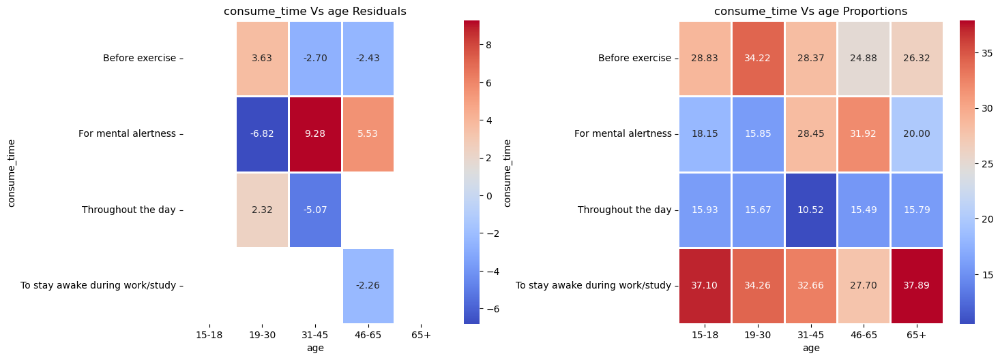

19-30 selected Before exercise over other groups 26.28 %
31-45 selected Before exercise over other groups -0.68 %
46-65 selected Before exercise over other groups -15.46 %
19-30 selected For mental alertness over other groups -35.64 %
31-45 selected For mental alertness over other groups 32.45 %
46-65 selected For mental alertness over other groups 54.89 %
19-30 selected Throughout the day over other groups 8.57 %
31-45 selected Throughout the day over other groups -33.07 %
46-65 selected To stay awake during work/study over other groups -21.92 %


In [16]:
# consume_time vs age
heatmap_analysis('consume_time','age')

 Chi-sq Statistic: 11.355289843058946, Pvalue: 0.7870424253625536, Cramers_V: 0.016848805479216432
************



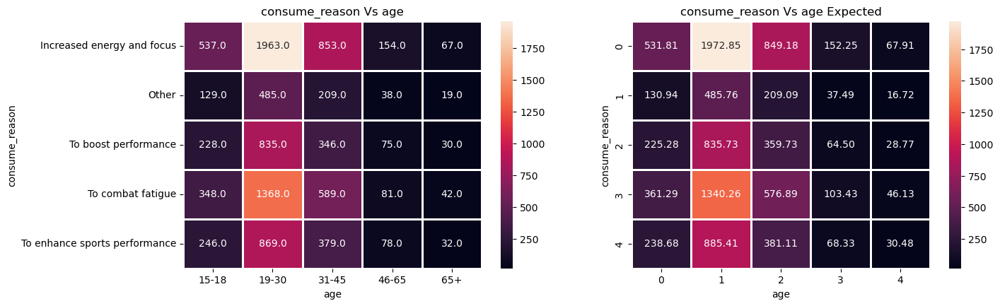

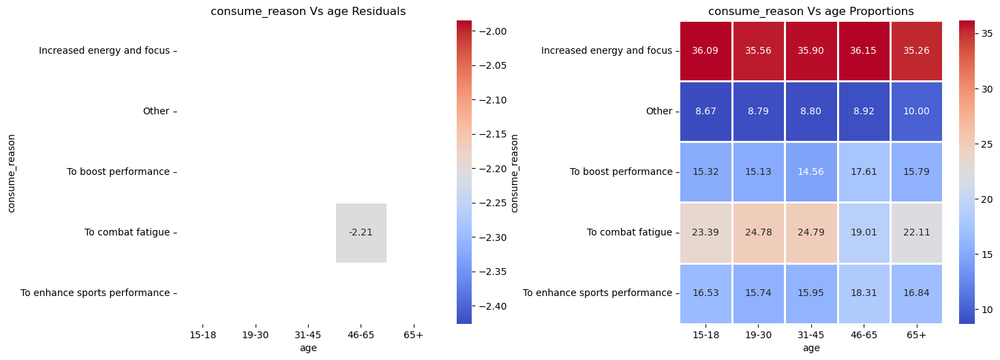

46-65 selected To combat fatigue over other groups -20.0 %


In [17]:
# consume_reason vs age
heatmap_analysis('consume_reason','age')

In [18]:
# heard_before vs age.
chi_sq_test('heard_before','age')

 Chi-sq Statistic: 3.421414142101233, Pvalue: 0.48992764680405176, Cramers_V: 0.018497065016107914


(age           15-18  19-30  31-45  46-65  65+
 heard_before                                 
 No              826   3054   1318    254  101
 Yes             662   2466   1058    172   89,
 array([[ 826.2864, 3065.256 , 1319.3928,  236.5578,  105.507 ],
        [ 661.7136, 2454.744 , 1056.6072,  189.4422,   84.493 ]]))

In [19]:
# brand_perception vs age
chi_sq_test('brand_perception','age')

 Chi-sq Statistic: 4.224316925466482, Pvalue: 0.8363388003838059, Cramers_V: 0.014533266882340119


(age               15-18  19-30  31-45  46-65  65+
 brand_perception                                 
 Negative            260    976    419     77   37
 Neutral             886   3323   1410    253  102
 Positive            342   1221    547     96   51,
 array([[ 263.2272,  976.488 ,  420.3144,   75.3594,   33.611 ],
        [ 888.9312, 3297.648 , 1419.4224,  254.4924,  113.506 ],
        [ 335.8416, 1245.864 ,  536.2632,   96.1482,   42.883 ]]))

 Chi-sq Statistic: 2408.3913273239577, Pvalue: 0.0, Cramers_V: 0.2833367447240096
************



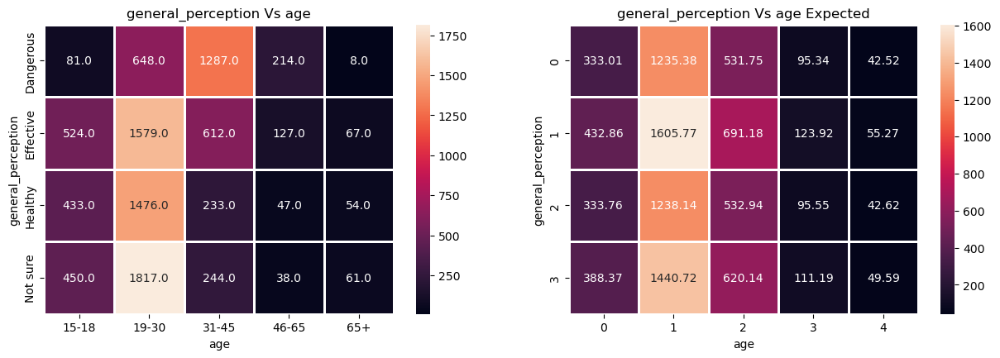

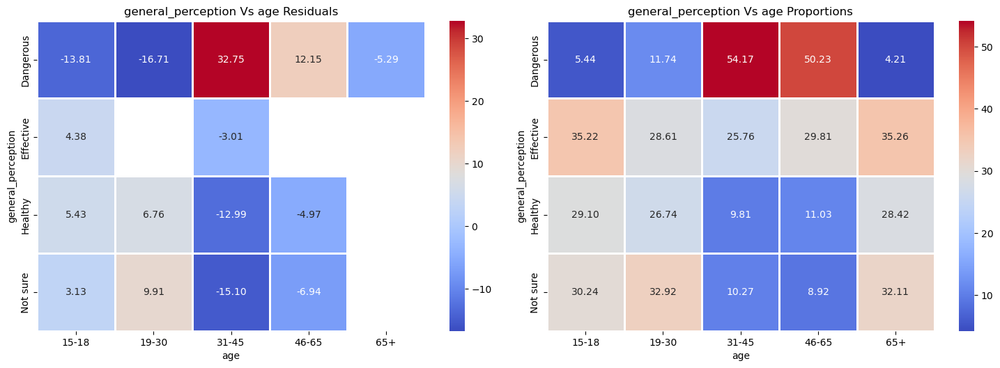

15-18 selected Dangerous over other groups -81.91 %
19-30 selected Dangerous over other groups -58.83 %
31-45 selected Dangerous over other groups 202.49 %
46-65 selected Dangerous over other groups 165.93 %
65+ selected Dangerous over other groups -86.15 %
15-18 selected Effective over other groups 17.94 %
31-45 selected Effective over other groups -20.07 %
15-18 selected Healthy over other groups 53.16 %
19-30 selected Healthy over other groups 36.49 %
31-45 selected Healthy over other groups -58.84 %
46-65 selected Healthy over other groups -53.08 %
15-18 selected Not sure over other groups 43.65 %
19-30 selected Not sure over other groups 61.48 %
31-45 selected Not sure over other groups -60.57 %
46-65 selected Not sure over other groups -66.19 %


In [20]:
# general_perception vs age
heatmap_analysis('general_perception','age')

In [21]:
# tried_before vs age.
chi_sq_test('tried_before','age')

 Chi-sq Statistic: 3.5265318671267645, Pvalue: 0.47385560043549646, Cramers_V: 0.01877906245563597


(age           15-18  19-30  31-45  46-65  65+
 tried_before                                 
 No             1184   4419   1873    350  148
 Yes             304   1101    503     76   42,
 array([[1186.5312, 4401.648 , 1894.6224,  339.6924,  151.506 ],
        [ 301.4688, 1118.352 ,  481.3776,   86.3076,   38.494 ]]))

In [22]:
# taste_experience vs age
chi_sq_test('taste_experience','age')

 Chi-sq Statistic: 16.00678664359527, Pvalue: 0.4524872480061171, Cramers_V: 0.020004241202552068


(age               15-18  19-30  31-45  46-65  65+
 taste_experience                                 
 1                   153    594    239     47   21
 2                   225    823    375     72   29
 3                   424   1649    714    116   54
 4                   399   1361    552    109   58
 5                   287   1093    496     82   28,
 array([[ 156.8352,  581.808 ,  250.4304,   44.9004,   20.026 ],
        [ 226.7712,  841.248 ,  362.1024,   64.9224,   28.956 ],
        [ 440.0016, 1632.264 ,  702.5832,  125.9682,   56.183 ],
        [ 368.8752, 1368.408 ,  589.0104,  105.6054,   47.101 ],
        [ 295.5168, 1096.272 ,  471.8736,   84.6036,   37.734 ]]))

In [23]:
# reasons_preventing_trying vs age
chi_sq_test('reasons_preventing_trying','age')

 Chi-sq Statistic: 14.812028611412865, Pvalue: 0.7870604105321433, Cramers_V: 0.019243199195698245


(age                              15-18  19-30  31-45  46-65  65+
 reasons_preventing_trying                                       
 Health concerns                    252   1003    436     80   36
 None                               304   1101    503     76   42
 Not available locally              279   1064    449     87   36
 Not interested in energy drinks    255   1024    409     67   33
 Other                              159    540    221     46   15
 Unfamiliar with the brand          239    788    358     70   28,
 array([[ 268.8816,  997.464 ,  429.3432,   76.9782,   34.333 ],
        [ 301.4688, 1118.352 ,  481.3776,   86.3076,   38.494 ],
        [ 284.952 , 1057.08  ,  455.004 ,   81.579 ,   36.385 ],
        [ 266.0544,  986.976 ,  424.8288,   76.1688,   33.972 ],
        [ 145.9728,  541.512 ,  233.0856,   41.7906,   18.639 ],
        [ 220.6704,  818.616 ,  352.3608,   63.1758,   28.177 ]]))

 Chi-sq Statistic: 67.9643871971133, Pvalue: 4.427683638168028e-06, Cramers_V: 0.041220258125439155
************



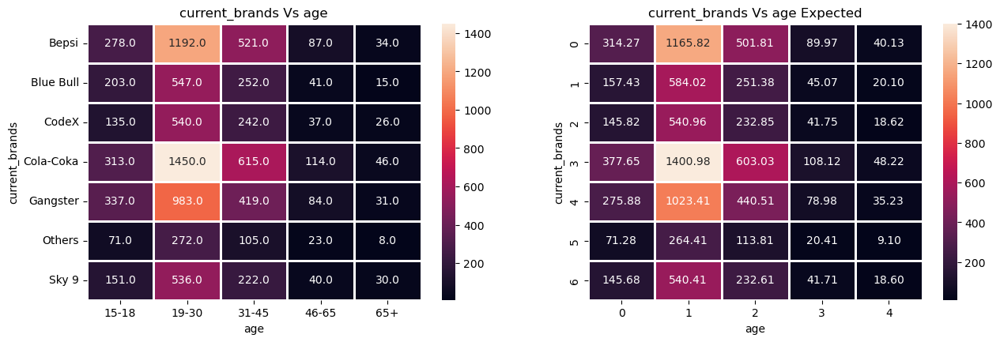

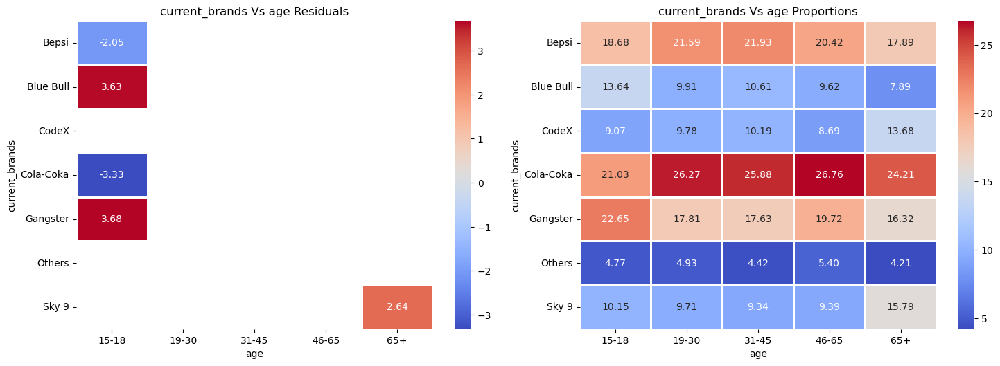

15-18 selected Bepsi over other groups -8.69 %
15-18 selected Blue Bull over other groups 43.47 %
15-18 selected Cola-Coka over other groups -18.41 %
15-18 selected Gangster over other groups 26.74 %
65+ selected Sky 9 over other groups 63.66 %


In [24]:
# current_brand vs age
heatmap_analysis('current_brands','age')

 Chi-sq Statistic: 124.73744834832758, Pvalue: 6.709565555678436e-19, Cramers_V: 0.05584296024306187
************



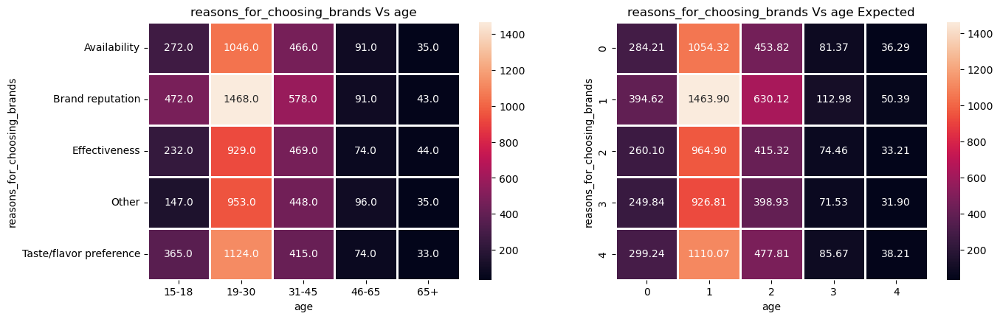

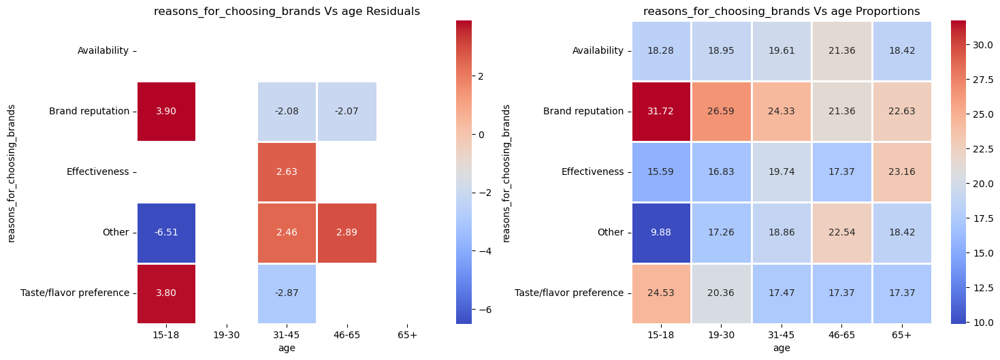

15-18 selected Brand reputation over other groups 33.68 %
31-45 selected Brand reputation over other groups -4.89 %
46-65 selected Brand reputation over other groups -18.83 %
31-45 selected Effectiveness over other groups 8.23 %
15-18 selected Other over other groups -48.73 %
31-45 selected Other over other groups 10.75 %
46-65 selected Other over other groups 39.93 %
15-18 selected Taste/flavor preference over other groups 35.21 %
31-45 selected Taste/flavor preference over other groups -12.26 %


In [25]:
# reasons_for_choosing_brands vs age
heatmap_analysis('reasons_for_choosing_brands','age')

In [26]:
# improvements_desired vs age
chi_sq_test('improvements_desired','age')

 Chi-sq Statistic: 22.08959187162657, Pvalue: 0.1403222289749104, Cramers_V: 0.023499782909436936


(age                       15-18  19-30  31-45  46-65  65+
 improvements_desired                                     
 Healthier alternatives      212    825    346     64   25
 More natural ingredients    403   1395    540    106   54
 Other                       122    558    261     35   22
 Reduced sugar content       458   1620    728    132   57
 Wider range of flavors      293   1122    501     89   32,
 array([[ 219.0336,  812.544 ,  349.7472,   62.7072,   27.968 ],
        [ 371.7024, 1378.896 ,  593.5248,  106.4148,   47.462 ],
        [ 148.5024,  550.896 ,  237.1248,   42.5148,   18.962 ],
        [ 445.656 , 1653.24  ,  711.612 ,  127.587 ,   56.905 ],
        [ 303.1056, 1124.424 ,  483.9912,   86.7762,   38.703 ]]))

In [27]:
# ingredients_expected vs age
chi_sq_test('ingredients_expected','age')

 Chi-sq Statistic: 10.658878923035676, Pvalue: 0.5583566413413006, Cramers_V: 0.01884929611686307


(age                   15-18  19-30  31-45  46-65  65+
 ingredients_expected                                 
 Caffeine                582   2151    935    163   65
 Guarana                 210    867    375     64   37
 Sugar                   314   1133    453     79   38
 Vitamins                382   1369    613    120   50,
 array([[ 579.7248, 2150.592 ,  925.6896,  165.9696,   74.024 ],
        [ 231.0864,  857.256 ,  368.9928,   66.1578,   29.507 ],
        [ 300.1296, 1113.384 ,  479.2392,   85.9242,   38.323 ],
        [ 377.0592, 1398.768 ,  602.0784,  107.9484,   48.146 ]]))

In [28]:
# health_concerns vs age
chi_sq_test('health_concerns','age') 
# every age group is more or less concerned about the impact of energy drinks on health, so pvlaue > 0.05 so statistically insignificant difference.

 Chi-sq Statistic: 5.1814274011499215, Pvalue: 0.26918330090238124, Cramers_V: 0.022762748957781707


(age              15-18  19-30  31-45  46-65  65+
 health_concerns                                 
 No                 578   2219    912    179   67
 Yes                910   3301   1464    247  123,
 array([[ 588.504, 2183.16 ,  939.708,  168.483,   75.145],
        [ 899.496, 3336.84 , 1436.292,  257.517,  114.855]]))

 Chi-sq Statistic: 15.872133892483133, Pvalue: 0.0442472651217426, Cramers_V: 0.028171025799998067
************



D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


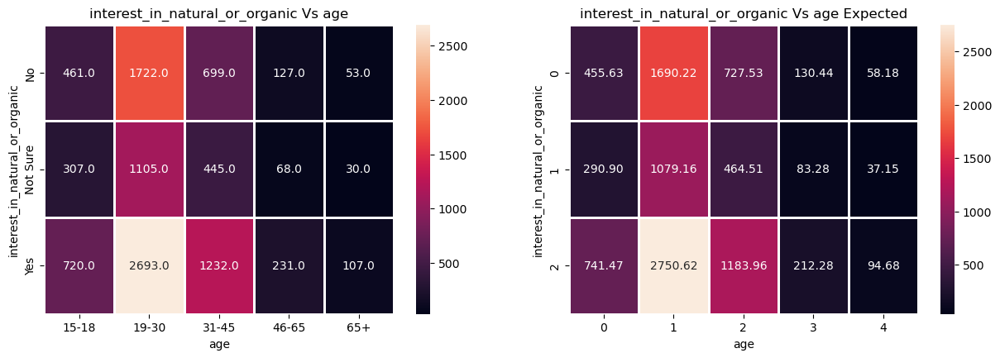

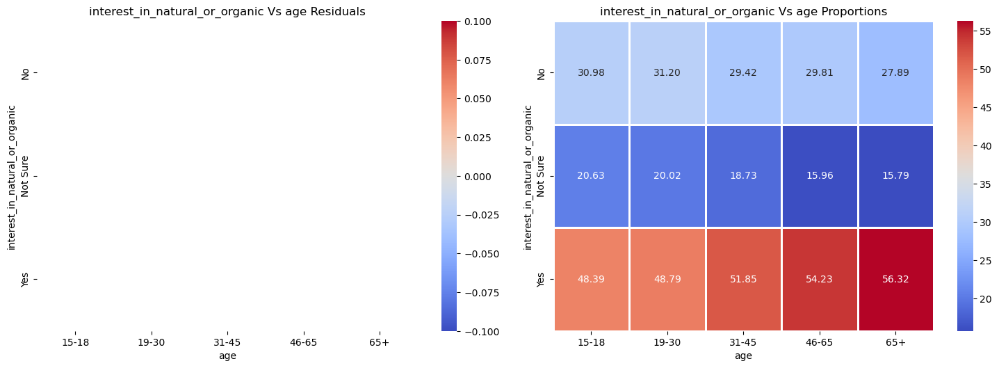

In [29]:
# interest_in_natural_or_organic vs age
heatmap_analysis('interest_in_natural_or_organic','age')
# this warning because of mask applied.

 Chi-sq Statistic: 778.2660656631798, Pvalue: 2.7402493302321964e-155, Cramers_V: 0.13948710206173004
************



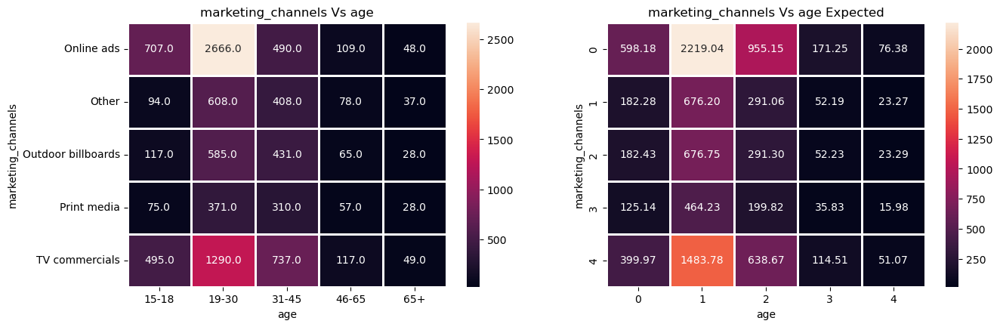

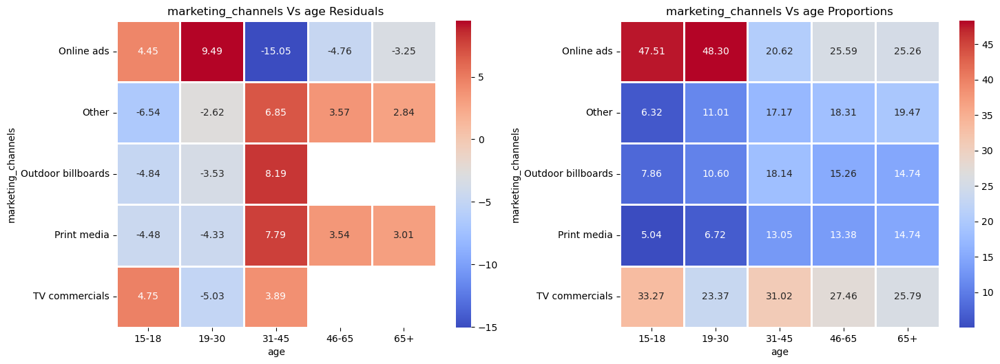

15-18 selected Online ads over other groups 58.68 %
19-30 selected Online ads over other groups 62.36 %
31-45 selected Online ads over other groups -43.75 %
46-65 selected Online ads over other groups -27.77 %
65+ selected Online ads over other groups -28.85 %
15-18 selected Other over other groups -61.7 %
19-30 selected Other over other groups -28.09 %
31-45 selected Other over other groups 24.62 %
46-65 selected Other over other groups 35.69 %
65+ selected Other over other groups 47.49 %
15-18 selected Outdoor billboards over other groups -46.45 %
19-30 selected Outdoor billboards over other groups -24.3 %
31-45 selected Outdoor billboards over other groups 49.74 %
15-18 selected Print media over other groups -57.9 %
19-30 selected Print media over other groups -41.82 %
31-45 selected Print media over other groups 30.87 %
46-65 selected Print media over other groups 35.34 %
65+ selected Print media over other groups 54.36 %
15-18 selected TV commercials over other groups 23.62 %
19-3

In [30]:
# marketing_channels vs age
heatmap_analysis('marketing_channels','age')
# pvalue < 0.05 and cramer v shows weak association between variables.

 Chi-sq Statistic: 22.30531283465285, Pvalue: 0.13360415181600163, Cramers_V: 0.023614250376971978


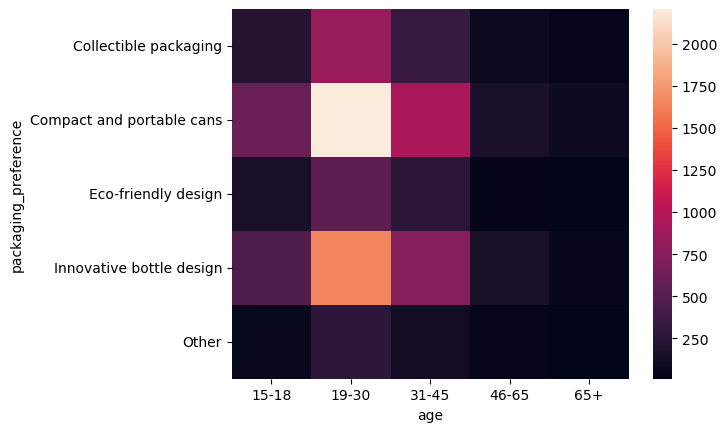

In [31]:
# packaging_preference vs age
chi_sq_test('packaging_preference','age')
heatmap_creator('packaging_preference','age')

 Chi-sq Statistic: 1.677583729882343, Pvalue: 0.9893523703602528, Cramers_V: 0.009158558101257925


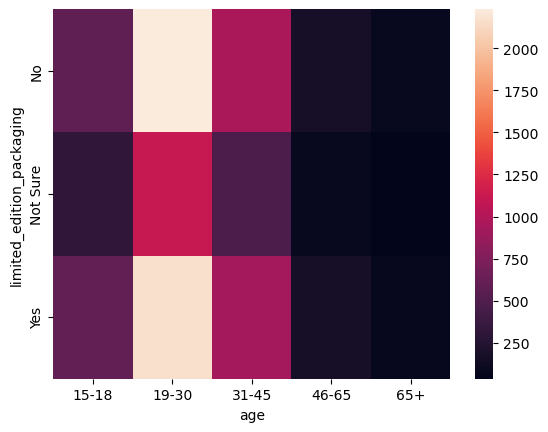

In [32]:
# limited_edition_packaging vs age
chi_sq_test('limited_edition_packaging','age')
heatmap_creator('limited_edition_packaging','age')

 Chi-sq Statistic: 1227.0171175981975, Pvalue: 2.6308027407614466e-255, Cramers_V: 0.2022388948412411
************



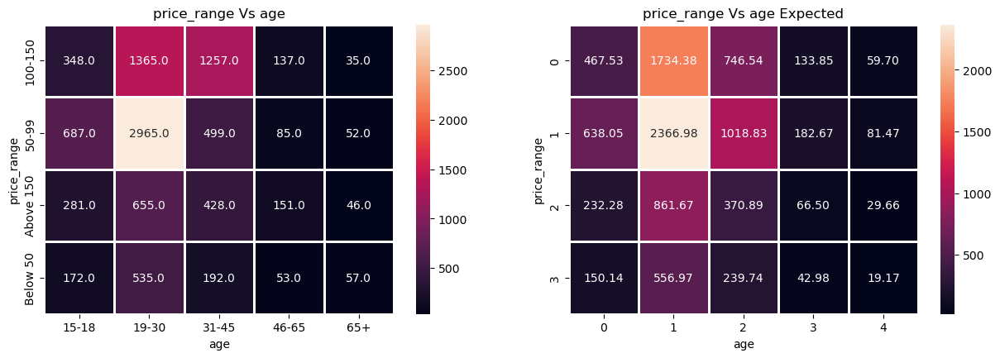

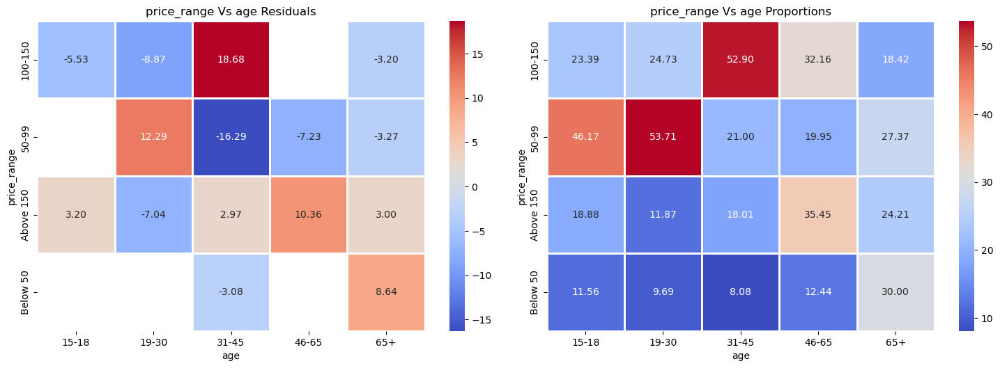

15-18 selected 100-150 over other groups -27.04 %
19-30 selected 100-150 over other groups -22.04 %
31-45 selected 100-150 over other groups 114.41 %
65+ selected 100-150 over other groups -44.67 %
19-30 selected 50-99 over other groups 87.66 %
31-45 selected 50-99 over other groups -42.93 %
46-65 selected 50-99 over other groups -46.16 %
65+ selected 50-99 over other groups -22.27 %
15-18 selected Above 150 over other groups -15.63 %
19-30 selected Above 150 over other groups -50.84 %
31-45 selected Above 150 over other groups -20.3 %
46-65 selected Above 150 over other groups 94.29 %
65+ selected Above 150 over other groups 15.0 %
31-45 selected Below 50 over other groups -49.25 %
65+ selected Below 50 over other groups 187.26 %


In [33]:
# price_range vs age
heatmap_analysis('price_range','age')
#p value < 0.05 and cramers v shows weak association.

 Chi-sq Statistic: 18.7761156275675, Pvalue: 0.2804439103389592, Cramers_V: 0.021665707712631672


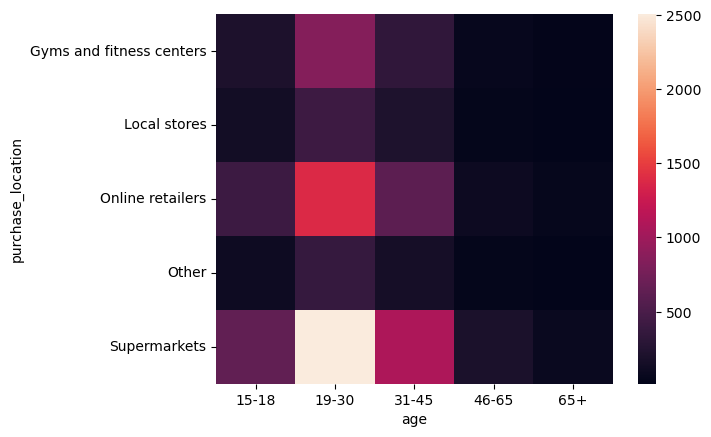

In [34]:
# purchase_location vs age
chi_sq_test('purchase_location','age')
heatmap_creator('purchase_location','age')

 Chi-sq Statistic: 20.67530227727101, Pvalue: 0.19133187985668976, Cramers_V: 0.02273505128500429


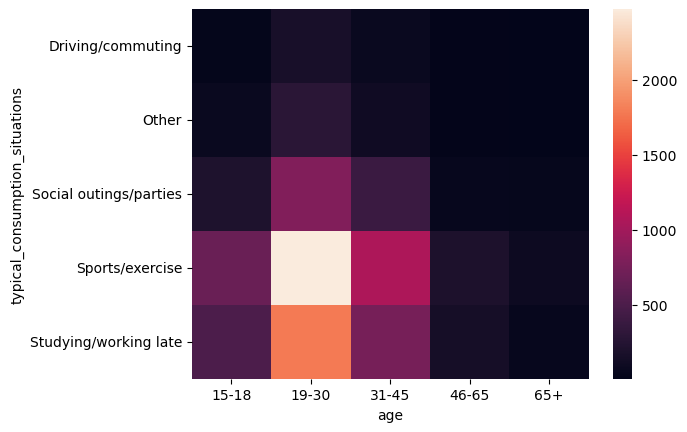

In [35]:
# typical_consumption_situations vs age.
chi_sq_test('typical_consumption_situations','age')
heatmap_creator('typical_consumption_situations','age')
# general consumption situations --> sports, working late.

 Chi-sq Statistic: 3.7960465567521866, Pvalue: 0.43431100421454605, Cramers_V: 0.019483445682815417


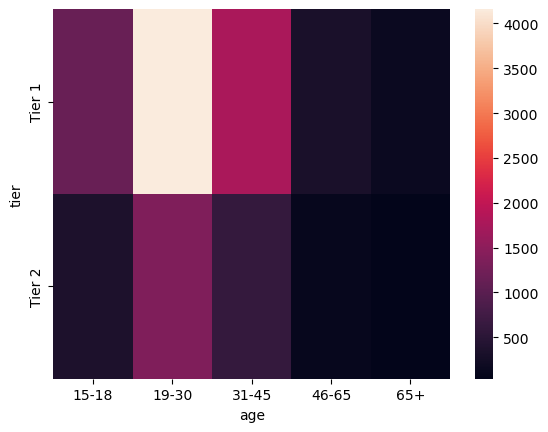

In [36]:
# tier vs age
chi_sq_test('tier','age')
heatmap_creator('tier','age')

In [37]:
# columns vs gender analysis.

In [38]:
columns_to_check = ['consume_time','consume_reason', 'heard_before', 'brand_perception','general_perception', 'tried_before', 'taste_experience',
                    'reasons_preventing_trying','current_brands','reasons_for_choosing_brands', 'improvements_desired','ingredients_expected',
                    'health_concerns','interest_in_natural_or_organic', 'marketing_channels','packaging_preference', 'limited_edition_packaging', 
                    'price_range','purchase_location', 'typical_consumption_situations','age','gender', 'city_id', 'city', 'tier',
                    'consume_freq_scores']
for col in columns_to_check:
    print(10 * '*')
    print(f'{col} VS Gender')
    print()
    print(pd.crosstab(index = df[col], columns = df['gender']))
    chi2_statistic, p_value,dof, expected = chi2_contingency(pd.crosstab(index = df[col], columns = df['gender']))
    print(chi2_statistic, p_value)
    if p_value < 0.05:
        print('Reject Null Hypothesis')
    else:
        print('Fail to Reject Null Hypothesis')
    print(10 * '*')

**********
consume_time VS Gender

gender                           Female  Male  Non-binary
consume_time                                             
Before exercise                    1075  1892         181
For mental alertness                673  1237          85
Throughout the day                  514   861          73
To stay awake during work/study    1193  2048         168
7.8538462502977335 0.24900769105979761
Fail to Reject Null Hypothesis
**********
**********
consume_reason VS Gender

gender                         Female  Male  Non-binary
consume_reason                                         
Increased energy and focus        939  2470         165
Other                             495   321          64
To boost performance              815   614          85
To combat fatigue                 979  1327         122
To enhance sports performance     227  1306          71
940.0894026865832 1.2682969768373422e-197
Reject Null Hypothesis
**********
**********
heard_before VS Gend

 Chi-sq Statistic: 4.454506351193382, Pvalue: 0.8139671625563623, Cramers_V: 0.014923984640827968


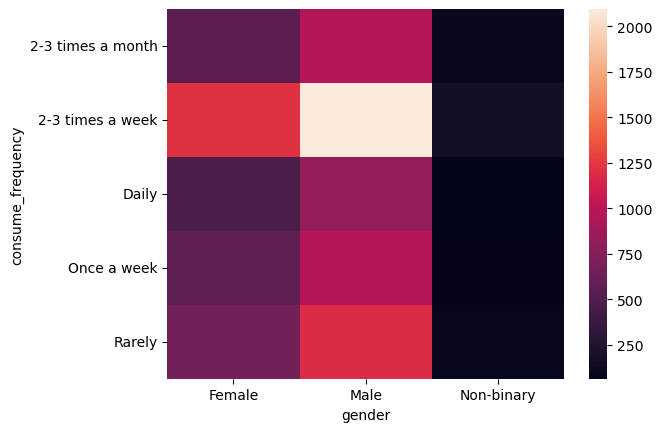

In [39]:
# consume_freq vs gender
chi_sq_test('consume_frequency','gender')
heatmap_creator('consume_frequency','gender')

In [40]:
# anova test remaining:

 Chi-sq Statistic: 940.0894026865832, Pvalue: 1.2682969768373422e-197, Cramers_V: 0.21680514323772201
************



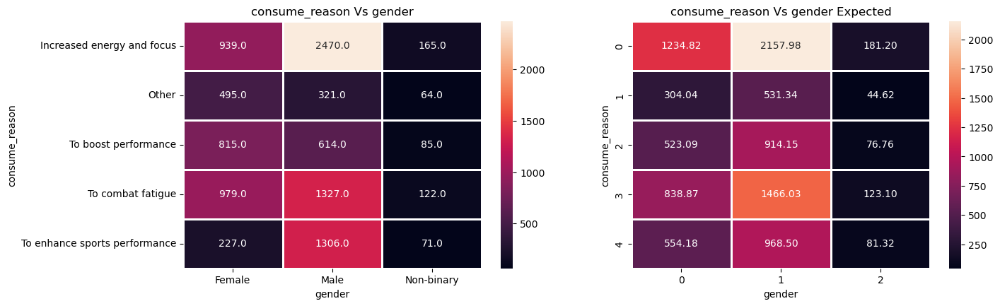

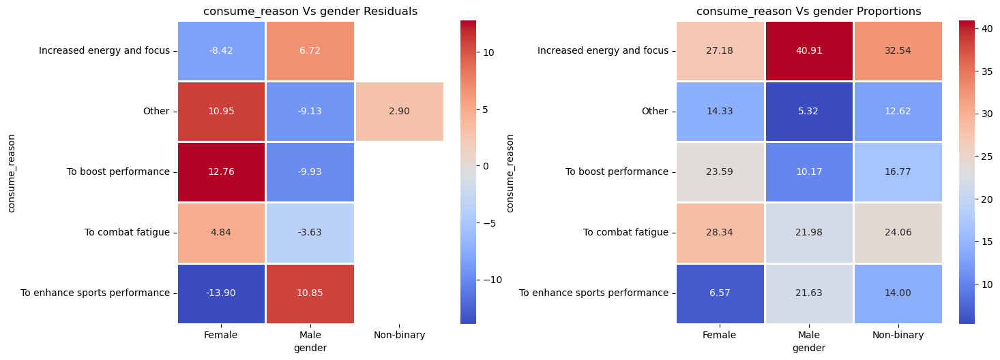

Female selected Increased energy and focus over other groups -26.0 %
Male selected Increased energy and focus over other groups 36.99 %
Female selected Other over other groups 59.73 %
Male selected Other over other groups -60.55 %
Non-binary selected Other over other groups 28.52 %
Female selected To boost performance over other groups 75.16 %
Male selected To boost performance over other groups -49.6 %
Female selected To combat fatigue over other groups 23.09 %
Male selected To combat fatigue over other groups -16.11 %
Female selected To enhance sports performance over other groups -63.12 %
Male selected To enhance sports performance over other groups 110.26 %


In [41]:
# consume_reason vs gender.
heatmap_analysis('consume_reason','gender')
# pvalue <0.05 and cramers v suggests -- weak association.

In [42]:
# heard_before vs gender -- very low practical significance.
chi_sq_test('heard_before','gender')

 Chi-sq Statistic: 39.756590943487524, Pvalue: 2.3279088264416936e-09, Cramers_V: 0.06305282780612423


(gender        Female  Male  Non-binary
 heard_before                          
 No              1788  3506         259
 Yes             1667  2532         248,
 array([[1918.5615, 3352.9014,  281.5371],
        [1536.4385, 2685.0986,  225.4629]]))

 Chi-sq Statistic: 273.0703722393234, Pvalue: 4.779062217240102e-56, Cramers_V: 0.11684827175429754
************



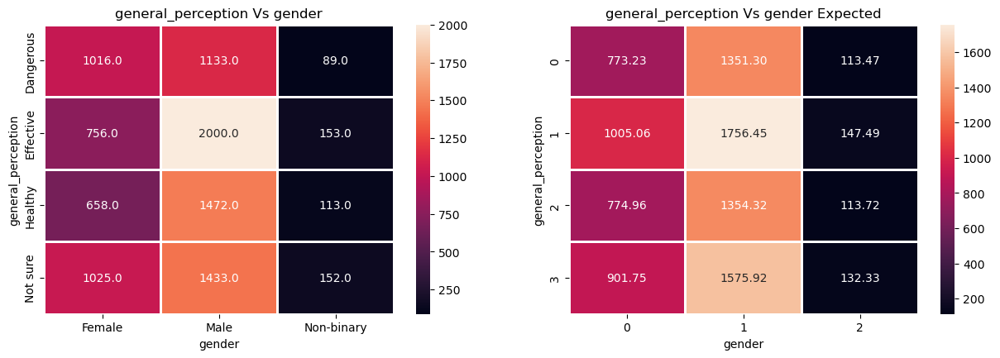

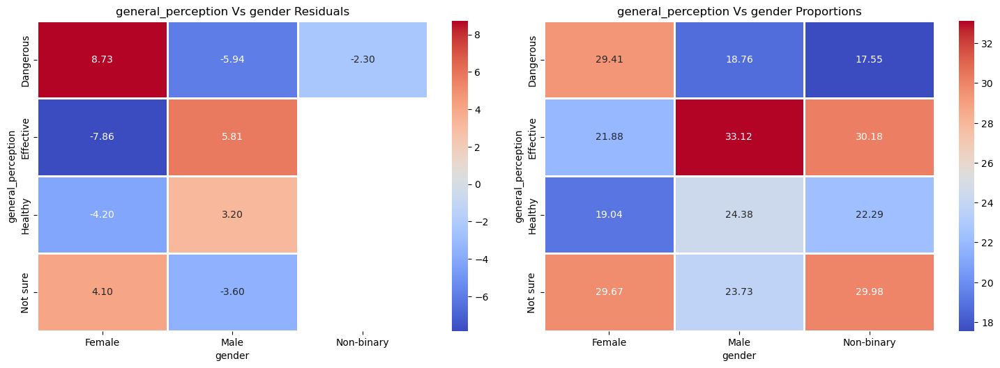

Female selected Dangerous over other groups 61.94 %
Male selected Dangerous over other groups -20.08 %
Non-binary selected Dangerous over other groups -27.12 %
Female selected Effective over other groups -30.87 %
Male selected Effective over other groups 27.25 %
Female selected Healthy over other groups -18.38 %
Male selected Healthy over other groups 17.96 %
Female selected Not sure over other groups 10.46 %
Male selected Not sure over other groups -20.42 %


In [43]:
# general_perception vs gender
heatmap_analysis('general_perception','gender')
# pvalue < 0.05 and cramersv = indicates weak association.

 Chi-sq Statistic: 31.872193226295284, Pvalue: 0.0014480242015424863, Cramers_V: 0.03992004084810991
************



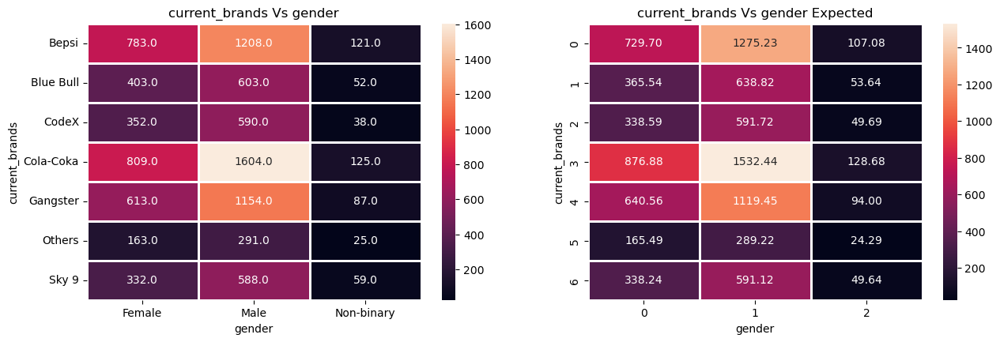

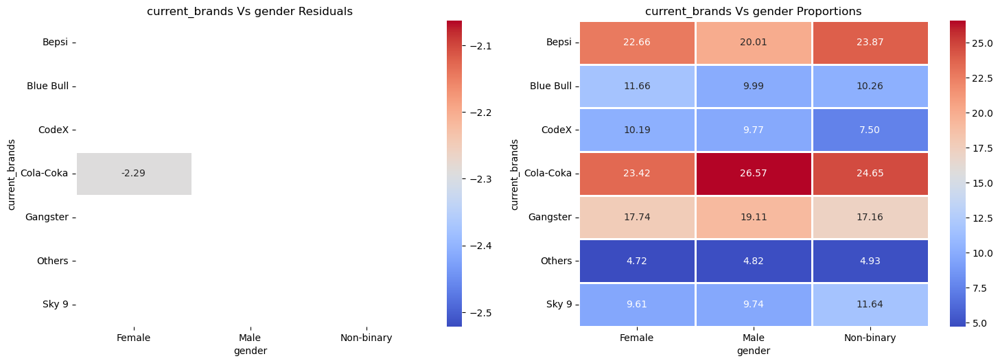

Female selected Cola-Coka over other groups -8.57 %


In [44]:
# current_brands vs gender
heatmap_analysis('current_brands','gender')
# pvalue < 0.05 and Cramers V = is very low.
# not much practical signifance.

 Chi-sq Statistic: 552.6794007541758, Pvalue: 3.452191272469127e-114, Cramers_V: 0.16623468361839774
************



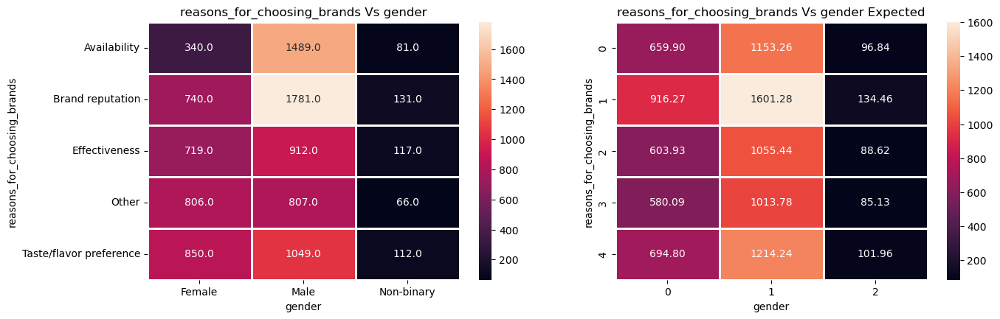

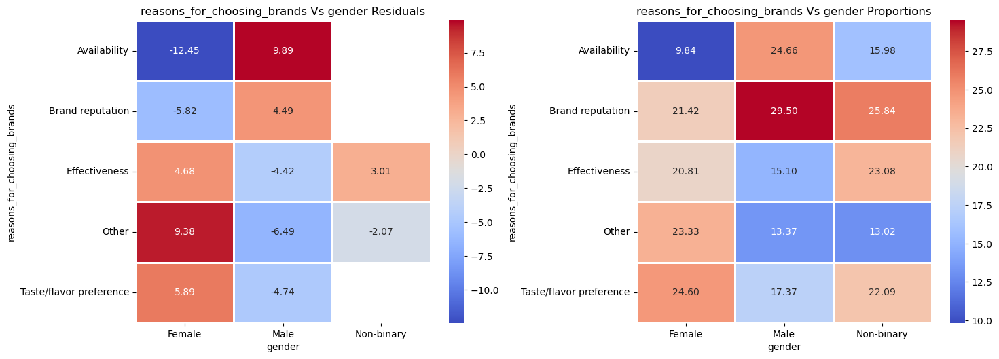

Female selected Availability over other groups -51.57 %
Male selected Availability over other groups 91.04 %
Female selected Brand reputation over other groups -22.59 %
Male selected Brand reputation over other groups 24.84 %
Female selected Effectiveness over other groups 9.01 %
Male selected Effectiveness over other groups -31.17 %
Non-binary selected Effectiveness over other groups 28.51 %
Female selected Other over other groups 76.84 %
Male selected Other over other groups -26.46 %
Non-binary selected Other over other groups -29.05 %
Female selected Taste/flavor preference over other groups 24.68 %
Male selected Taste/flavor preference over other groups -25.58 %


In [45]:
# reasons_for_choosing_brands vs gender
heatmap_analysis('reasons_for_choosing_brands','gender')

 Chi-sq Statistic: 247.60837523920512, Pvalue: 5.535346196306218e-49, Cramers_V: 0.11126733016460967
************



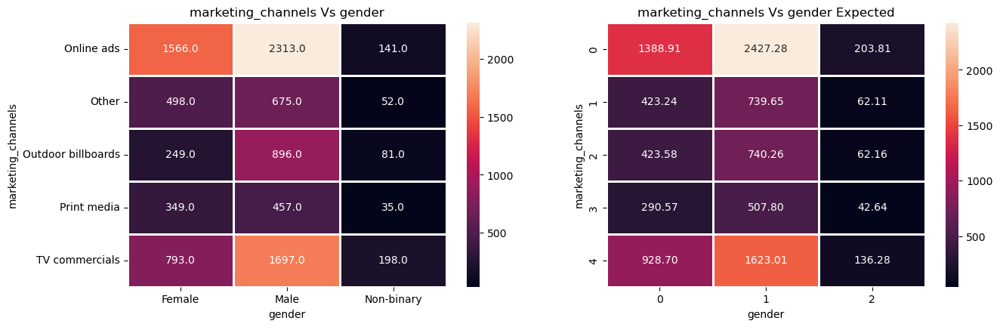

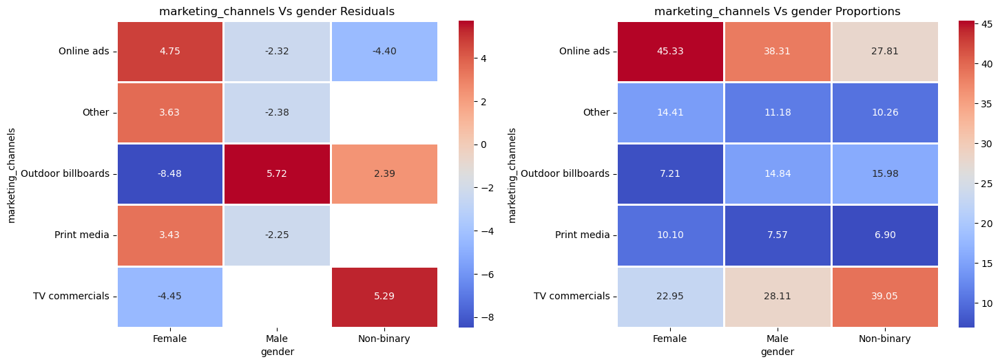

Female selected Online ads over other groups 37.11 %
Male selected Online ads over other groups 4.76 %
Non-binary selected Online ads over other groups -33.49 %
Female selected Other over other groups 34.49 %
Male selected Other over other groups -9.37 %
Female selected Outdoor billboards over other groups -53.23 %
Male selected Outdoor billboards over other groups 28.02 %
Non-binary selected Outdoor billboards over other groups 44.93 %
Female selected Print media over other groups 39.6 %
Male selected Print media over other groups -10.98 %
Female selected TV commercials over other groups -31.65 %
Non-binary selected TV commercials over other groups 52.98 %


In [46]:
# marketing_channels vs gender
heatmap_analysis('marketing_channels','gender')
# pvalue < 0.05 -- means statistically significant
# cramers V: 0.11 -- means weak association.

 Chi-sq Statistic: 288.22870009439436, Pvalue: 2.7185940425128487e-59, Cramers_V: 0.1200476363978888
************



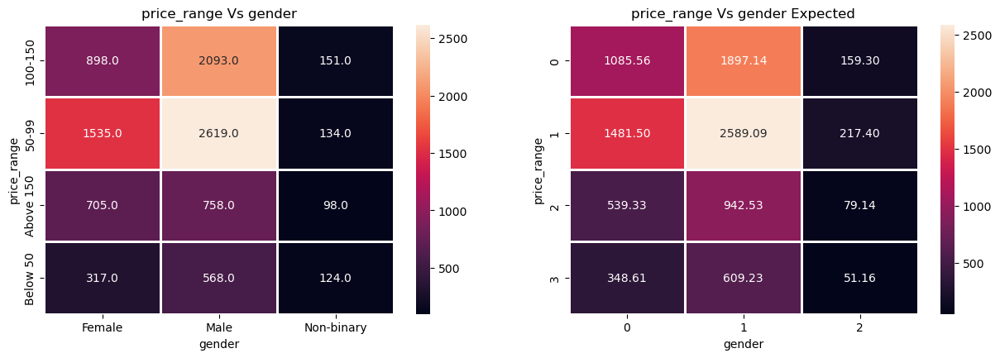

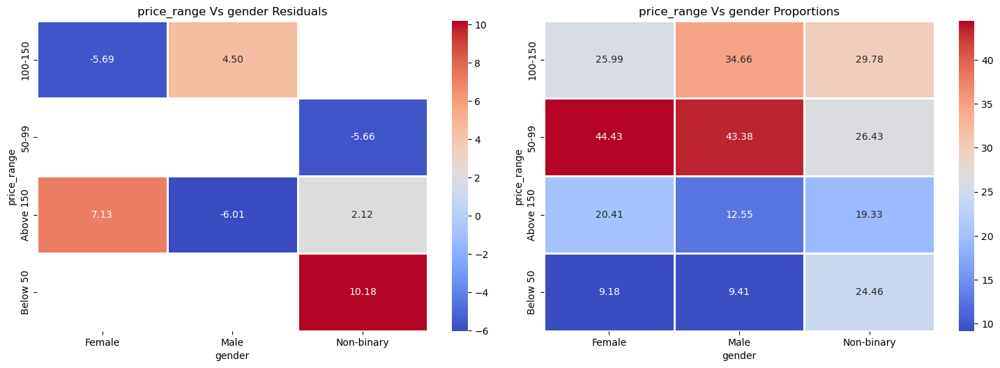

Female selected 100-150 over other groups -19.34 %
Male selected 100-150 over other groups 24.3 %
Non-binary selected 50-99 over other groups -39.8 %
Female selected Above 150 over other groups 28.0 %
Male selected Above 150 over other groups -36.81 %
Non-binary selected Above 150 over other groups 17.29 %
Non-binary selected Below 50 over other groups 163.24 %


In [47]:
# price_range vs gender
heatmap_analysis('price_range','gender')

In [48]:
# city vs gender -- not much practical significance.

In [49]:
# column vs city analysis

In [50]:
for col in columns_to_check:
    print(10 * '*')
    print(f'{col} VS City')
    print()
    chi2_statistic, p_value,dof, expected = chi2_contingency(pd.crosstab(index = df[col], columns = df['city']))
    print(chi2_statistic, p_value)
    if p_value < 0.05:
        print('Reject Null Hypothesis')
    else:
        print('Fail to Reject Null Hypothesis')
    print(10 * '*')

**********
consume_time VS City

1071.8160977609168 1.4086932920495432e-208
Reject Null Hypothesis
**********
**********
consume_reason VS City

263.3017740463073 2.3087562732904397e-36
Reject Null Hypothesis
**********
**********
heard_before VS City

252.9613494193803 2.3641210575244327e-49
Reject Null Hypothesis
**********
**********
brand_perception VS City

420.36500734729765 5.139481323315939e-78
Reject Null Hypothesis
**********
**********
general_perception VS City

18.55666352918821 0.8855867732390149
Fail to Reject Null Hypothesis
**********
**********
tried_before VS City

702.0418712461961 2.5171290105665182e-145
Reject Null Hypothesis
**********
**********
taste_experience VS City

31.943307082556274 0.6619882887975781
Fail to Reject Null Hypothesis
**********
**********
reasons_preventing_trying VS City

1355.8314440900822 1.2362538257689626e-254
Reject Null Hypothesis
**********
**********
current_brands VS City

76.3563619822616 0.02427332182749551
Reject Null Hypothesi

 Chi-sq Statistic: 1071.8160977609168, Pvalue: 1.4086932920495432e-208, Cramers_V: 0.18901641002488972
************



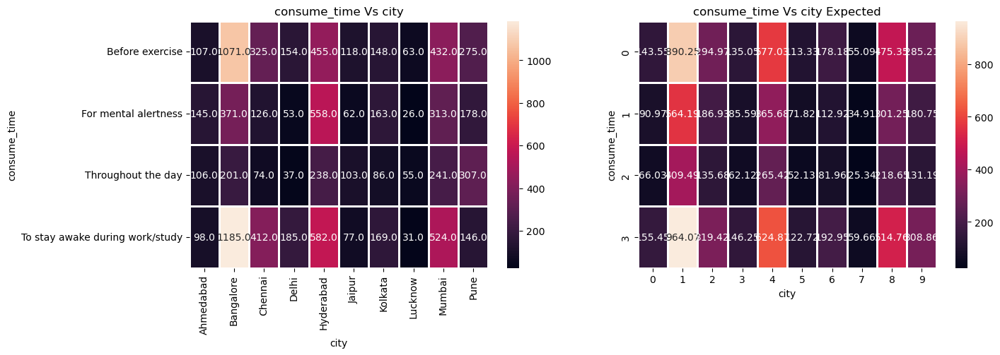

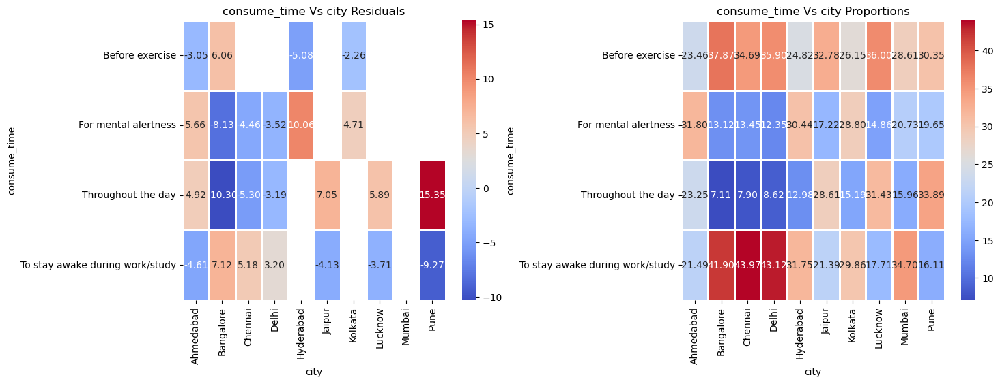

Ahmedabad selected Before exercise over other groups -26.46 %
Bangalore selected Before exercise over other groups 24.96 %
Hyderabad selected Before exercise over other groups -21.83 %
Kolkata selected Before exercise over other groups -17.28 %
Ahmedabad selected For mental alertness over other groups 67.74 %
Bangalore selected For mental alertness over other groups -37.63 %
Chennai selected For mental alertness over other groups -35.95 %
Delhi selected For mental alertness over other groups -41.5 %
Hyderabad selected For mental alertness over other groups 59.32 %
Kolkata selected For mental alertness over other groups 49.29 %
Ahmedabad selected Throughout the day over other groups 29.39 %
Bangalore selected Throughout the day over other groups -64.03 %
Chennai selected Throughout the day over other groups -59.85 %
Delhi selected Throughout the day over other groups -55.98 %
Jaipur selected Throughout the day over other groups 64.72 %
Lucknow selected Throughout the day over other grou

In [51]:
# consumse_time,city
heatmap_analysis('consume_time','city')
# low practical significance -- here as the consumption slight similar in big citites.

 Chi-sq Statistic: 263.3017740463073, Pvalue: 2.3087562732904397e-36, Cramers_V: 0.08113288082619576
************



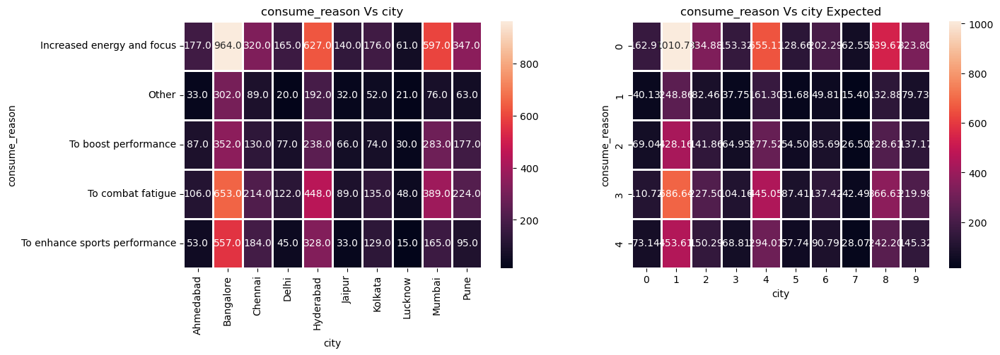

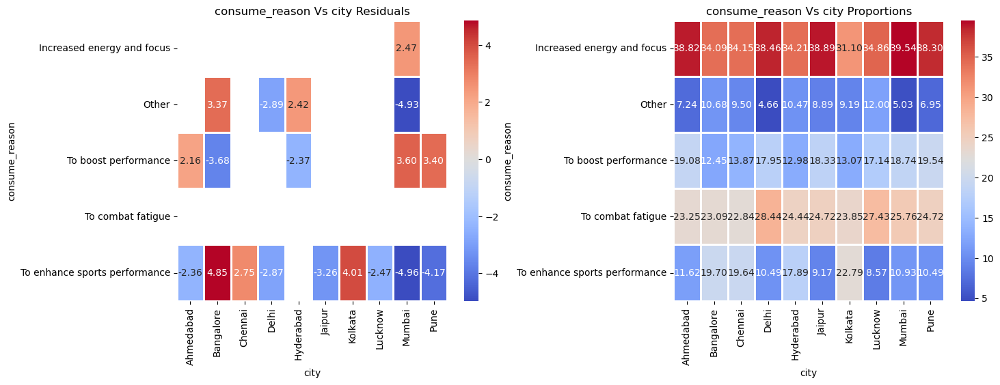

Mumbai selected Increased energy and focus over other groups 10.21 %
Bangalore selected Other over other groups 29.99 %
Delhi selected Other over other groups -47.52 %
Hyderabad selected Other over other groups 27.16 %
Mumbai selected Other over other groups -43.08 %
Ahmedabad selected To boost performance over other groups 19.18 %
Bangalore selected To boost performance over other groups -25.67 %
Hyderabad selected To boost performance over other groups -22.19 %
Mumbai selected To boost performance over other groups 16.8 %
Pune selected To boost performance over other groups 22.42 %
Ahmedabad selected To enhance sports performance over other groups -19.32 %
Bangalore selected To enhance sports performance over other groups 45.79 %
Chennai selected To enhance sports performance over other groups 45.29 %
Delhi selected To enhance sports performance over other groups -27.82 %
Jaipur selected To enhance sports performance over other groups -37.55 %
Kolkata selected To enhance sports perfo

In [52]:
# consume_reason,city
heatmap_analysis('consume_reason','city') # low practical significance.

 Chi-sq Statistic: 252.9613494193803, Pvalue: 2.3641210575244327e-49, Cramers_V: 0.15904758703588692
************



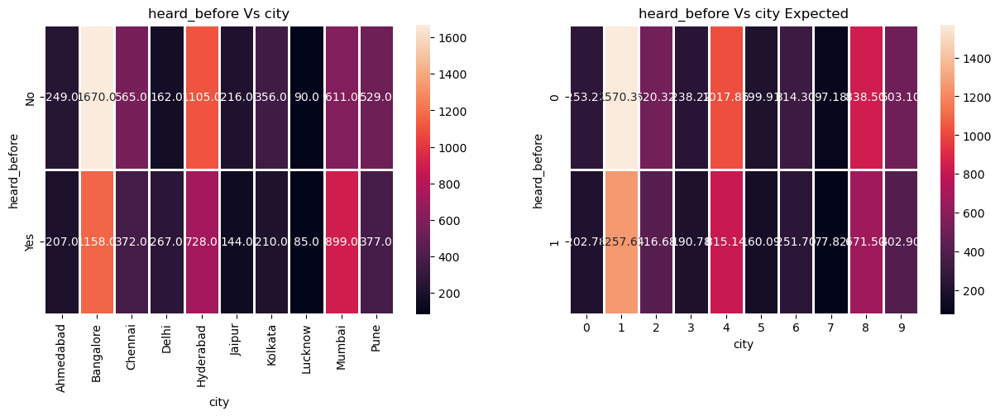

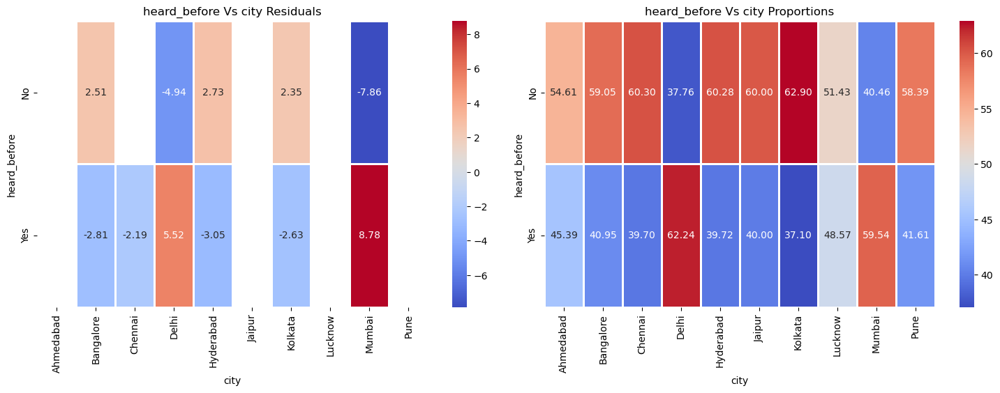

Bangalore selected No over other groups 9.33 %
Delhi selected No over other groups -33.02 %
Hyderabad selected No over other groups 11.89 %
Kolkata selected No over other groups 17.37 %
Mumbai selected No over other groups -27.85 %
Bangalore selected Yes over other groups -10.96 %
Chennai selected Yes over other groups -13.93 %
Delhi selected Yes over other groups 42.68 %
Hyderabad selected Yes over other groups -13.89 %
Kolkata selected Yes over other groups -20.06 %
Mumbai selected Yes over other groups 35.56 %


In [53]:
# heard_before vs city
heatmap_analysis('heard_before','city')

 Chi-sq Statistic: 420.36500734729765, Pvalue: 5.139481323315939e-78, Cramers_V: 0.14497672353645216
************



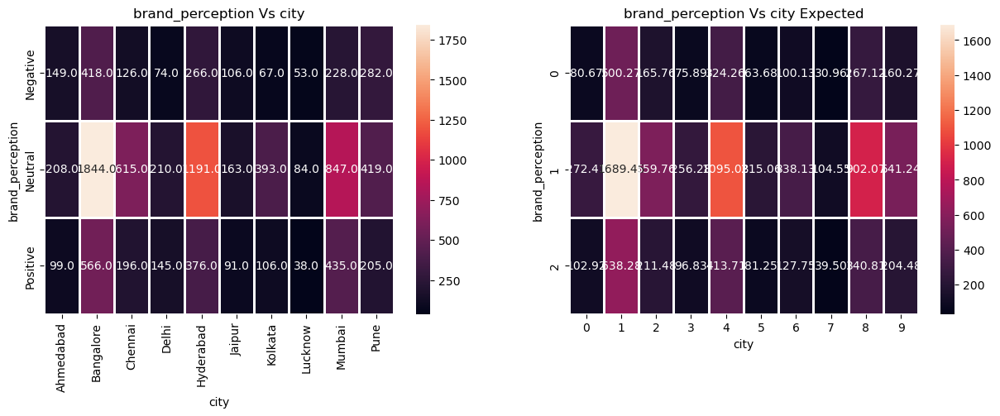

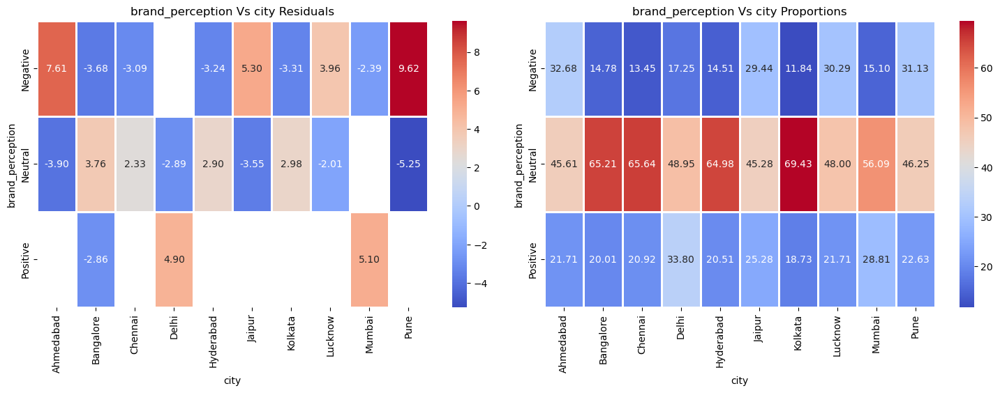

Ahmedabad selected Negative over other groups 65.42 %
Bangalore selected Negative over other groups -32.02 %
Chennai selected Negative over other groups -38.57 %
Hyderabad selected Negative over other groups -33.35 %
Jaipur selected Negative over other groups 46.4 %
Kolkata selected Negative over other groups -46.36 %
Lucknow selected Negative over other groups 51.28 %
Mumbai selected Negative over other groups -30.44 %
Pune selected Negative over other groups 56.21 %
Ahmedabad selected Neutral over other groups -19.48 %
Bangalore selected Neutral over other groups 19.71 %
Chennai selected Neutral over other groups 20.6 %
Delhi selected Neutral over other groups -13.02 %
Hyderabad selected Neutral over other groups 19.23 %
Jaipur selected Neutral over other groups -20.12 %
Kolkata selected Neutral over other groups 28.58 %
Lucknow selected Neutral over other groups -14.87 %
Pune selected Neutral over other groups -18.26 %
Bangalore selected Positive over other groups -15.87 %
Delhi sel

In [54]:
# brand_perception vs city
heatmap_analysis('brand_perception','city')
# pvalue < 0.05 and cramersv = 0.14 weak association.
# pune -- negative brand perception.

 Chi-sq Statistic: 702.0418712461961, Pvalue: 2.5171290105665182e-145, Cramers_V: 0.26496072751375743
************



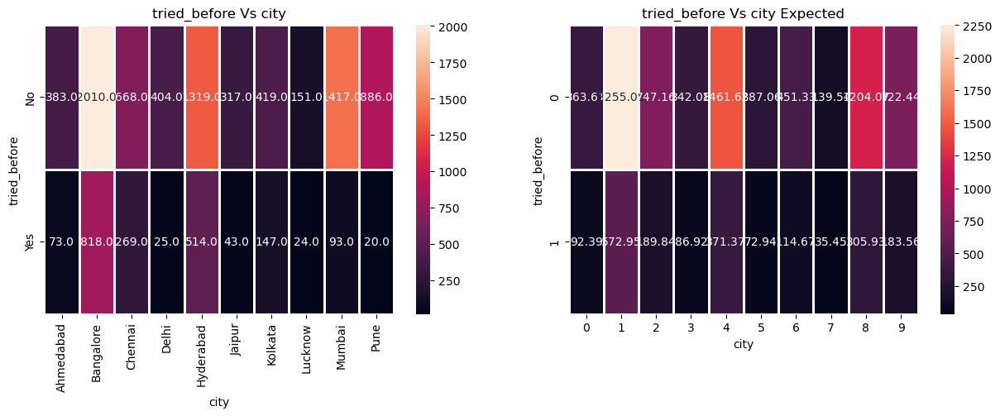

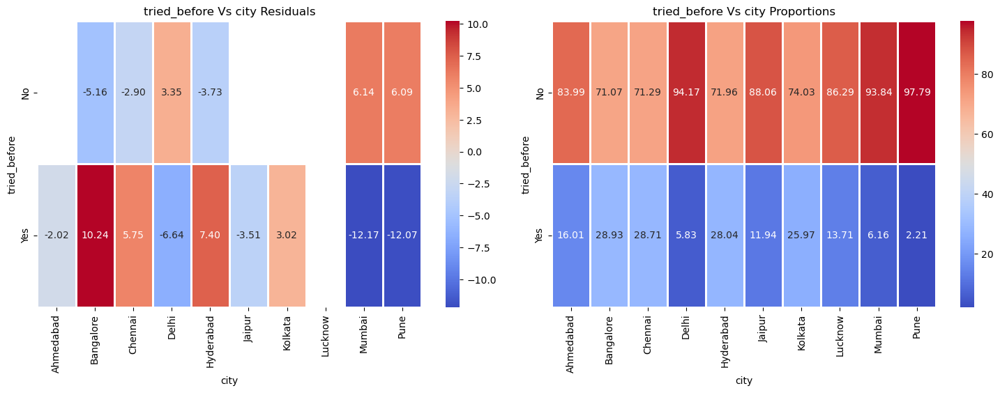

Bangalore selected No over other groups -15.99 %
Chennai selected No over other groups -15.71 %
Delhi selected No over other groups 14.79 %
Hyderabad selected No over other groups -14.85 %
Mumbai selected No over other groups 14.34 %
Pune selected No over other groups 19.79 %
Ahmedabad selected Yes over other groups -4.9 %
Bangalore selected Yes over other groups 87.85 %
Chennai selected Yes over other groups 86.15 %
Delhi selected Yes over other groups -67.56 %
Hyderabad selected Yes over other groups 80.96 %
Jaipur selected Yes over other groups -30.9 %
Kolkata selected Yes over other groups 65.15 %
Mumbai selected Yes over other groups -65.65 %
Pune selected Yes over other groups -87.98 %


In [55]:
# tried_before vs city
heatmap_analysis('tried_before','city')

 Chi-sq Statistic: 1355.8314440900822, Pvalue: 1.2362538257689626e-254, Cramers_V: 0.16467127521763364
************



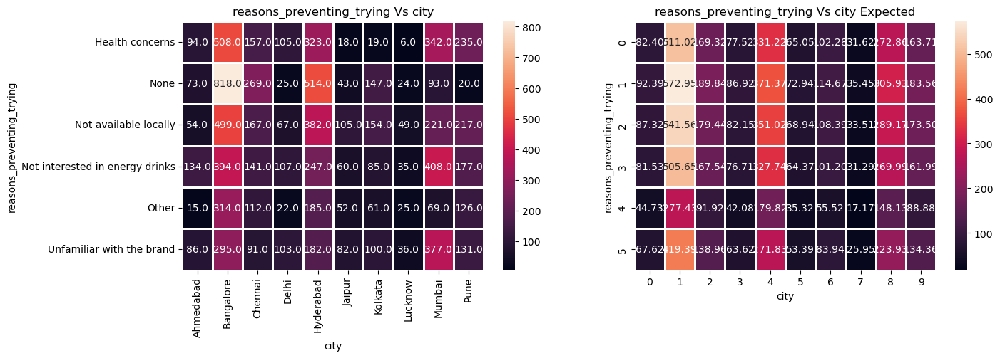

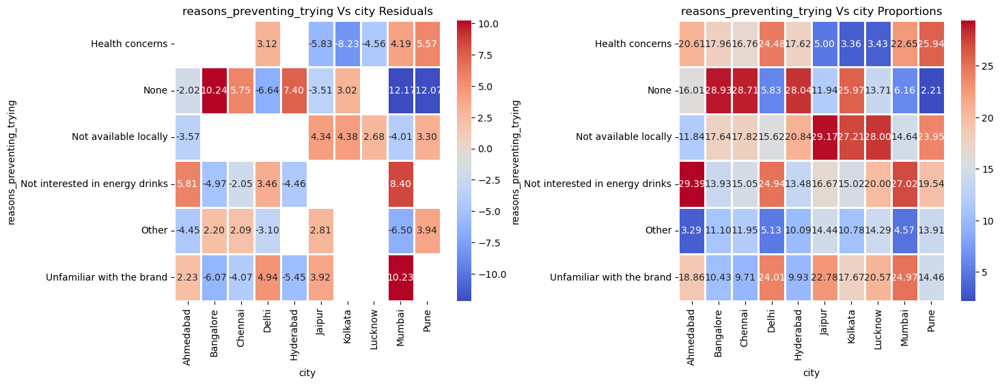

Delhi selected Health concerns over other groups 65.22 %
Jaipur selected Health concerns over other groups -70.55 %
Kolkata selected Health concerns over other groups -80.44 %
Lucknow selected Health concerns over other groups -80.01 %
Mumbai selected Health concerns over other groups 50.82 %
Pune selected Health concerns over other groups 77.03 %
Ahmedabad selected None over other groups -4.9 %
Bangalore selected None over other groups 87.85 %
Chennai selected None over other groups 86.15 %
Delhi selected None over other groups -67.56 %
Hyderabad selected None over other groups 80.96 %
Jaipur selected None over other groups -30.9 %
Kolkata selected None over other groups 65.15 %
Mumbai selected None over other groups -65.65 %
Pune selected None over other groups -87.98 %
Ahmedabad selected Not available locally over other groups -45.31 %
Jaipur selected Not available locally over other groups 47.83 %
Kolkata selected Not available locally over other groups 36.4 %
Lucknow selected Not 

In [56]:
# reasons_preventing_trying vs city
heatmap_analysis('reasons_preventing_trying','city')
# weak association.
# pvalue < 0.05
# for tier 1 cities unfamiliarity with brand is a big reason,
# for pune -- health concern is major issue thats why brand perception is also negative.

In [57]:
df.groupby('tier')['city'].unique()

tier
Tier 1    [Hyderabad, Bangalore, Mumbai, Chennai, Delhi]
Tier 2       [Ahmedabad, Pune, Lucknow, Jaipur, Kolkata]
Name: city, dtype: object

 Chi-sq Statistic: 76.3563619822616, Pvalue: 0.02427332182749551, Cramers_V: 0.035673604149814936
************



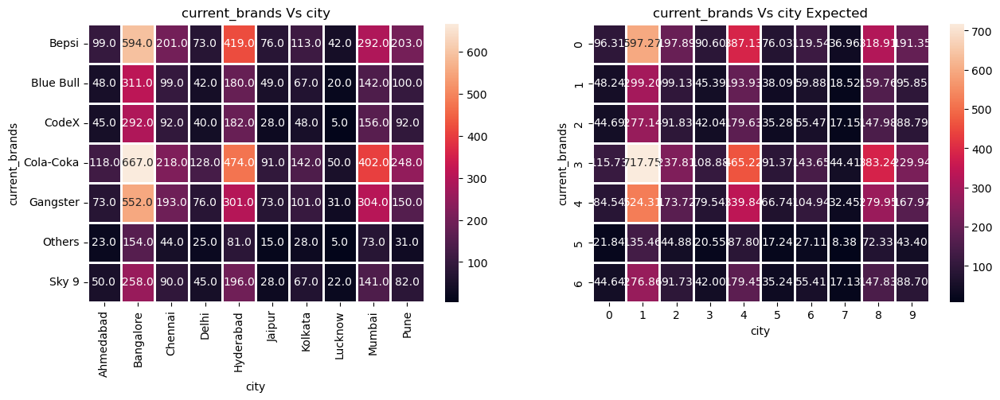

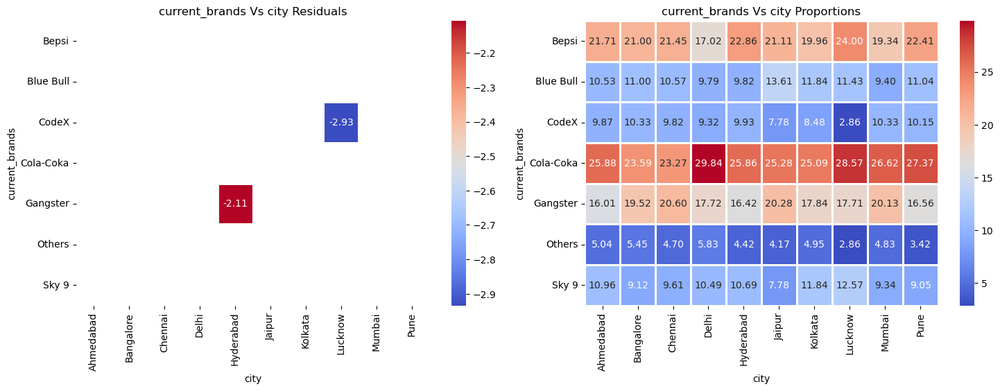

Lucknow selected CodeX over other groups -70.1 %
Hyderabad selected Gangster over other groups -11.17 %


In [58]:
# current_brands vs city
heatmap_analysis('current_brands','city')
# pvalue < 0.05 and cramers v = 0.03 very low to weak association.

 Chi-sq Statistic: 1032.9712083050663, Pvalue: 1.899236955311167e-193, Cramers_V: 0.16069934725326876
************



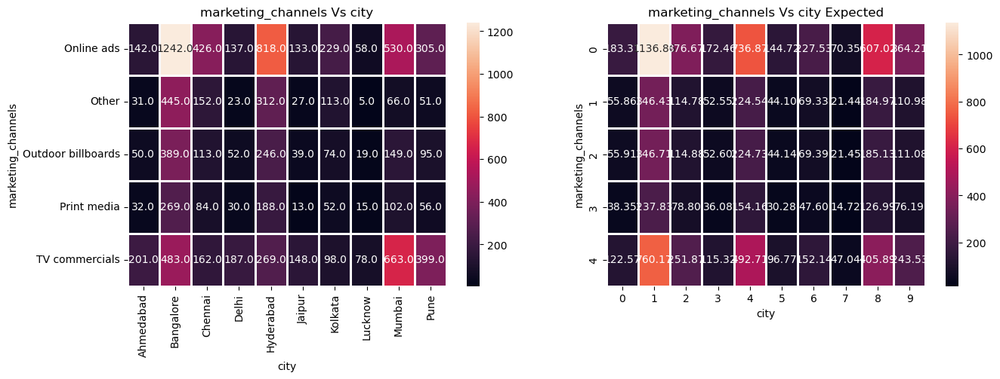

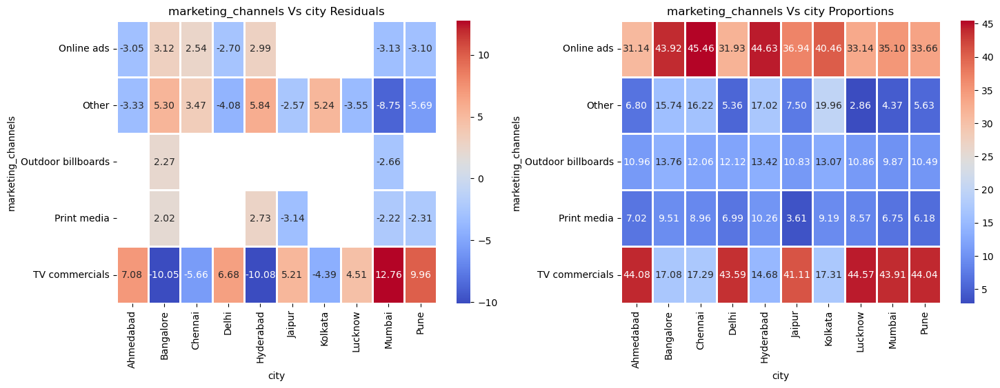

Ahmedabad selected Online ads over other groups -18.82 %
Bangalore selected Online ads over other groups 18.88 %
Chennai selected Online ads over other groups 23.65 %
Delhi selected Online ads over other groups -16.56 %
Hyderabad selected Online ads over other groups 21.06 %
Mumbai selected Online ads over other groups -7.44 %
Pune selected Online ads over other groups -11.6 %
Ahmedabad selected Other over other groups -35.37 %
Bangalore selected Other over other groups 65.2 %
Chennai selected Other over other groups 71.28 %
Delhi selected Other over other groups -49.79 %
Hyderabad selected Other over other groups 81.42 %
Jaipur selected Other over other groups -28.16 %
Kolkata selected Other over other groups 120.48 %
Lucknow selected Other over other groups -73.92 %
Mumbai selected Other over other groups -59.48 %
Pune selected Other over other groups -47.13 %
Bangalore selected Outdoor billboards over other groups 19.4 %
Mumbai selected Outdoor billboards over other groups -17.44 %


In [59]:
# marketing_channels vs city
heatmap_analysis('marketing_channels','city')

In [60]:
df.groupby('tier')['city'].unique()

tier
Tier 1    [Hyderabad, Bangalore, Mumbai, Chennai, Delhi]
Tier 2       [Ahmedabad, Pune, Lucknow, Jaipur, Kolkata]
Name: city, dtype: object

In [61]:
# Columns vs tier analysis.
for col in columns_to_check:
    print(10 * '*')
    print(f'{col} VS Tier')
    print()
    chi2_statistic, p_value,dof, expected = chi2_contingency(pd.crosstab(index = df[col], columns = df['tier']))
    print(chi2_statistic, p_value)
    if p_value < 0.05:
        print('Reject Null Hypothesis')
    else:
        print('Fail to Reject Null Hypothesis')
    print(10 * '*')

**********
consume_time VS Tier

521.5776360365203 1.005275756036997e-112
Reject Null Hypothesis
**********
**********
consume_reason VS Tier

31.970422252073085 1.939911713645264e-06
Reject Null Hypothesis
**********
**********
heard_before VS Tier

11.244599132580852 0.0007985503795911902
Reject Null Hypothesis
**********
**********
brand_perception VS Tier

187.4795881409207 1.9468150747505608e-41
Reject Null Hypothesis
**********
**********
general_perception VS Tier

0.427742216799983 0.9344538202620242
Fail to Reject Null Hypothesis
**********
**********
tried_before VS Tier

122.28584606819642 1.9986477111780256e-28
Reject Null Hypothesis
**********
**********
taste_experience VS Tier

3.0786021709404388 0.5447587703563496
Fail to Reject Null Hypothesis
**********
**********
reasons_preventing_trying VS Tier

179.39962860643527 7.1888387583956136e-37
Reject Null Hypothesis
**********
**********
current_brands VS Tier

13.020119789886511 0.042717553370990625
Reject Null Hypothesi

 Chi-sq Statistic: 521.5776360365203, Pvalue: 1.005275756036997e-112, Cramers_V: 0.22838074262873398
************



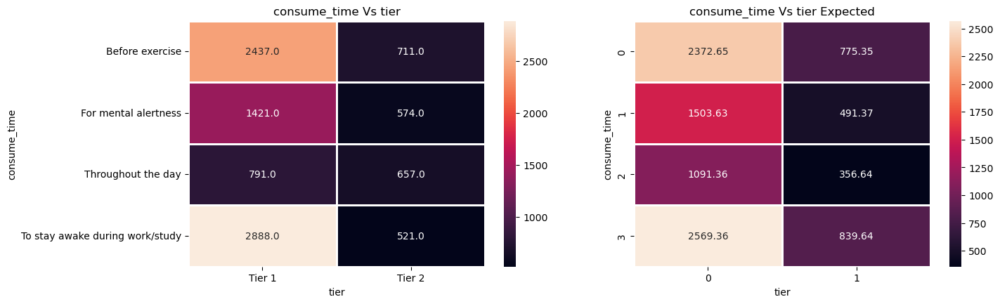

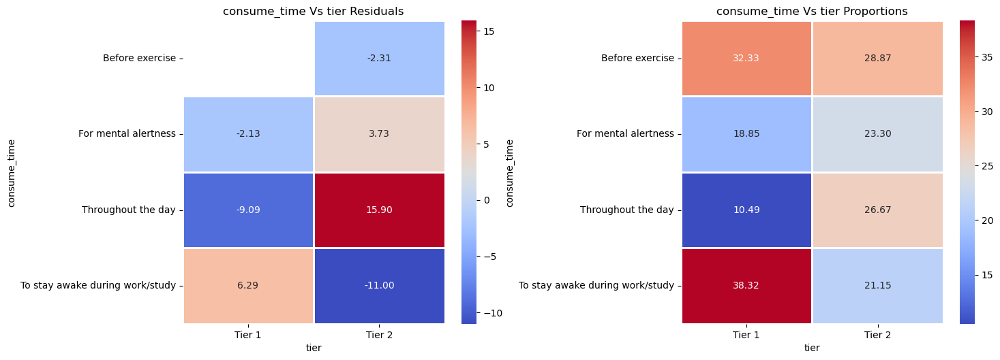

Tier 2 selected Before exercise over other groups -10.72 %
Tier 1 selected For mental alertness over other groups -19.1 %
Tier 2 selected For mental alertness over other groups 23.61 %
Tier 1 selected Throughout the day over other groups -60.66 %
Tier 2 selected Throughout the day over other groups 154.17 %
Tier 1 selected To stay awake during work/study over other groups 81.14 %
Tier 2 selected To stay awake during work/study over other groups -44.8 %


In [62]:
# consume_time vs tier.
heatmap_analysis('consume_time','tier')
# cramers v = 0.23 -- moderate association.

 Chi-sq Statistic: 31.970422252073085, Pvalue: 1.939911713645264e-06, Cramers_V: 0.056542393168376844
************



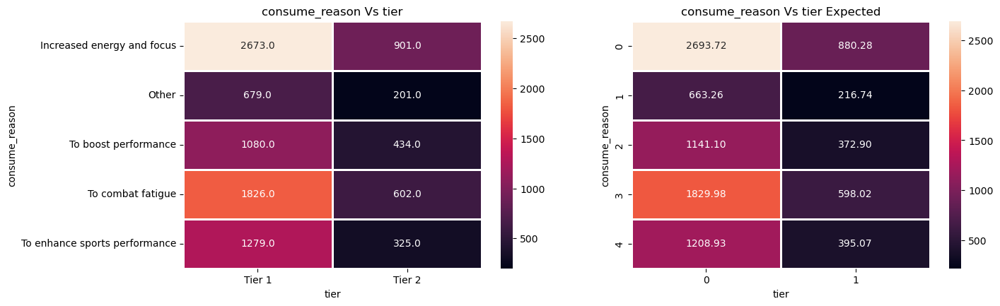

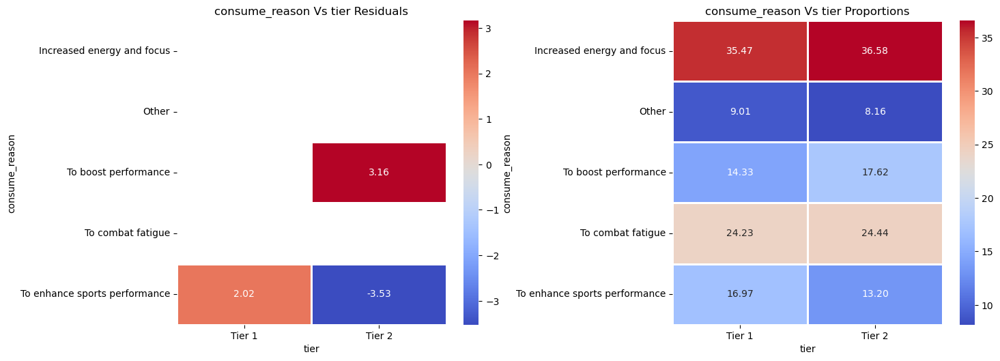

Tier 2 selected To boost performance over other groups 22.97 %
Tier 1 selected To enhance sports performance over other groups 28.6 %
Tier 2 selected To enhance sports performance over other groups -22.24 %


In [63]:
# consume_reason vs tier
heatmap_analysis('consume_reason','tier')
# weak association.

 Chi-sq Statistic: 179.39962860643527, Pvalue: 7.1888387583956136e-37, Cramers_V: 0.13394014656048248
************



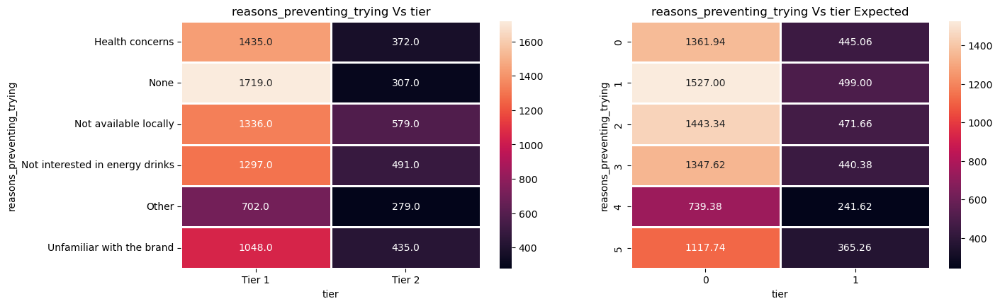

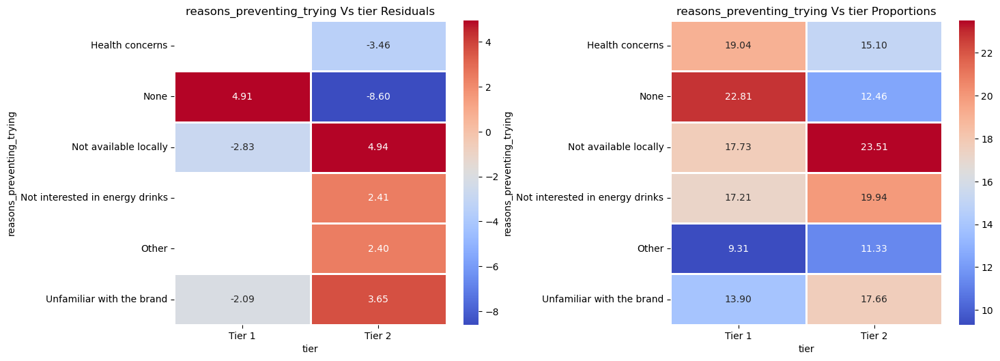

Tier 2 selected Health concerns over other groups -20.67 %
Tier 1 selected None over other groups 82.98 %
Tier 2 selected None over other groups -45.35 %
Tier 1 selected Not available locally over other groups -24.6 %
Tier 2 selected Not available locally over other groups 32.62 %
Tier 2 selected Not interested in energy drinks over other groups 15.84 %
Tier 2 selected Other over other groups 21.62 %
Tier 1 selected Unfamiliar with the brand over other groups -21.27 %
Tier 2 selected Unfamiliar with the brand over other groups 27.02 %


In [64]:
# reasons_preventing_trying vs tier
heatmap_analysis('reasons_preventing_trying','tier')
# pvalue < 0.05 and cramers v = 0.13 weak association.

 Chi-sq Statistic: 13.020119789886511, Pvalue: 0.042717553370990625, Cramers_V: 0.03608340309600317
************



D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


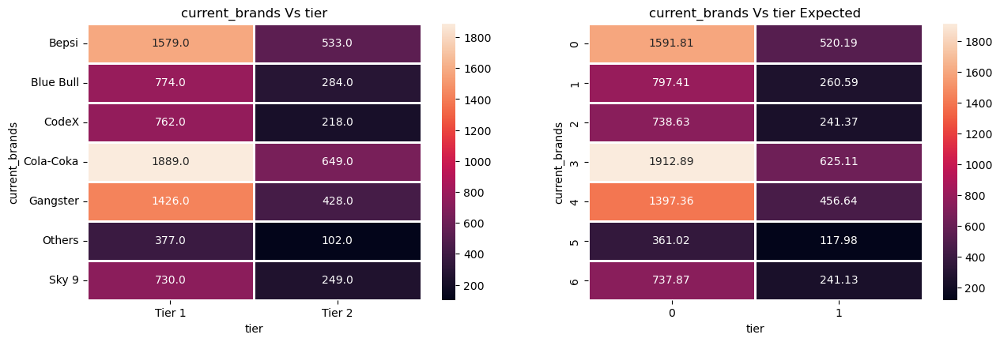

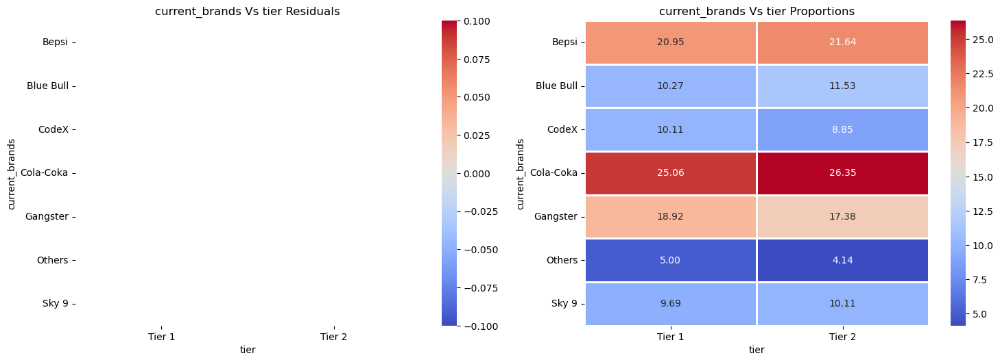

In [65]:
# current_brands vs tier
heatmap_analysis('current_brands','tier')  # weak association -- cola - coka followed bepsi and then gangster.

 Chi-sq Statistic: 50.90933225635677, Pvalue: 2.3317460338043885e-10, Cramers_V: 0.07135077592875691
************



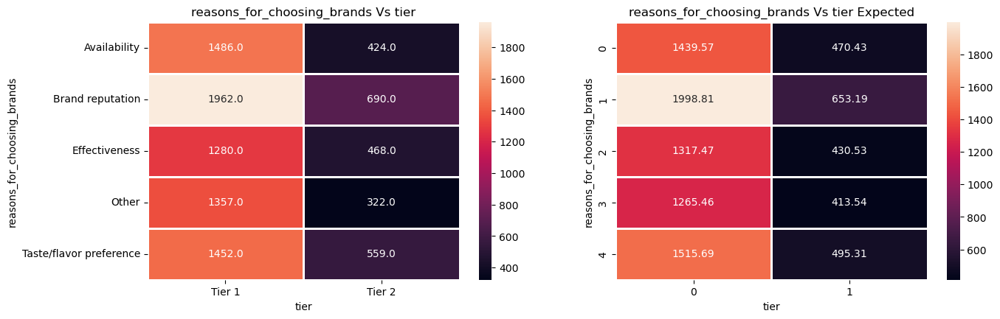

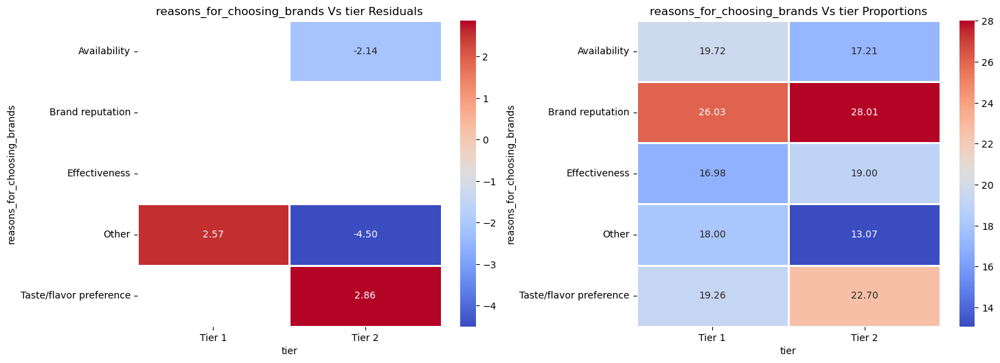

Tier 2 selected Availability over other groups -12.69 %
Tier 1 selected Other over other groups 37.72 %
Tier 2 selected Other over other groups -27.39 %
Tier 2 selected Taste/flavor preference over other groups 17.81 %


In [66]:
# reasons_for_choosing_brands vs tier.
heatmap_analysis('reasons_for_choosing_brands','tier')

 Chi-sq Statistic: 194.92296255207822, Pvalue: 4.637488533540105e-41, Cramers_V: 0.1396148138816502
************



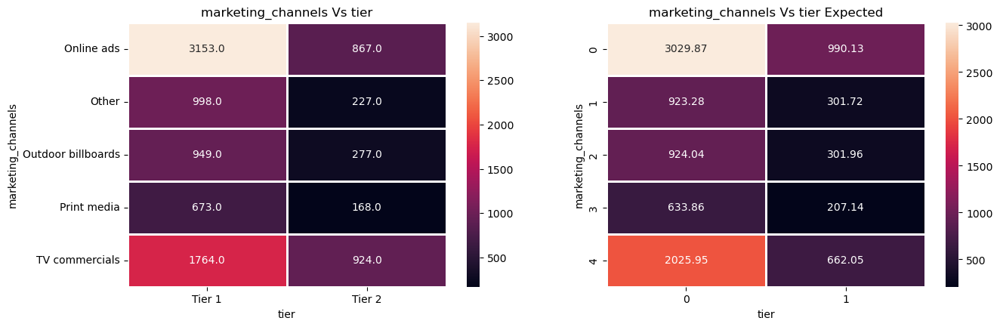

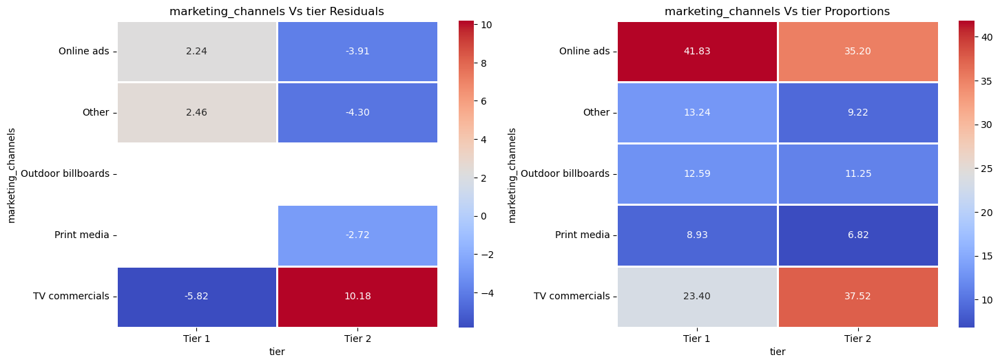

Tier 1 selected Online ads over other groups 18.84 %
Tier 2 selected Online ads over other groups -15.85 %
Tier 1 selected Other over other groups 43.67 %
Tier 2 selected Other over other groups -30.4 %
Tier 2 selected Print media over other groups -23.61 %
Tier 1 selected TV commercials over other groups -37.61 %
Tier 2 selected TV commercials over other groups 60.29 %


In [67]:
# marketing_channels vs tier
heatmap_analysis('marketing_channels','tier')
# weak association.

In [68]:
# proportional analysis is very important here.

In [69]:
# free flow analysis

In [70]:
# consume_frequency vs consume_time

 Chi-sq Statistic: 79.37406369289141, Pvalue: 5.4323887366942806e-12, Cramers_V: 0.05143736115992324
************



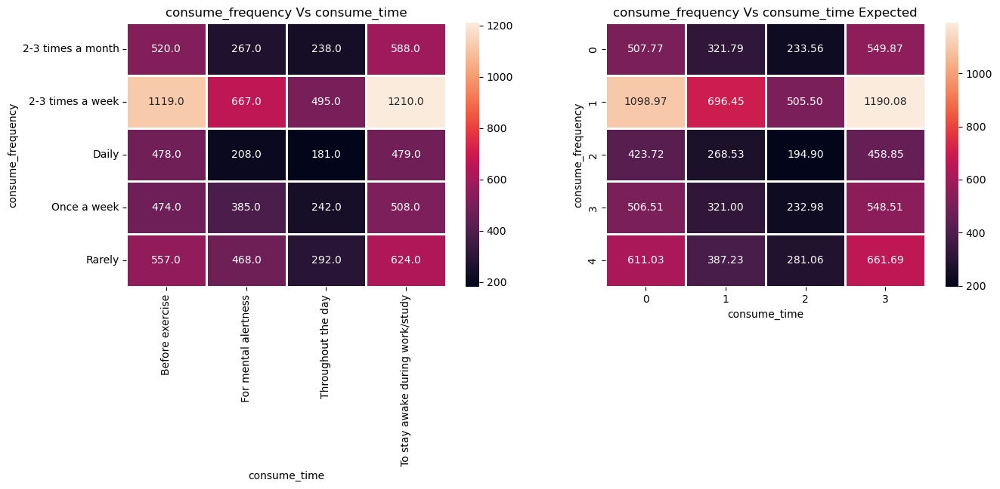

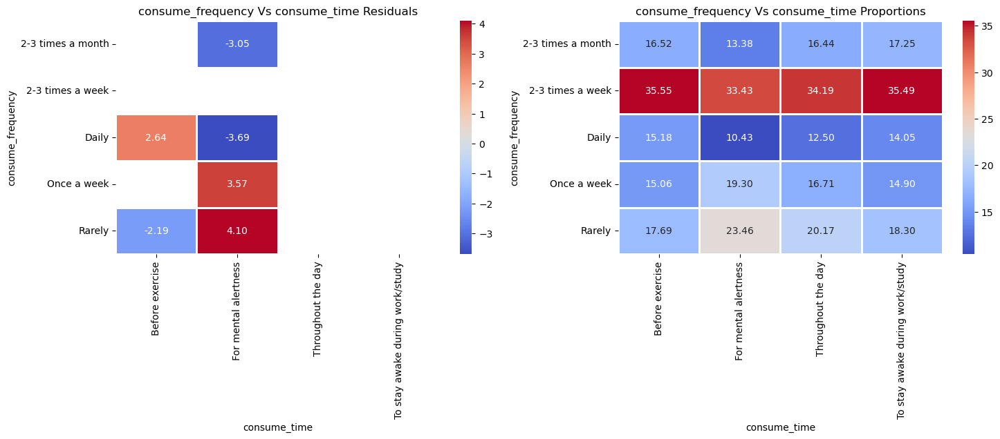

For mental alertness selected 2-3 times a month over other groups -20.02 %
Before exercise selected Daily over other groups 23.19 %
For mental alertness selected Daily over other groups -25.06 %
For mental alertness selected Once a week over other groups 24.05 %
Before exercise selected Rarely over other groups -14.29 %
For mental alertness selected Rarely over other groups 25.3 %


In [71]:
heatmap_analysis('consume_frequency','consume_time')
# 2/3 times a week is most popular.

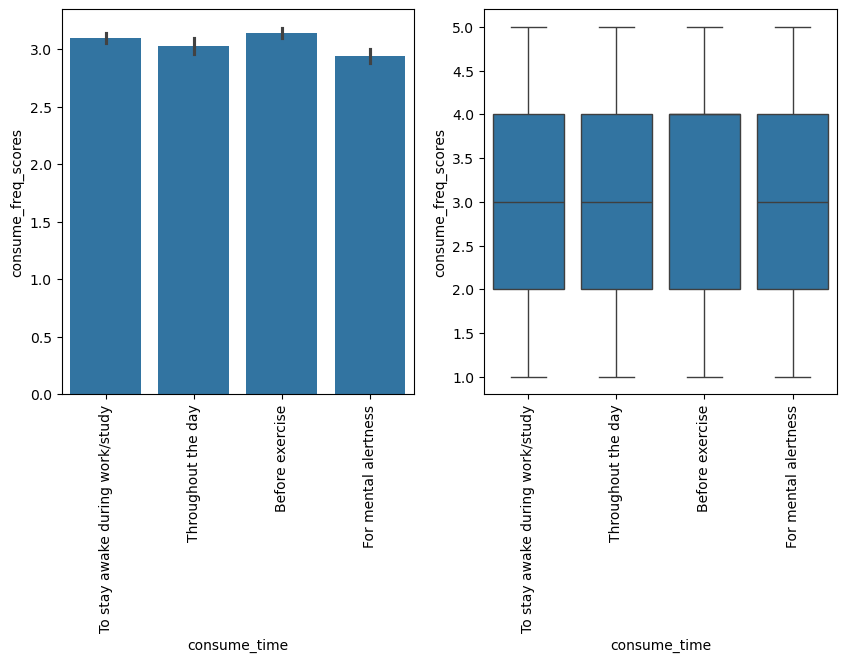

In [72]:
fig = plt.figure(figsize = (10,5),)
ax1 = fig.add_subplot(1,2,1)
sns.barplot(data = df, x = 'consume_time', y = 'consume_freq_scores', estimator = 'mean',ax = ax1)
ax1.tick_params(axis = 'x', rotation = 90)
ax2 = fig.add_subplot(1,2,2)
sns.boxplot(data = df, x = 'consume_time', y = 'consume_freq_scores', ax = ax2)
ax2.tick_params(axis = 'x', rotation = 90)

 Chi-sq Statistic: 12.716516863548026, Pvalue: 0.012747308175580728, Cramers_V: 0.03566022555109267
************



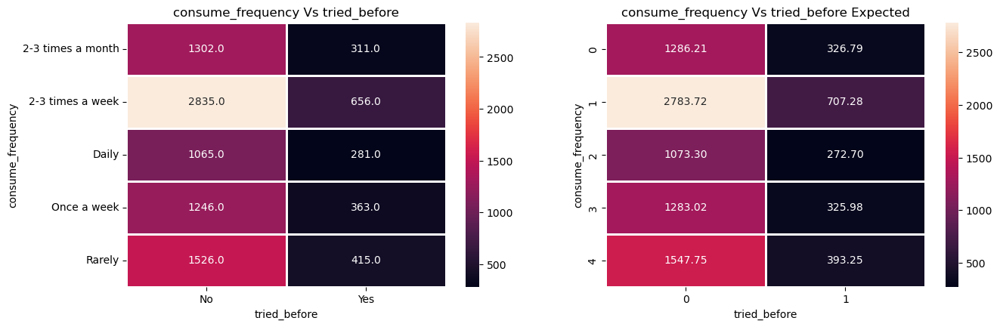

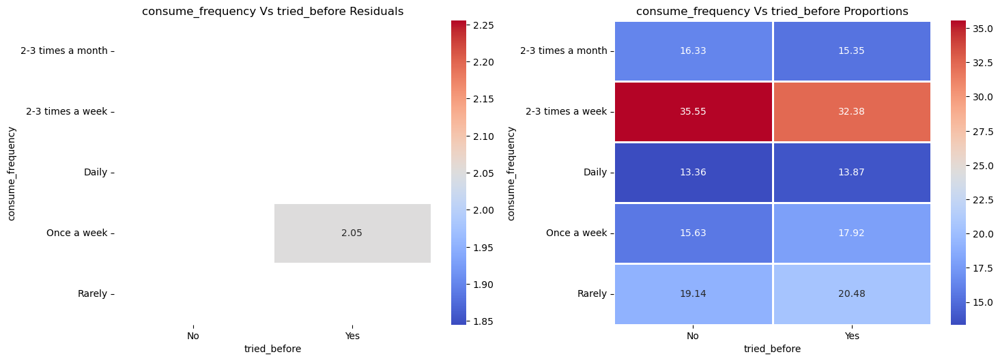

Yes selected Once a week over other groups 14.66 %


In [73]:
# consume_frequency vs tried_before(our drink)
heatmap_analysis('consume_frequency','tried_before')   # there is weak association.

In [74]:
# proportional analysis is imp here because see the rare customer have tried our product so it seems that our current marketing strategy 
# is compelling people to try our product -- but we need to improve.
# and regular drinkers are not driking because of brand perception, or non local availability.

 Chi-sq Statistic: 8.13300526842831, Pvalue: 0.08682576492916548, Cramers_V: 0.028518424340114427


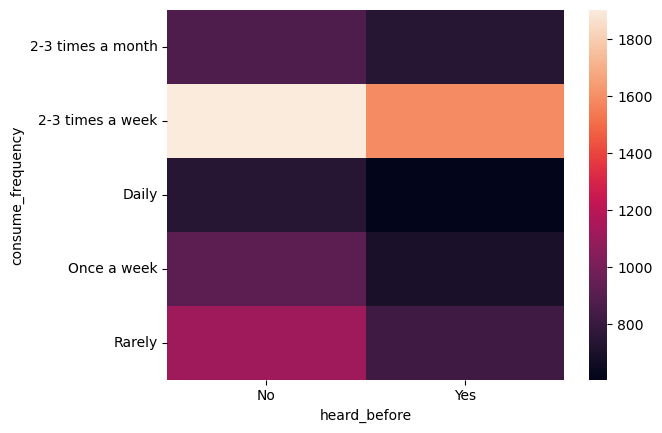

In [75]:
# consume_frequency vs heard_before(our drinks)
chi_sq_test('consume_frequency','heard_before') # very weak association.
heatmap_creator('consume_frequency','heard_before')

 Chi-sq Statistic: 10.325989149131875, Pvalue: 0.24288704034289935, Cramers_V: 0.02272222386687962


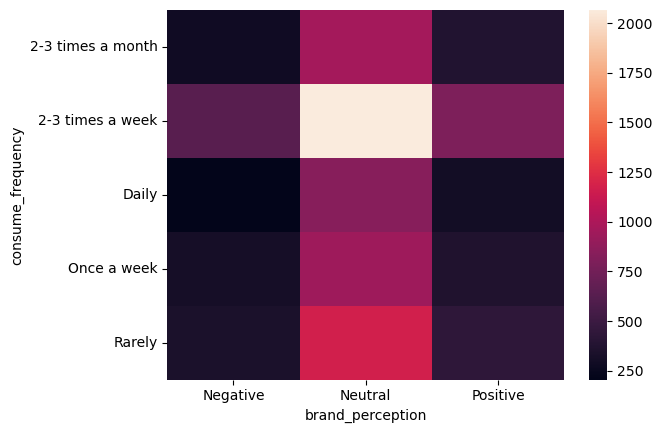

In [76]:
# consume_frequency vs brand_perception(our brand)
chi_sq_test('consume_frequency','brand_perception') # very weak association.
heatmap_creator('consume_frequency','brand_perception')

 Chi-sq Statistic: 31.84924834901844, Pvalue: 0.010461266023906561, Cramers_V: 0.02821756914983041
************



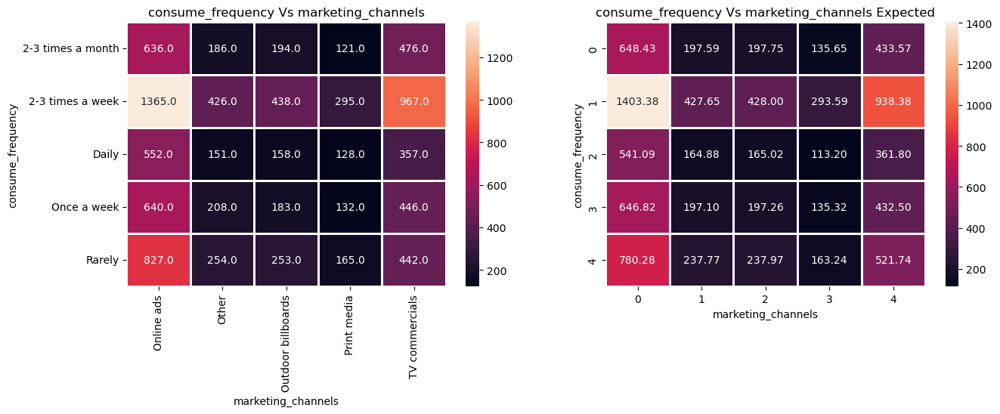

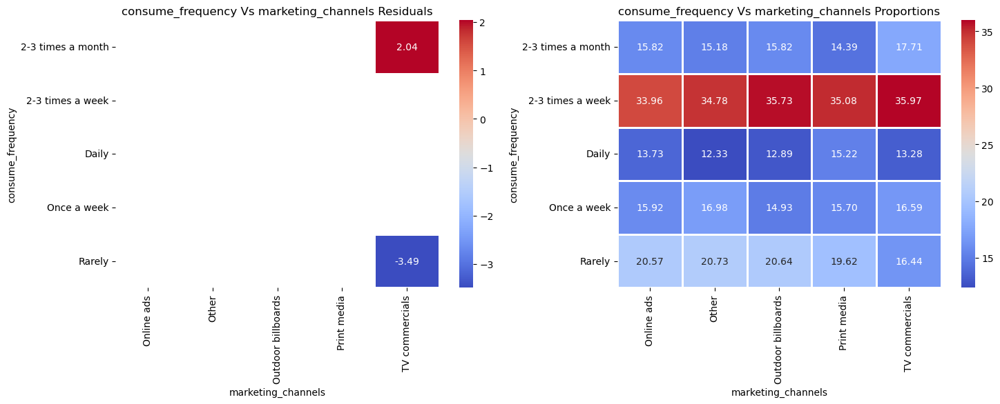

TV commercials selected 2-3 times a month over other groups 15.71 %
TV commercials selected Rarely over other groups -19.36 %


In [77]:
# consume_freq vs marketing_channels.
heatmap_analysis('consume_frequency','marketing_channels') # weak association.
# no specific relation is present here.

 Chi-sq Statistic: 21.24648693530586, Pvalue: 0.6241449994490778, Cramers_V: 0.023046955837651237


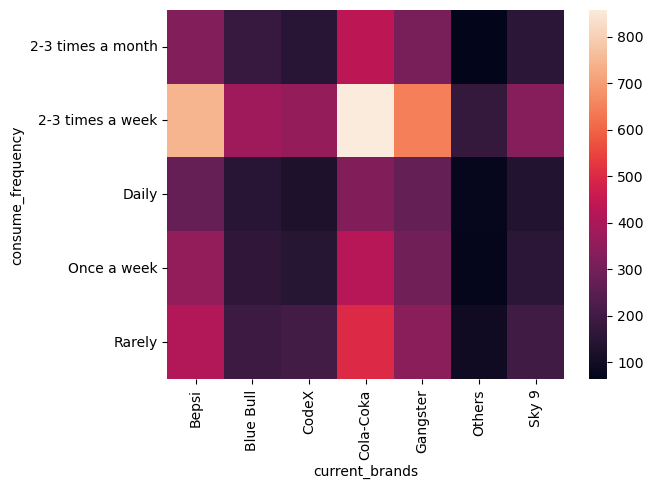

In [78]:
# consume_frequency vs current_brands.
chi_sq_test('consume_frequency','current_brands')
heatmap_creator('consume_frequency','current_brands')

 Chi-sq Statistic: 21.733550518497317, Pvalue: 0.15200507525243762, Cramers_V: 0.023309628117205838


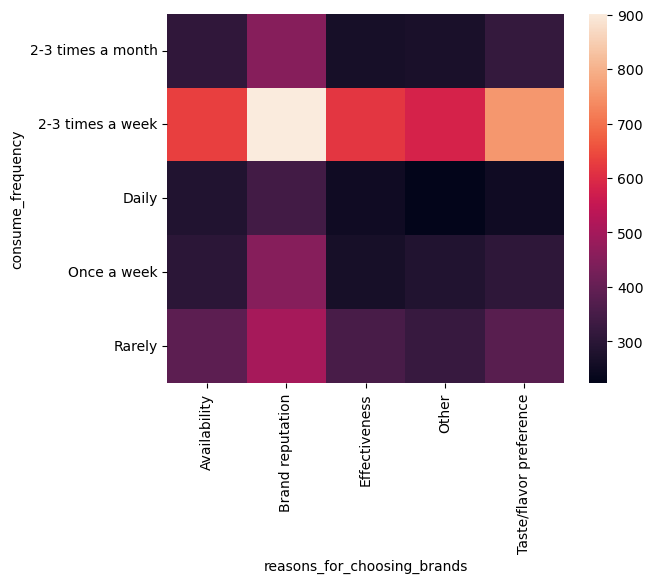

In [79]:
# consume_frequency vs reasons_for_choosing_brands
chi_sq_test('consume_frequency','reasons_for_choosing_brands')
heatmap_creator('consume_frequency','reasons_for_choosing_brands')
# there is weak association.
# but see from heatmap --> we can see that the rare drinkers get affected by the external factor like the brand reputation, availability, taste/flavour.

 Chi-sq Statistic: 2.264311137841096, Pvalue: 0.6872740921047631, Cramers_V: 0.015047628178025586


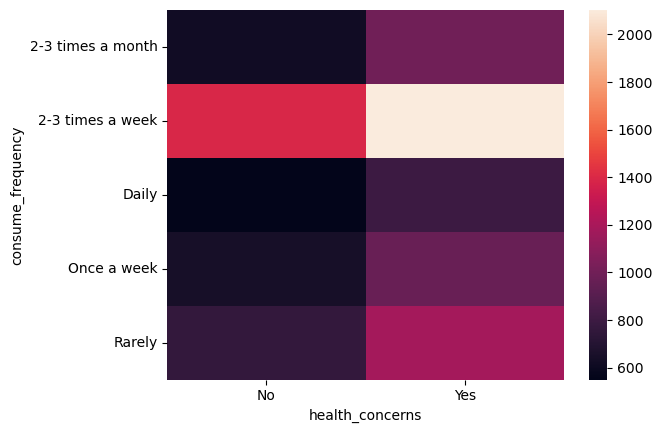

In [80]:
# consume_frequency vs health_concerns
chi_sq_test('consume_frequency','health_concerns')
heatmap_creator('consume_frequency','health_concerns')

In [81]:
# consume_frequency vs improvements_desired
chi_sq_test('consume_frequency','improvements_desired')   # weak association.

 Chi-sq Statistic: 15.41051581144928, Pvalue: 0.49480197820597327, Cramers_V: 0.019628114919325083


(improvements_desired  Healthier alternatives  More natural ingredients  Other  \
 consume_frequency                                                               
 2-3 times a month                        228                       398    165   
 2-3 times a week                         511                       854    336   
 Daily                                    187                       334    151   
 Once a week                              242                       410    158   
 Rarely                                   304                       502    188   
 
 improvements_desired  Reduced sugar content  Wider range of flavors  
 consume_frequency                                                    
 2-3 times a month                       468                     354  
 2-3 times a week                       1062                     728  
 Daily                                   408                     266  
 Once a week                             504                     295 

In [82]:
# consume_frequency vs ingredients_expected

chi_sq_test('consume_frequency','ingredients_expected')

 Chi-sq Statistic: 7.398769846173533, Pvalue: 0.830176160959606, Cramers_V: 0.015704319836883026


(ingredients_expected  Caffeine  Guarana  Sugar  Vitamins
 consume_frequency                                       
 2-3 times a month          639      245    317       412
 2-3 times a week          1354      537    732       868
 Daily                      529      221    258       338
 Once a week                626      232    319       432
 Rarely                     748      318    391       484,
 array([[ 628.4248,  250.4989,  325.3421,  408.7342],
        [1360.0936,  542.1523,  704.1347,  884.6194],
        [ 524.4016,  209.0338,  271.4882,  341.0764],
        [ 626.8664,  249.8777,  324.5353,  407.7206],
        [ 756.2136,  301.4373,  391.4997,  491.8494]]))

In [83]:
# consume_frequency vs interest_in_natural_or_organic

chi_sq_test('consume_frequency','interest_in_natural_or_organic')  

 Chi-sq Statistic: 1.8717673523555232, Pvalue: 0.9846938365168605, Cramers_V: 0.009674108104511555


(interest_in_natural_or_organic    No  Not Sure   Yes
 consume_frequency                                   
 2-3 times a month                485       310   818
 2-3 times a week                1067       685  1739
 Daily                            418       252   676
 Once a week                      497       315   797
 Rarely                           595       393   953,
 array([[ 493.9006,  315.3415,  803.7579],
        [1068.9442,  682.4905, 1739.5653],
        [ 412.1452,  263.143 ,  670.7118],
        [ 492.6758,  314.5595,  801.7647],
        [ 594.3342,  379.4655,  967.2003]]))

 Chi-sq Statistic: 6.0417692798838605, Pvalue: 0.6425529692822294, Cramers_V: 0.017380692276034147


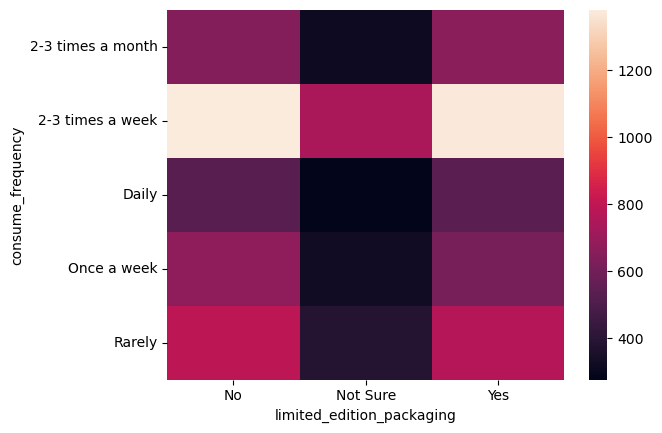

In [84]:
# consume_frequency vs limited_edition_packaging
chi_sq_test('consume_frequency','limited_edition_packaging') 
heatmap_creator('consume_frequency','limited_edition_packaging') 


 Chi-sq Statistic: 9.858614460967653, Pvalue: 0.6283628484117931, Cramers_V: 0.018127892377004424


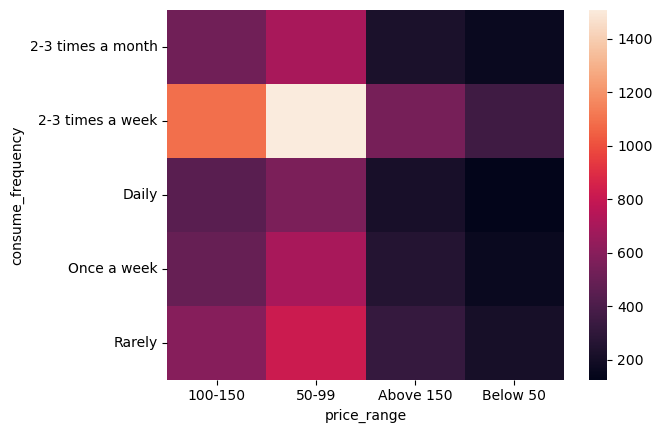

In [85]:
# consume_frequency vs price_range
chi_sq_test('consume_frequency','price_range') 
heatmap_creator('consume_frequency','price_range') 

# 50-99 most popular.

 Chi-sq Statistic: 19.23957504374197, Pvalue: 0.2564355563490304, Cramers_V: 0.02193146999390486


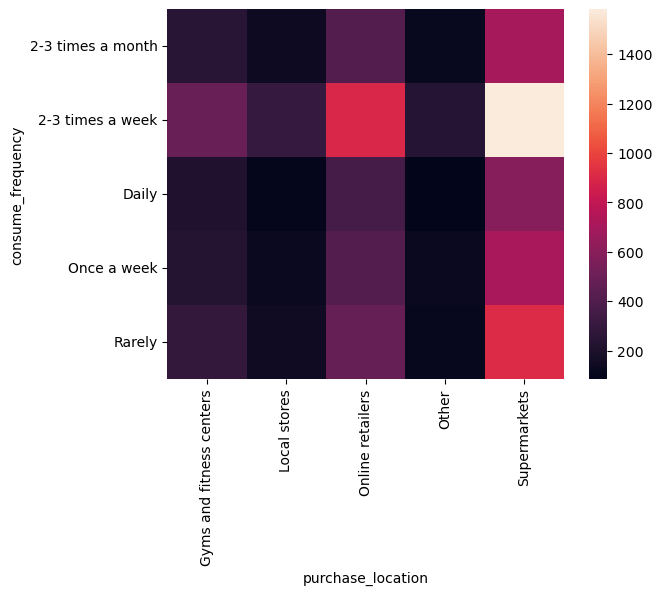

In [86]:
# consume_frequency vs purchase_location
chi_sq_test('consume_frequency','purchase_location') 
heatmap_creator('consume_frequency','purchase_location') # here the cramers_v value is lower.

 Chi-sq Statistic: 12.549945236219555, Pvalue: 0.7053351397833154, Cramers_V: 0.017712950937251785


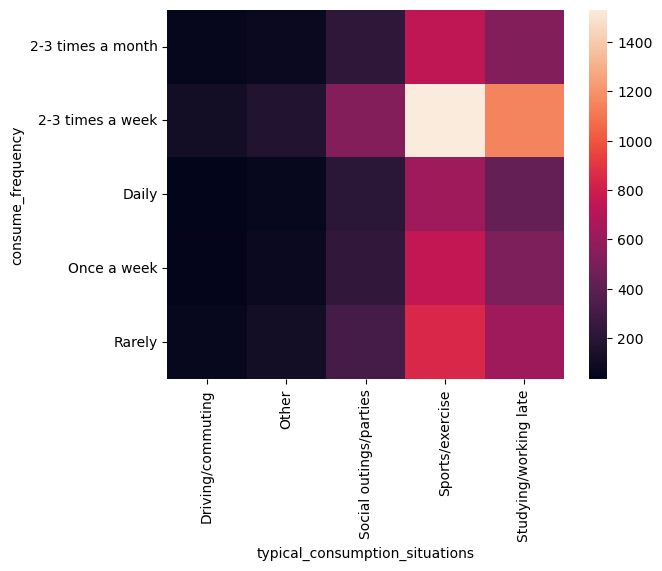

In [87]:
# consume_frequency vs typical_consumption_situations
chi_sq_test('consume_frequency','typical_consumption_situations')
heatmap_creator('consume_frequency','typical_consumption_situations')

In [88]:
# consume_time vs consume_reason

 Chi-sq Statistic: 36.56297375570851, Pvalue: 0.00026291924821809546, Cramers_V: 0.03491082628436271
************



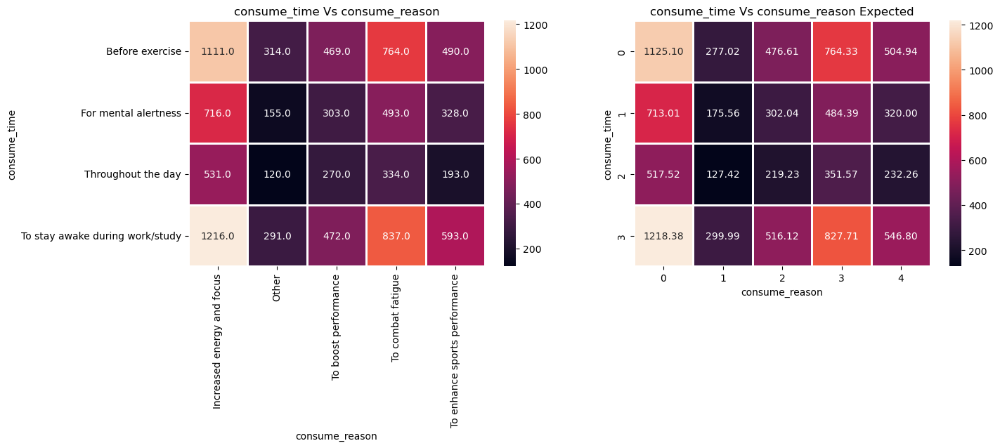

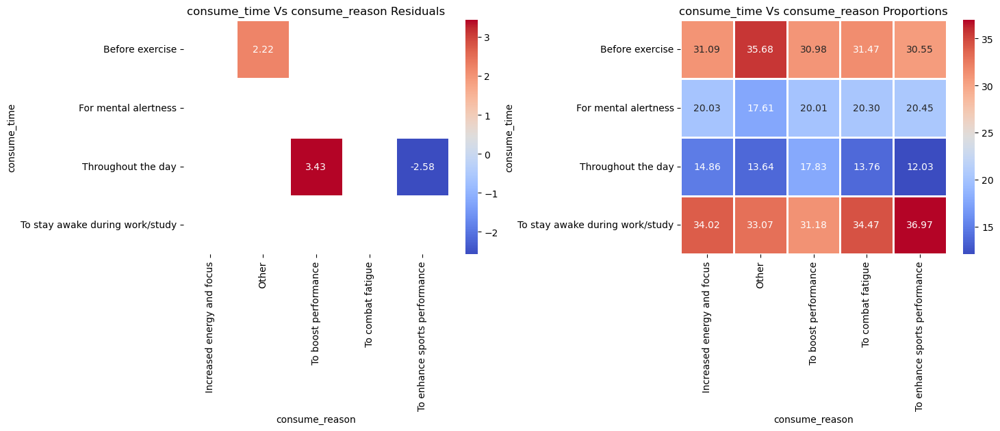

Other selected Before exercise over other groups 15.03 %
To boost performance selected Throughout the day over other groups 31.41 %
To enhance sports performance selected Throughout the day over other groups -19.9 %


In [89]:
heatmap_analysis('consume_time','consume_reason') # pvalue < 0.05 and cramers_v weak association.
# whatever be the consume time main reason is to stay awake during work or study followed by before exercise.

In [90]:
# consume_time vs current_brands
chi_sq_test('consume_time','current_brands') # very low association and pvalue > 0.05.

 Chi-sq Statistic: 12.254262497925996, Pvalue: 0.8338361131045205, Cramers_V: 0.02021077476490036


(current_brands                   Bepsi  Blue Bull  CodeX  Cola-Coka  Gangster  \
 consume_time                                                                    
 Before exercise                    663        326    305        781       584   
 For mental alertness               438        195    184        527       369   
 Throughout the day                 305        148    148        376       272   
 To stay awake during work/study    706        389    343        854       629   
 
 current_brands                   Others  Sky 9  
 consume_time                                    
 Before exercise                     161    328  
 For mental alertness                 93    189  
 Throughout the day                   58    141  
 To stay awake during work/study     167    321  ,
 array([[664.8576, 333.0584, 308.504 , 798.9624, 583.6392, 150.7892,
         308.1892],
        [421.344 , 211.071 , 195.51  , 506.331 , 369.873 ,  95.5605,
         195.3105],
        [305.8176, 153.1984

In [91]:
# consume_time vs improvements_desired
chi_sq_test('consume_time','improvements_desired') 

 Chi-sq Statistic: 9.179158470633885, Pvalue: 0.6875565267798992, Cramers_V: 0.01749205388229551


(improvements_desired             Healthier alternatives  \
 consume_time                                              
 Before exercise                                     502   
 For mental alertness                                287   
 Throughout the day                                  191   
 To stay awake during work/study                     492   
 
 improvements_desired             More natural ingredients  Other  \
 consume_time                                                       
 Before exercise                                       780    308   
 For mental alertness                                  490    193   
 Throughout the day                                    367    141   
 To stay awake during work/study                       861    356   
 
 improvements_desired             Reduced sugar content  Wider range of flavors  
 consume_time                                                                    
 Before exercise                                    929   

 Chi-sq Statistic: 100.05988739921536, Pvalue: 5.419364024842907e-16, Cramers_V: 0.05775231233443251
************



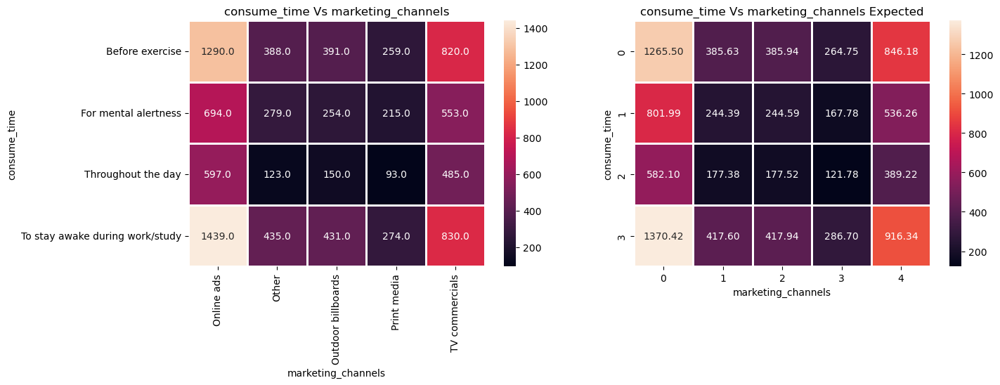

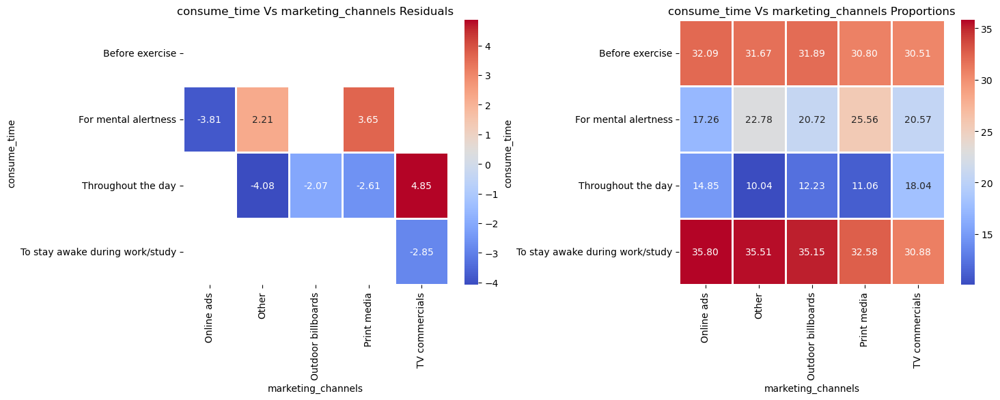

Online ads selected For mental alertness over other groups -22.96 %
Other selected For mental alertness over other groups 8.3 %
Print media selected For mental alertness over other groups 25.73 %
Other selected Throughout the day over other groups -28.52 %
Outdoor billboards selected Throughout the day over other groups -9.36 %
Print media selected Throughout the day over other groups -19.82 %
TV commercials selected Throughout the day over other groups 49.78 %
TV commercials selected To stay awake during work/study over other groups -11.17 %


In [92]:
# consume_time vs marketing_channels
heatmap_analysis('consume_time','marketing_channels') # not much significance.
# but from graph we that - consumers who interact with online ads or tv commercials - they consume to stay awake during work/study mostly, follwed by before exercise.
# so this might indicate that in general brands are using the ads to influence the consumption timing of consumers.(Future Research)

In [93]:
# consume_time vs purchase_location
chi_sq_test('consume_time','purchase_location')

 Chi-sq Statistic: 9.700044808430722, Pvalue: 0.6422568102588415, Cramers_V: 0.017981513477671747


(purchase_location                Gyms and fitness centers  Local stores  \
 consume_time                                                              
 Before exercise                                       474           265   
 For mental alertness                                  282           158   
 Throughout the day                                    211           118   
 To stay awake during work/study                       497           272   
 
 purchase_location                Online retailers  Other  Supermarkets  
 consume_time                                                            
 Before exercise                               832    208          1369  
 For mental alertness                          518    137           900  
 Throughout the day                            348    114           657  
 To stay awake during work/study               852    220          1568  ,
 array([[ 460.8672,  255.9324,  802.74  ,  213.7492, 1414.7112],
        [ 292.068 ,  162.1935,  

In [94]:
# consume_time vs typical_consumption_situations
chi_sq_test('consume_time','typical_consumption_situations')

 Chi-sq Statistic: 13.344474847511593, Pvalue: 0.34450781799520735, Cramers_V: 0.021090657368853783


(typical_consumption_situations   Driving/commuting  Other  \
 consume_time                                                
 Before exercise                                 82    152   
 For mental alertness                            73     95   
 Throughout the day                              35     62   
 To stay awake during work/study                107    182   
 
 typical_consumption_situations   Social outings/parties  Sports/exercise  \
 consume_time                                                               
 Before exercise                                     452             1420   
 For mental alertness                                285              899   
 Throughout the day                                  237              654   
 To stay awake during work/study                     513             1521   
 
 typical_consumption_situations   Studying/working late  
 consume_time                                            
 Before exercise                              

In [95]:
# consume_reason vs current_brands
chi_sq_test('consume_time','typical_consumption_situations')  # pvalue is > 0.05 and cramers v indicates weak associationship.

 Chi-sq Statistic: 13.344474847511593, Pvalue: 0.34450781799520735, Cramers_V: 0.021090657368853783


(typical_consumption_situations   Driving/commuting  Other  \
 consume_time                                                
 Before exercise                                 82    152   
 For mental alertness                            73     95   
 Throughout the day                              35     62   
 To stay awake during work/study                107    182   
 
 typical_consumption_situations   Social outings/parties  Sports/exercise  \
 consume_time                                                               
 Before exercise                                     452             1420   
 For mental alertness                                285              899   
 Throughout the day                                  237              654   
 To stay awake during work/study                     513             1521   
 
 typical_consumption_situations   Studying/working late  
 consume_time                                            
 Before exercise                              

 Chi-sq Statistic: 87.55112156342416, Pvalue: 7.0512901722044495e-12, Cramers_V: 0.04678437815217387
************



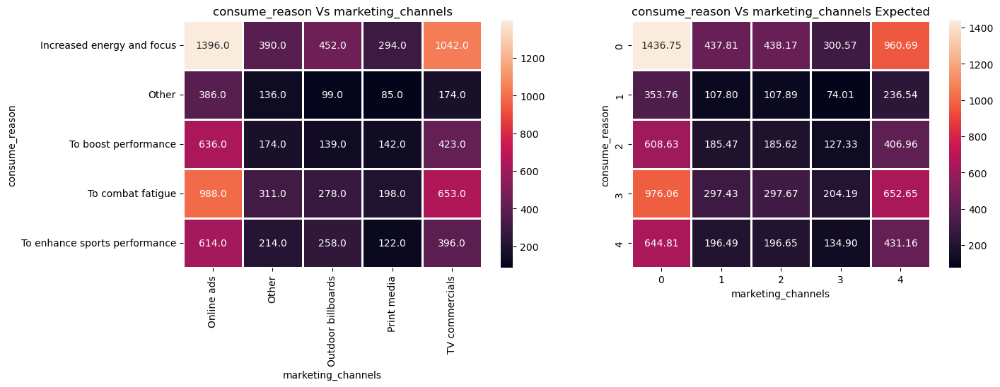

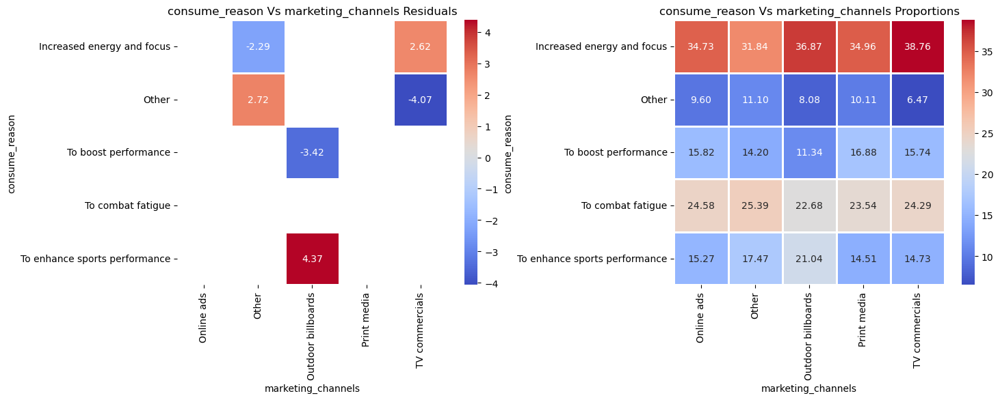

Other selected Increased energy and focus over other groups -12.37 %
TV commercials selected Increased energy and focus over other groups 12.05 %
Other selected Other over other groups 29.63 %
TV commercials selected Other over other groups -33.41 %
Outdoor billboards selected To boost performance over other groups -27.61 %
Outdoor billboards selected To enhance sports performance over other groups 35.81 %


In [96]:
# consume_reasons vs marketing_channels
heatmap_analysis('consume_reason','marketing_channels')
# p value < 0.05 but cramers v suggest weak association.
# currently all the advertisements are focusing on the increased_energy and focus and to combat fatigue.
# and most of the outdoor billboards are specifically targeting to enhance sports performance.

 Chi-sq Statistic: 3169.8421889771057, Pvalue: 0.0, Cramers_V: 0.5630135157327136
************



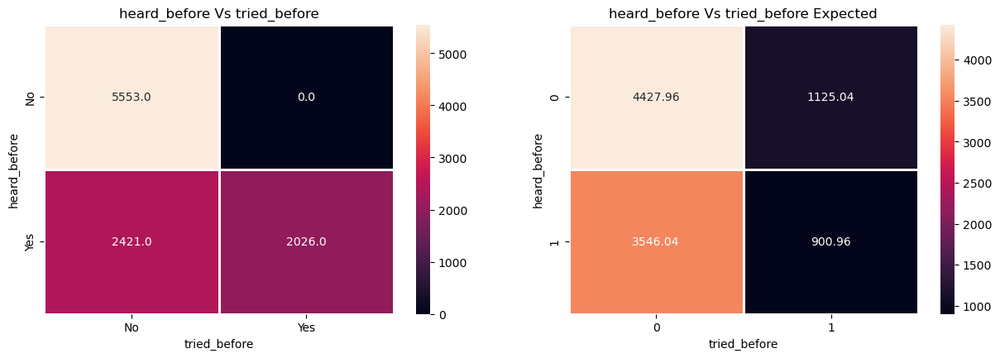

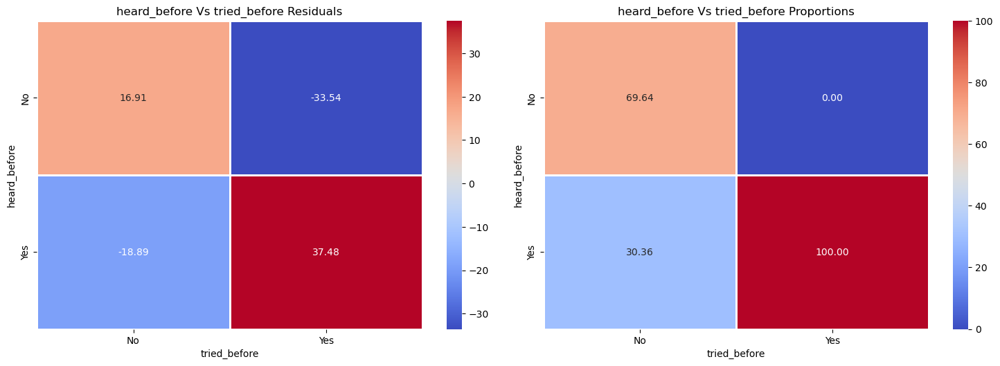

No selected No over other groups inf %
Yes selected No over other groups -100.0 %
No selected Yes over other groups -69.64 %
Yes selected Yes over other groups 229.37 %


C:\conda_temp\ipykernel_27484\3785784665.py:44: RuntimeWarning: divide by zero encountered in scalar divide
  percent_difference = np.round(((observed_value - other_mean) / other_mean) * 100,2)


In [97]:
# heard_before vs tried_before
heatmap_analysis('heard_before','tried_before')  
# pvalue < 0.05 and strong assocation as per cramers_v
# high significance because those who have tried_before our drink have obviously heard of it.

 Chi-sq Statistic: 17.32244944313701, Pvalue: 0.00017317208938341387, Cramers_V: 0.041620246807457795
************



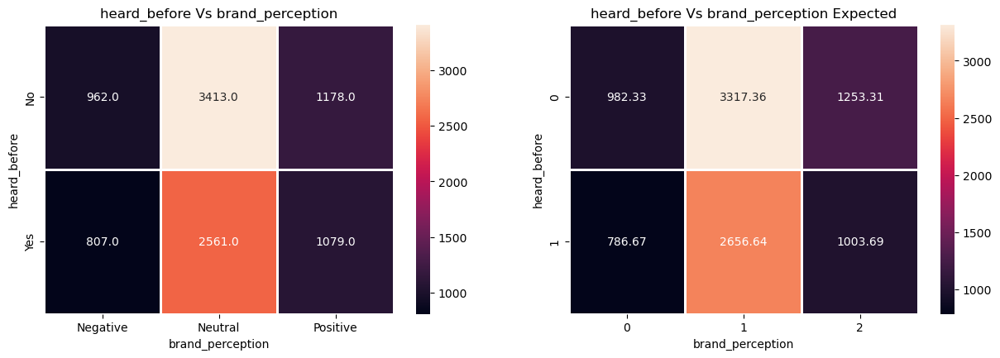

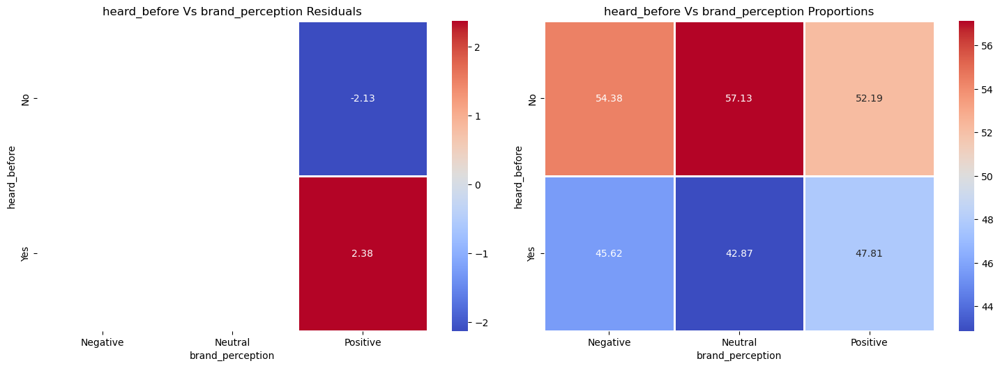

Positive selected No over other groups -6.39 %
Positive selected Yes over other groups 8.05 %


In [98]:
# heard_before and brand_perception
heatmap_analysis('heard_before','brand_perception')
# pvalue < 0.05
# cramers v: weak association.

 Chi-sq Statistic: 17.466749322496625, Pvalue: 0.0015682201037235126, Cramers_V: 0.041793240269805146
************



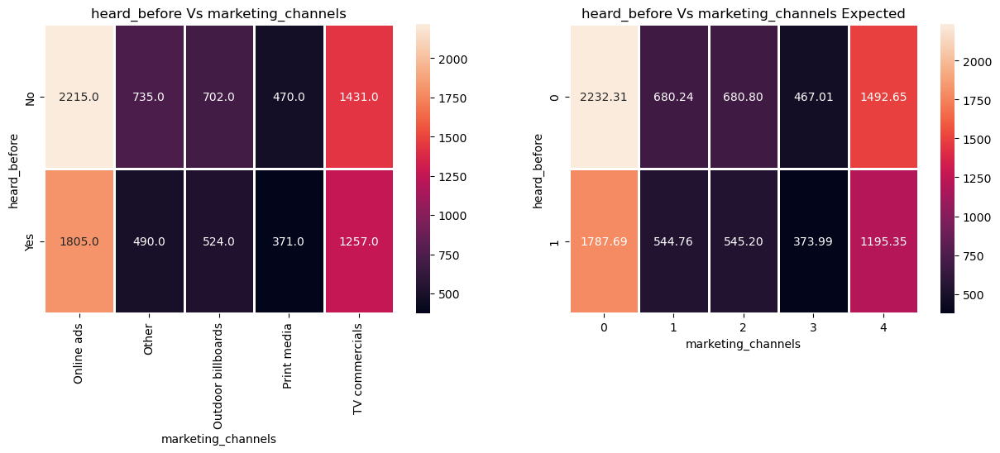

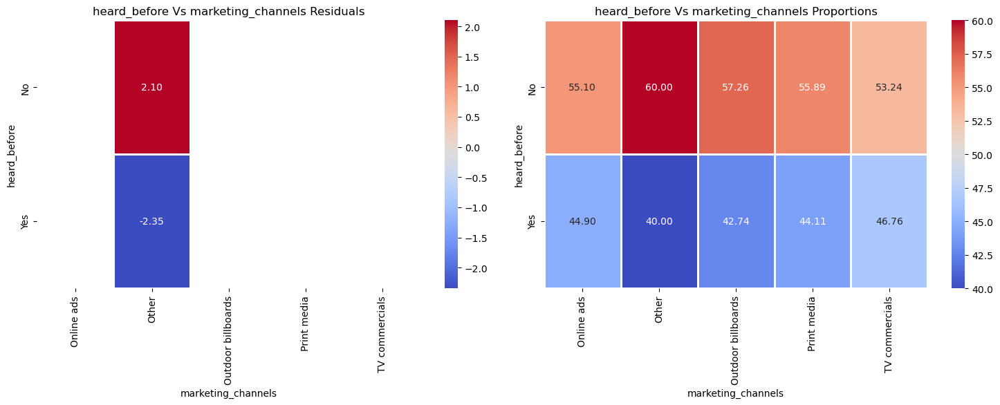

Other selected No over other groups 8.36 %
Other selected Yes over other groups -10.37 %


In [99]:
# heard_before vs marketing_channels
heatmap_analysis('heard_before','marketing_channels')

In [100]:
# brand_perception vs tried_before 
chi_sq_test('brand_perception','tried_before')

 Chi-sq Statistic: 2.213323552320984, Pvalue: 0.330660940959987, Cramers_V: 0.01487724286392134


(tried_before        No   Yes
 brand_perception            
 Negative          1429   340
 Neutral           4736  1238
 Positive          1809   448,
 array([[1410.6006,  358.3994],
        [4763.6676, 1210.3324],
        [1799.7318,  457.2682]]))

 Chi-sq Statistic: 39.756590943487524, Pvalue: 2.3279088264416936e-09, Cramers_V: 0.06305282780612423
************



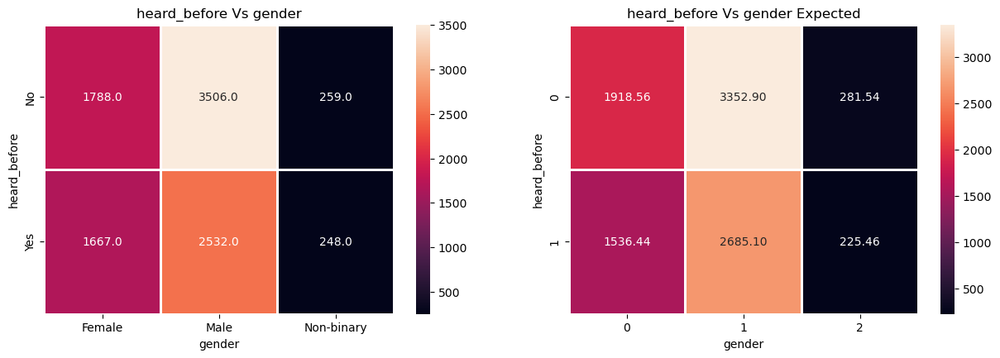

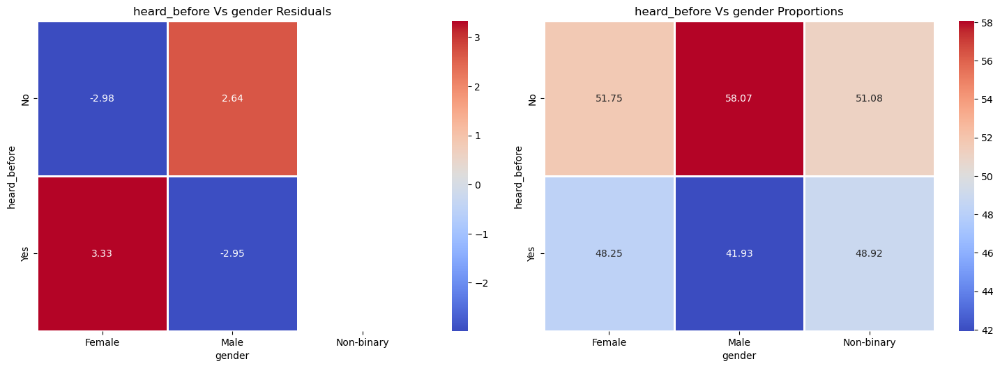

Female selected No over other groups -5.17 %
Male selected No over other groups 12.93 %
Female selected Yes over other groups 6.22 %
Male selected Yes over other groups -13.68 %


In [101]:
# heard_before vs gender
heatmap_analysis('heard_before','gender')
# females in general have heard more about our product -- not statistically backed mights just be noise.

 Chi-sq Statistic: 2.213323552320984, Pvalue: 0.330660940959987, Cramers_V: 0.01487724286392134
************



D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


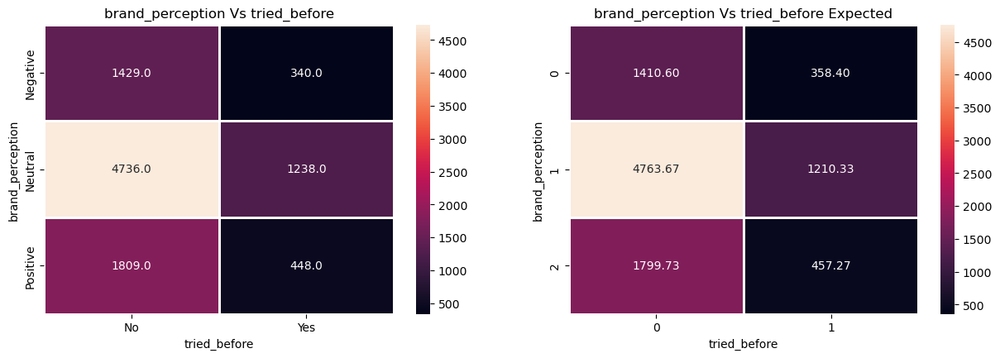

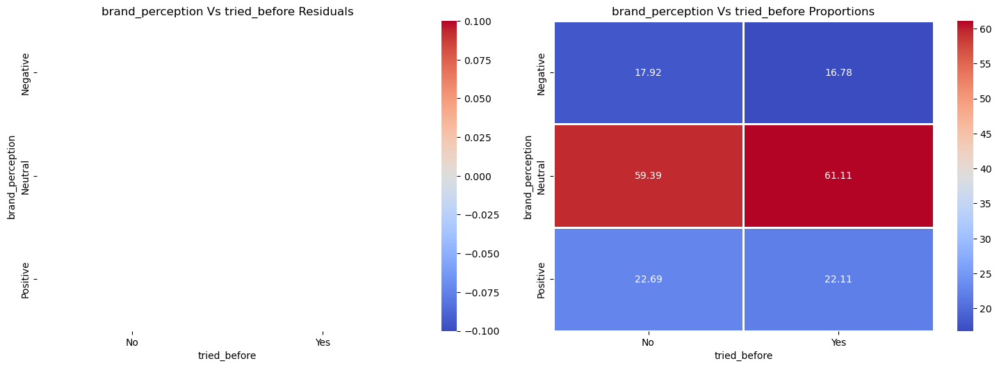

In [102]:
# brand_perception vs tried_before
heatmap_analysis('brand_perception','tried_before')

 Chi-sq Statistic: 14.169903408609523, Pvalue: 0.07744302901415802, Cramers_V: 0.026617572587117635


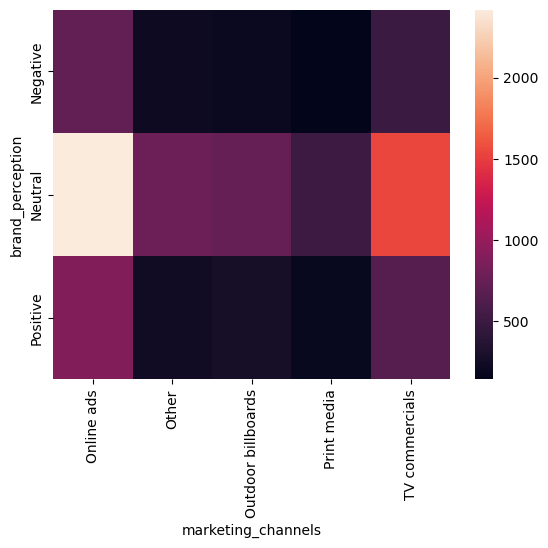

In [103]:
# brand_perception vs marketing_channels
chi_sq_test('brand_perception','marketing_channels')  # weak association and pvalue > 0.05
heatmap_creator('brand_perception','marketing_channels')

 Chi-sq Statistic: 4.224316925466482, Pvalue: 0.8363388003838059, Cramers_V: 0.014533266882340119


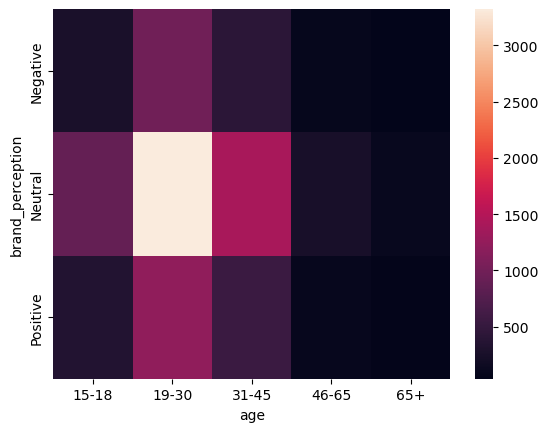

In [104]:
# brand_perception vs age
chi_sq_test('brand_perception','age')  # weak association and pvalue > 0.05
heatmap_creator('brand_perception','age')

 Chi-sq Statistic: 187.4795881409207, Pvalue: 1.9468150747505608e-41, Cramers_V: 0.13692318581632576
************



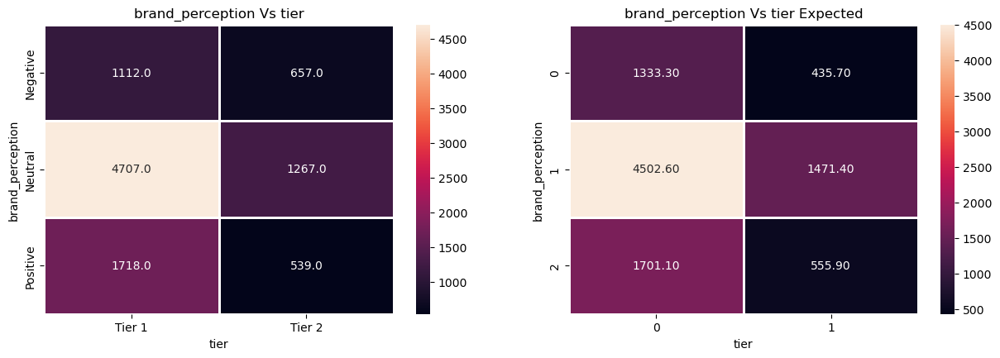

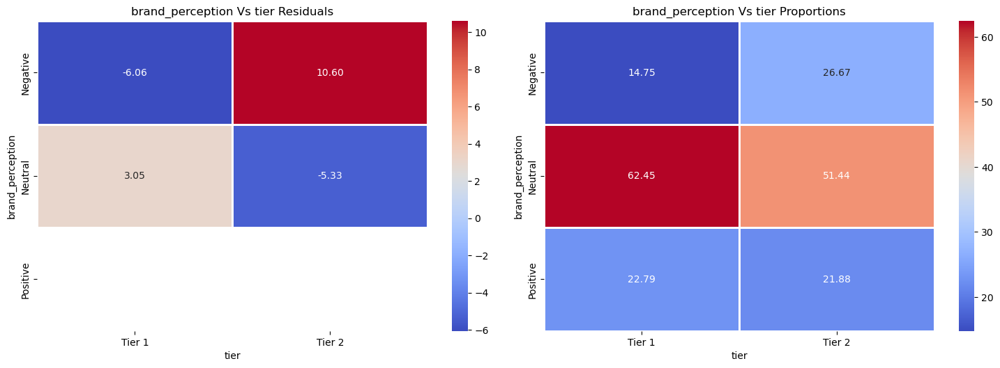

Tier 1 selected Negative over other groups -44.69 %
Tier 2 selected Negative over other groups 80.8 %
Tier 1 selected Neutral over other groups 21.4 %
Tier 2 selected Neutral over other groups -17.63 %


In [105]:
# brand_perception vs tier
heatmap_analysis('brand_perception','tier')
# for tier 1 cities the mostly neutral followed by positive brand perception
# for tier 2 cities mostly neutral follwed by negative brand perception -- as data is like data example -- Pune.

 Chi-sq Statistic: 57.50917596620994, Pvalue: 9.673754249116479e-12, Cramers_V: 0.07583480465209226
************



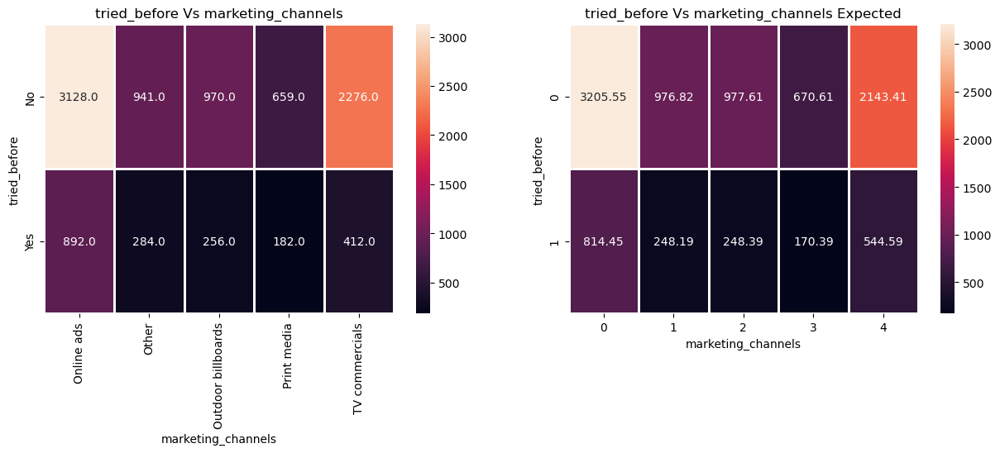

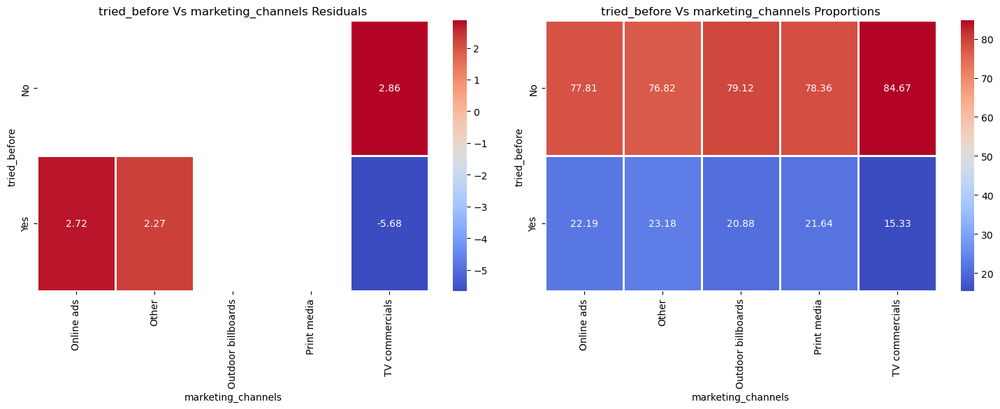

TV commercials selected No over other groups 8.52 %
Online ads selected Yes over other groups 9.53 %
Other selected Yes over other groups 15.86 %
TV commercials selected Yes over other groups -30.25 %


In [106]:
# tried_before vs marketing_channels
heatmap_analysis('tried_before','marketing_channels')

 Chi-sq Statistic: 301.92141494129265, Pvalue: 1.0211649477635705e-59, Cramers_V: 0.10031972470411667
************



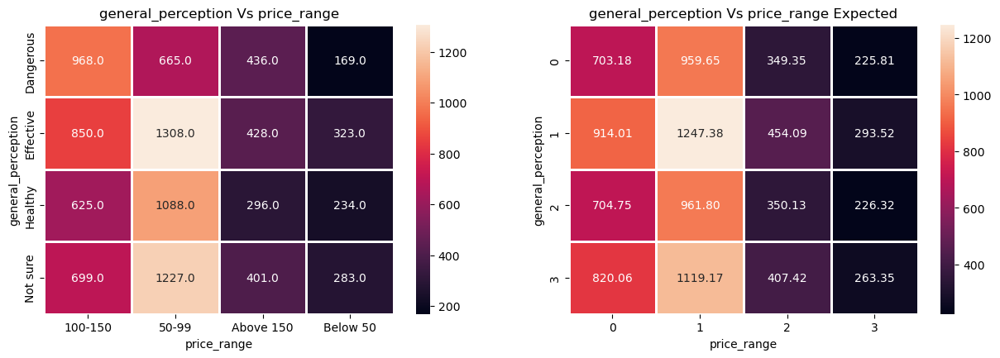

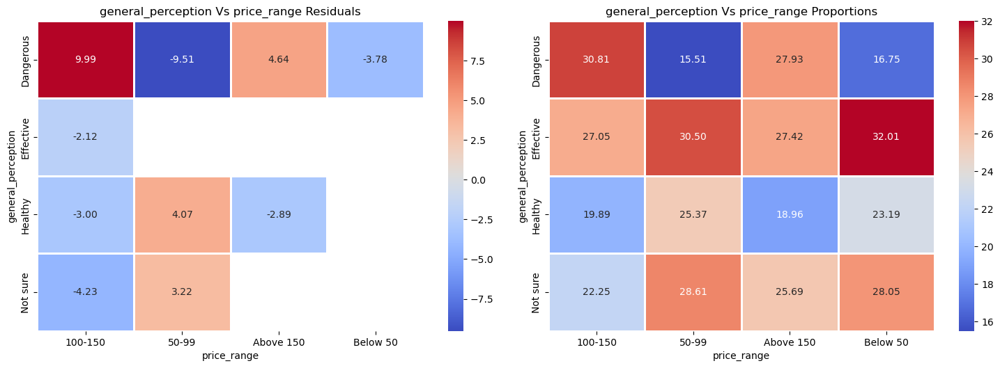

100-150 selected Dangerous over other groups 53.56 %
50-99 selected Dangerous over other groups -38.37 %
Above 150 selected Dangerous over other groups 32.86 %
Below 50 selected Dangerous over other groups -32.32 %
100-150 selected Effective over other groups -9.76 %
100-150 selected Healthy over other groups -11.63 %
50-99 selected Healthy over other groups 22.68 %
Above 150 selected Healthy over other groups -16.9 %
100-150 selected Not sure over other groups -18.96 %
50-99 selected Not sure over other groups 12.98 %


In [107]:
# general_perception vs price_range
heatmap_analysis('general_perception','price_range')

 Chi-sq Statistic: 18.55666352918821, Pvalue: 0.8855867732390149, Cramers_V: 0.02487077503764087


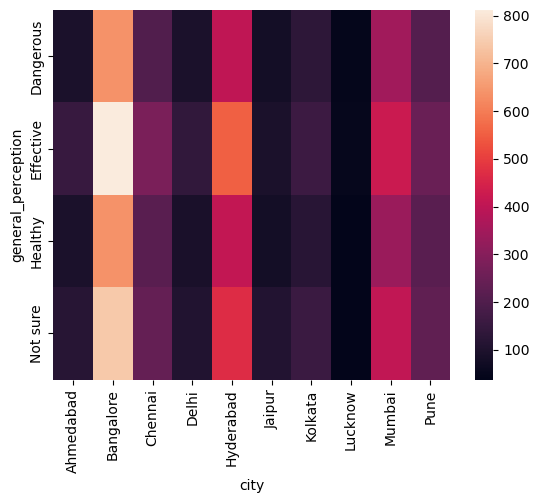

In [108]:
# general_perception vs city
chi_sq_test('general_perception','city')
heatmap_creator('general_perception','city')

 Chi-sq Statistic: 0.427742216799983, Pvalue: 0.9344538202620242, Cramers_V: 0.0065402004311793304


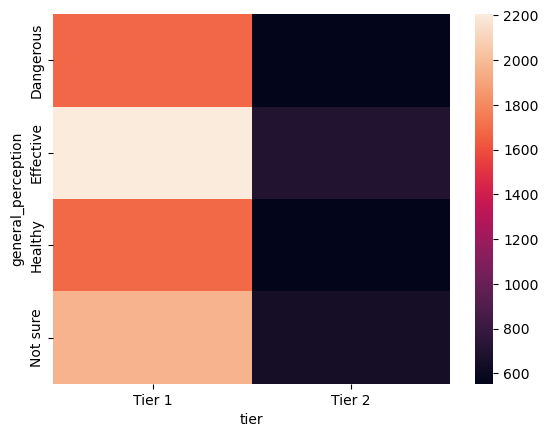

In [109]:
# general_perception vs tier
chi_sq_test('general_perception','tier')
heatmap_creator('general_perception','tier')

In [110]:
# tried_before vs interest_in_natural_or_organic -- not significant
# tried_before vs packaging_preference  -- not significant
# tried_before vs limited_edition_packaging  -- not significant
# tried_before vs typical_consumption_situations -- not significant.
# tried_before vs tier -- significant

 Chi-sq Statistic: 122.28584606819642, Pvalue: 1.9986477111780256e-28, Cramers_V: 0.11058293090174288
************



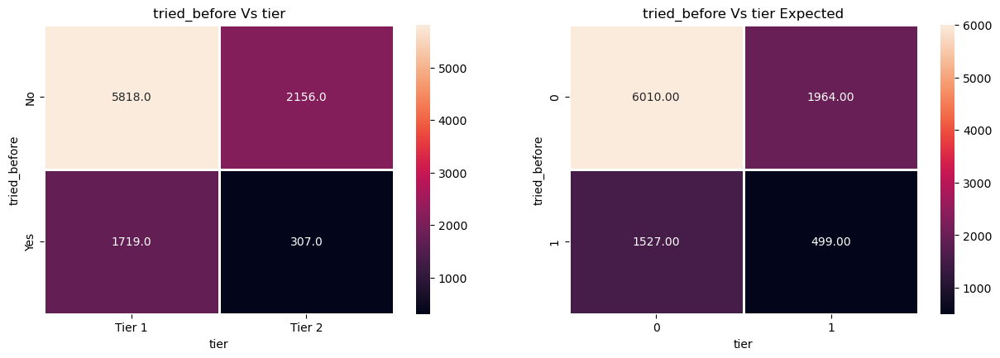

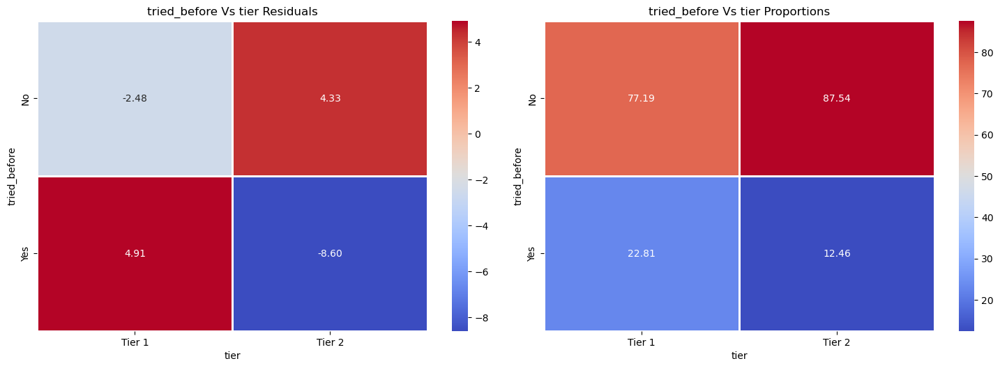

Tier 1 selected No over other groups -11.82 %
Tier 2 selected No over other groups 13.4 %
Tier 1 selected Yes over other groups 82.98 %
Tier 2 selected Yes over other groups -45.35 %


In [111]:
# tried_before vs tier
heatmap_analysis('tried_before','tier')
# our product has been tried more in tier 1 cities.
# thought there is weak association between variables.

 Chi-sq Statistic: 1.4421940943192366, Pvalue: 0.4862185585792568, Cramers_V: 0.012009138579928356


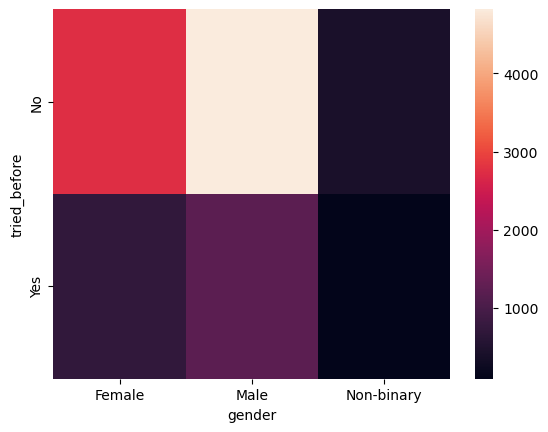

In [112]:
# tried_before vs gender: -- done earlier.
# tried_before vs age

chi_sq_test('tried_before','gender')
heatmap_creator('tried_before','gender')  # not significant difference.

 Chi-sq Statistic: 27.684638004887447, Pvalue: 0.27356577544259103, Cramers_V: 0.02630809666475677
************



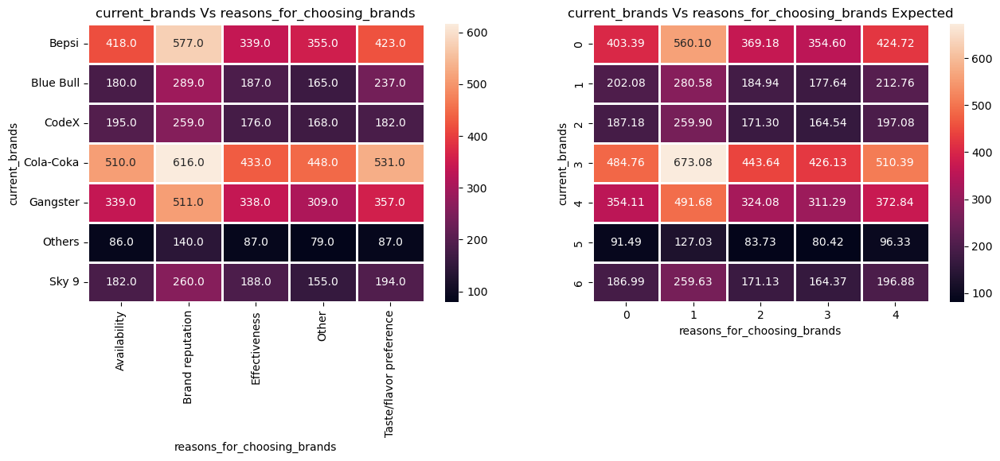

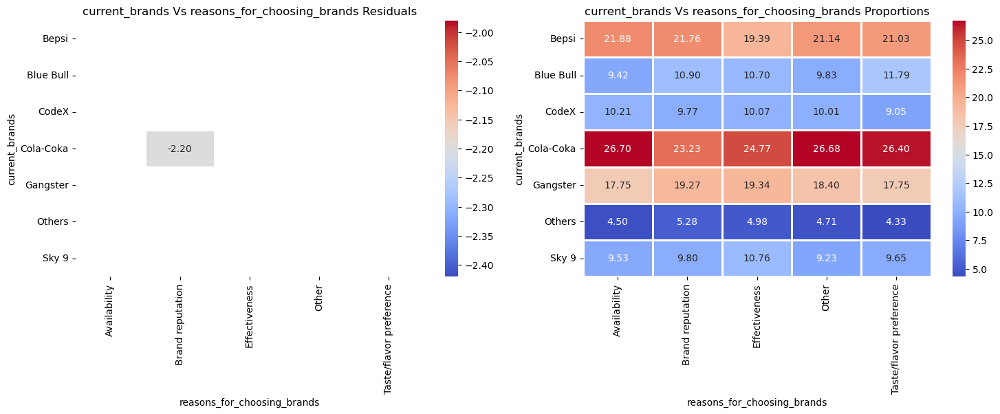

Brand reputation selected Cola-Coka over other groups -11.14 %


In [113]:
# current_brands vs reasons_for_choosing_brands

heatmap_analysis('current_brands','reasons_for_choosing_brands')

# even though pvalue > 0.05 but for the popular brand cola-coka,bepsi,gangster
# get picked over other brands because of first - solid brand reputation, followed by taste/flavor preference and then availability.

 Chi-sq Statistic: 14.966240370258152, Pvalue: 0.9217426196473754, Cramers_V: 0.0193431127085703
************



D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
D:\Placements\Analytics\Python\Anaconda_Everything\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


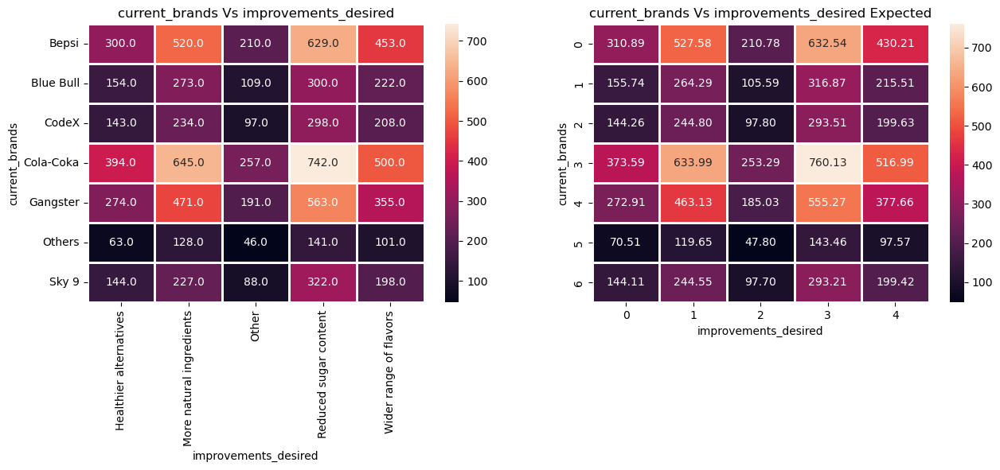

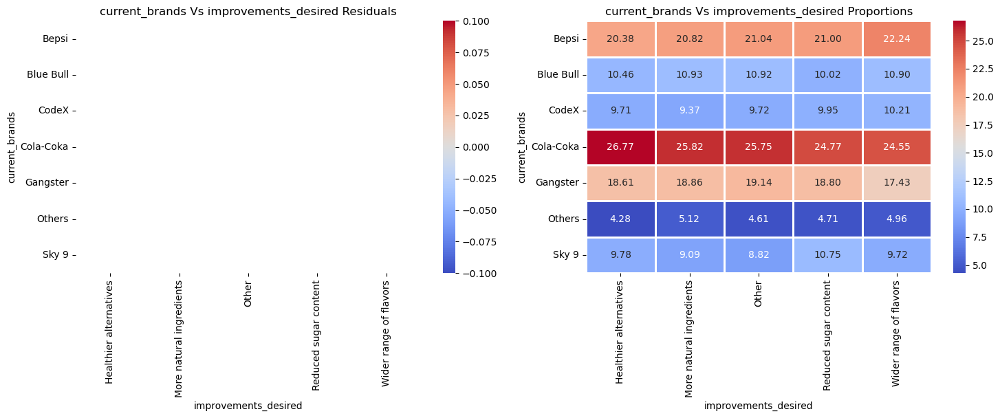

In [114]:
# current_brands vs improvements_desired
heatmap_analysis('current_brands','improvements_desired')

# not much insight from here 
# but there seems to be demand for the healthier alternatives.

 Chi-sq Statistic: 23.552121997809326, Pvalue: 0.4874325087844714, Cramers_V: 0.02426526426695644
************



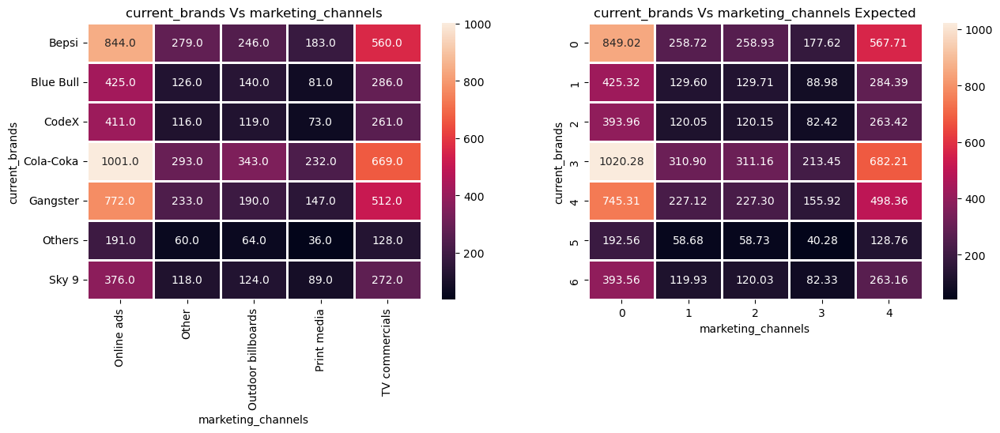

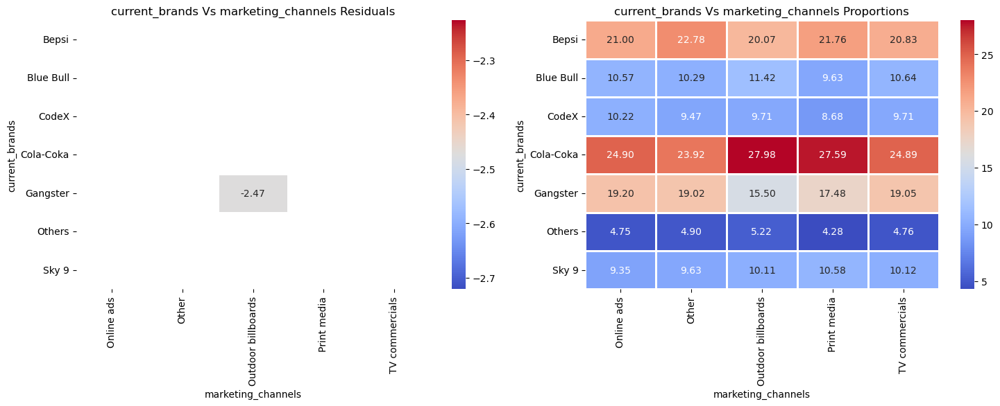

Outdoor billboards selected Gangster over other groups -17.07 %


In [115]:
# current_brands vs marketing_channels

heatmap_analysis('current_brands','marketing_channels')

In [116]:
# current_brands vs price_range pvalue > 0.05
# current_brands vs typical_consumption_situations > 0.05

 Chi-sq Statistic: 67.9643871971133, Pvalue: 4.427683638168028e-06, Cramers_V: 0.041220258125439155
************



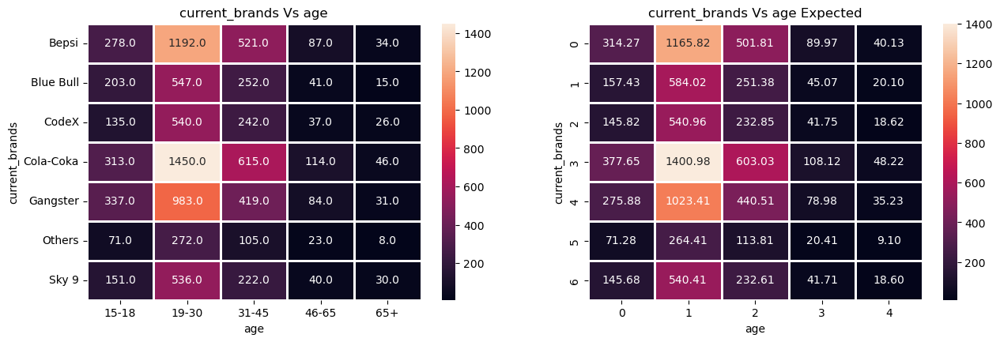

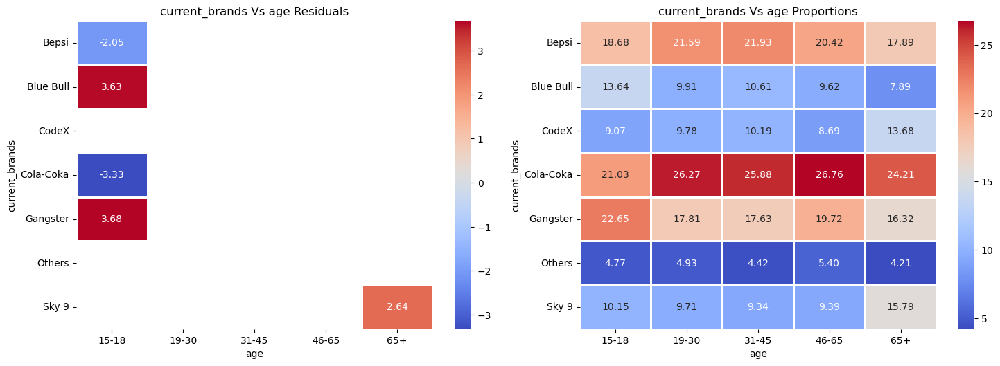

15-18 selected Bepsi over other groups -8.69 %
15-18 selected Blue Bull over other groups 43.47 %
15-18 selected Cola-Coka over other groups -18.41 %
15-18 selected Gangster over other groups 26.74 %
65+ selected Sky 9 over other groups 63.66 %


In [117]:
# current_brands vs age
heatmap_analysis('current_brands','age')

In [118]:
# proportional analysis important here.

In [119]:
# current_brands vs tier  -- done earlier.
# current_brands vs city  -- done earlier.
# current_brands vs gender -- done earlier.

In [120]:
# ingredients_expected vs price_range
# ingredients_expected vs city - no effect
# ingredients_expected vs tier - no effect
# ingredients_expected vs gender
# health_concerns vs age -- no effect.
# health_concerns vs gender -- both are concerned.
# health_concerns vs city -- no effect
# health_concerns vs tier.
# interest_in_natural_or_organic vs price_range
# interest_in_natural_or_organic vs age -- done
# interest_in_natural_or_organic vs gender -- done
# packaging_preference vs city,age,gender,tier -- no effect

 Chi-sq Statistic: 18.92764142853403, Pvalue: 0.27243333327087316, Cramers_V: 0.021752954643297327


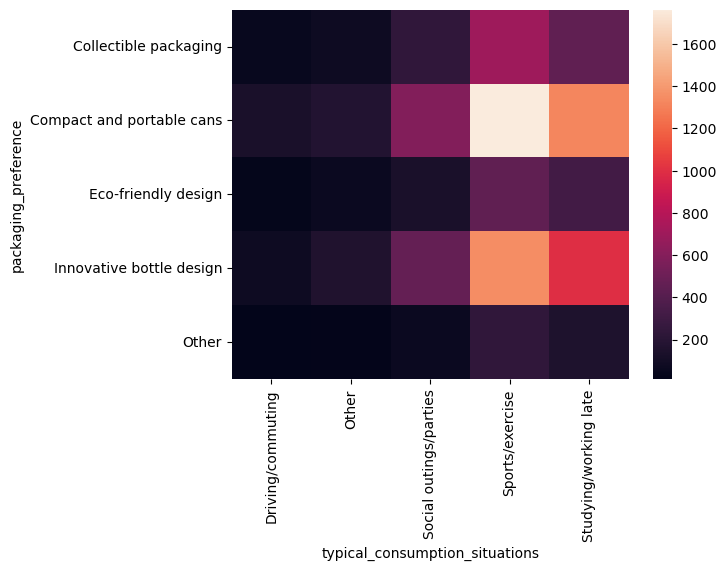

In [121]:
# packaging_preference vs typical_consumption_situations
chi_sq_test('packaging_preference','typical_consumption_situations')
heatmap_creator('packaging_preference','typical_consumption_situations')
# thought not statiscally backed but mostly compact and portable cans or innovative bottle designs are preferred.

 Chi-sq Statistic: 31.289057637650412, Pvalue: 0.026647366099528186, Cramers_V: 0.03955316525744205
************



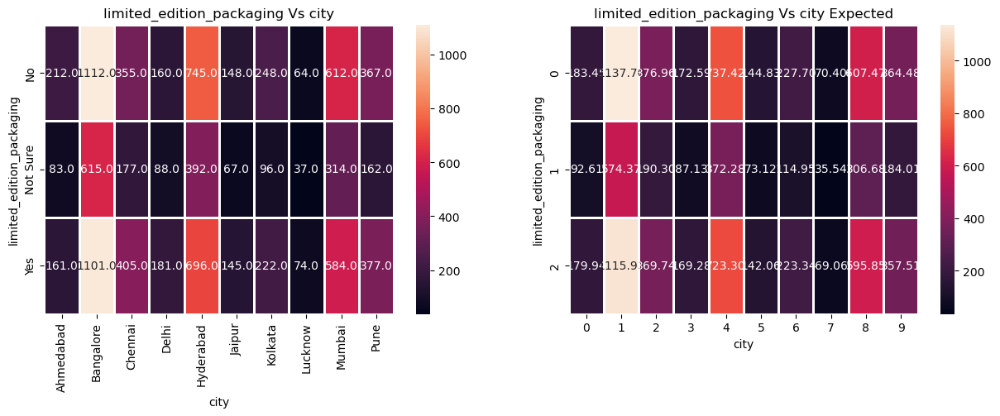

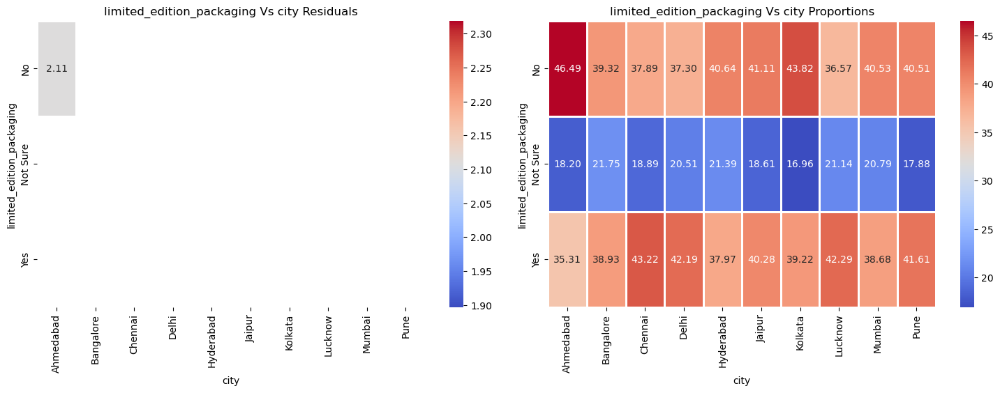

Ahmedabad selected No over other groups 16.98 %


In [122]:
# limited_edition_packaging vs city
heatmap_analysis('limited_edition_packaging','city')
# the pvalue < 0.05 but here the cramers_v value is 0.039 i.e very low association

 Chi-sq Statistic: 11.263401687251138, Pvalue: 0.003582476909559238, Cramers_V: 0.03356099177207244
************



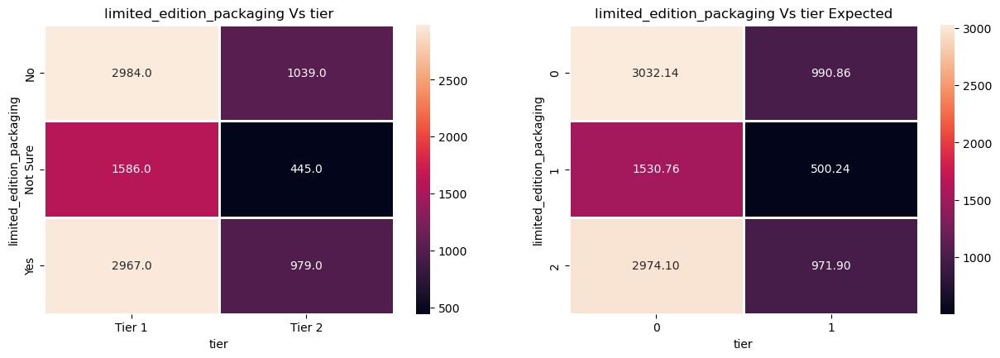

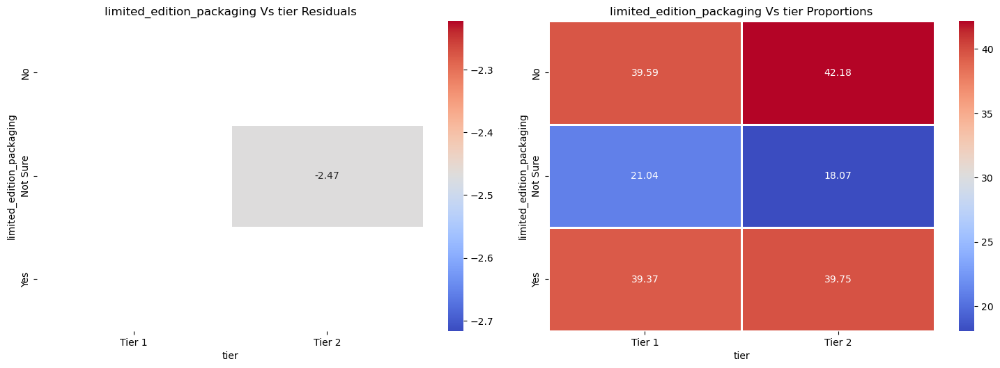

Tier 2 selected Not Sure over other groups -14.14 %


In [123]:
# limited_edition_packaging vs tier
heatmap_analysis('limited_edition_packaging','tier')  # almost equal pref.

 Chi-sq Statistic: 242.02200353376315, Pvalue: 6.290713475884667e-45, Cramers_V: 0.08981870694789647


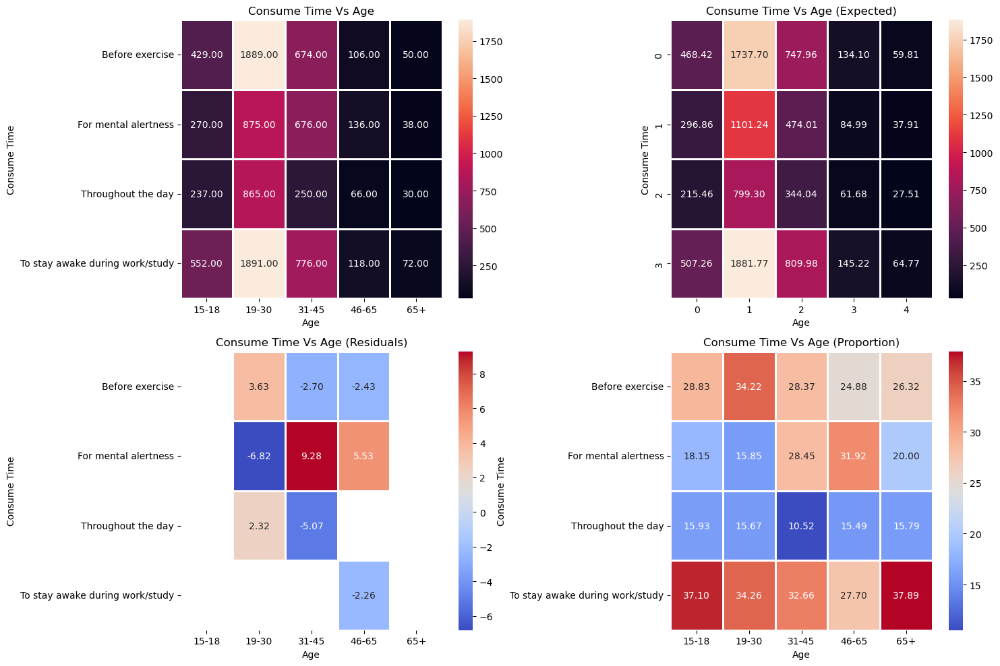

In [124]:
contingency = pd.crosstab(index = df['consume_time'], columns = df['age'])
chi2_statistic, p_value, dof, expected = chi2_contingency(contingency)
sample_size = contingency.values.sum()  # frequency count ka sum.
r,k = contingency.shape
cramers_v = np.sqrt((chi2_statistic)/((sample_size) * np.min((r-1,k-1))))
print(f' Chi-sq Statistic: {chi2_statistic}, Pvalue: {p_value}, Cramers_V: {cramers_v}')

fig = plt.figure(figsize = (15,10))
ax1 = fig.add_subplot(2,2,1)
sns.heatmap(contingency,linewidth = 1, annot = True,ax = ax1, fmt = '.2f')
ax1.set_title('Consume Time Vs Age')
ax1.set_xlabel('Age')
ax1.set_ylabel('Consume Time')

ax2 = fig.add_subplot(2,2,2)
sns.heatmap(expected,linewidth = 1, annot = True,ax = ax2, fmt = '.2f')
ax2.set_title('Consume Time Vs Age (Expected)')
ax2.set_xlabel('Age')
ax2.set_ylabel('Consume Time')

residuals = (contingency - expected)/np.sqrt(expected)
mask = (residuals.abs() < 2)
ax3 = fig.add_subplot(2,2,3)
sns.heatmap(residuals,linewidth = 1, annot = True,ax = ax3, fmt = '.2f', cmap = 'coolwarm',mask = mask)
ax3.set_title('Consume Time Vs Age (Residuals)')
ax3.set_xlabel('Age')
ax3.set_ylabel('Consume Time')


ax4 = fig.add_subplot(2,2,4)
prop_within_age = contingency.div(contingency.sum(axis=0), axis=1) * 100
sns.heatmap(prop_within_age,linewidth = 1, annot = True,ax = ax4, fmt = '.2f', cmap = 'coolwarm')
ax4.set_title('Consume Time Vs Age (Proportion)')
ax4.set_xlabel('Age')
ax4.set_ylabel('Consume Time')

plt.tight_layout()
plt.show()

In [125]:
prop_within_age

age,15-18,19-30,31-45,46-65,65+
consume_time,,,,,
Before exercise,28.830645,34.221014,28.367003,24.882629,26.315789
For mental alertness,18.145161,15.851449,28.451178,31.924883,20.000000
Throughout the day,15.927419,15.670290,10.521886,15.492958,15.789474
To stay awake during work/study,37.096774,34.257246,32.659933,27.699531,37.894737


In [126]:
prop_within_age = contingency.div(contingency.sum(axis=0), axis=1) * 100

In [127]:
significant_cells = np.where(residuals.abs() > 2)

for i, j in zip(*significant_cells):  # this zip will join the output and get me the exact index location.
    consume_time = prop_within_age.index[i]
    age_group = prop_within_age.columns[j]
    observed_prop = prop_within_age.iloc[i, j]
    
    # Compare with other age groups for the same consume_time
    other_props = prop_within_age.loc[consume_time].drop(age_group)
    other_mean = other_props.mean()

    percent_difference = ((observed_prop - other_mean) / other_mean) * 100
    
    print(f"For '{consume_time}', age group '{age_group}' selected this category {percent_difference:.2f}% {'more' if percent_difference > 0 else 'less'} often than other age groups (proportionally).")

For 'Before exercise', age group '19-30' selected this category 26.28% more often than other age groups (proportionally).
For 'Before exercise', age group '31-45' selected this category -0.68% less often than other age groups (proportionally).
For 'Before exercise', age group '46-65' selected this category -15.46% less often than other age groups (proportionally).
For 'For mental alertness', age group '19-30' selected this category -35.64% less often than other age groups (proportionally).
For 'For mental alertness', age group '31-45' selected this category 32.45% more often than other age groups (proportionally).
For 'For mental alertness', age group '46-65' selected this category 54.89% more often than other age groups (proportionally).
For 'Throughout the day', age group '19-30' selected this category 8.57% more often than other age groups (proportionally).
For 'Throughout the day', age group '31-45' selected this category -33.07% less often than other age groups (proportionally).
F

 Chi-sq Statistic: 79.3740636928914, Pvalue: 5.432388736694322e-12, Cramers_V: 0.05143736115992324
************



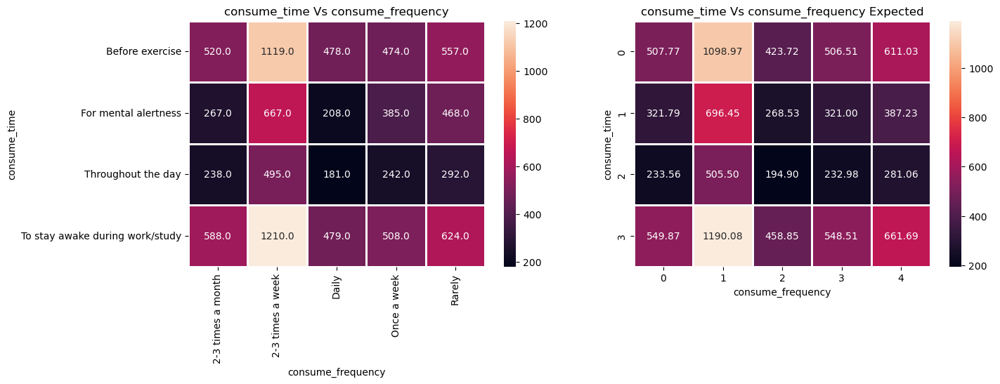

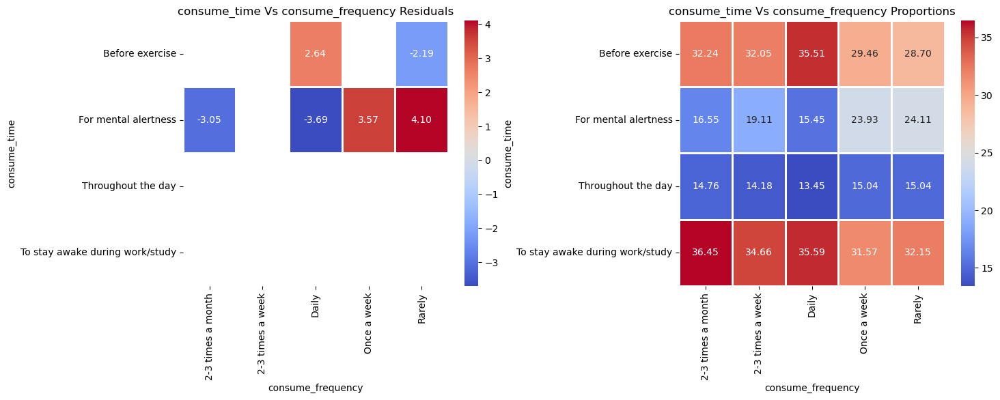

Daily selected Before exercise over other groups 16.01 %
Rarely selected Before exercise over other groups -11.2 %
2-3 times a month selected For mental alertness over other groups -19.84 %
Daily selected For mental alertness over other groups -26.15 %
Once a week selected For mental alertness over other groups 27.24 %
Rarely selected For mental alertness over other groups 28.52 %


In [128]:
# consume_time vs consume_frequency
heatmap_analysis('consume_time','consume_frequency')
# any drinker mostly drinks to stay awake during work/study or before exercise.
# Daily drinker - moslty before exercise.

 Chi-sq Statistic: 26.746079994150083, Pvalue: 0.04439315396610812, Cramers_V: 0.025858306206202913
************



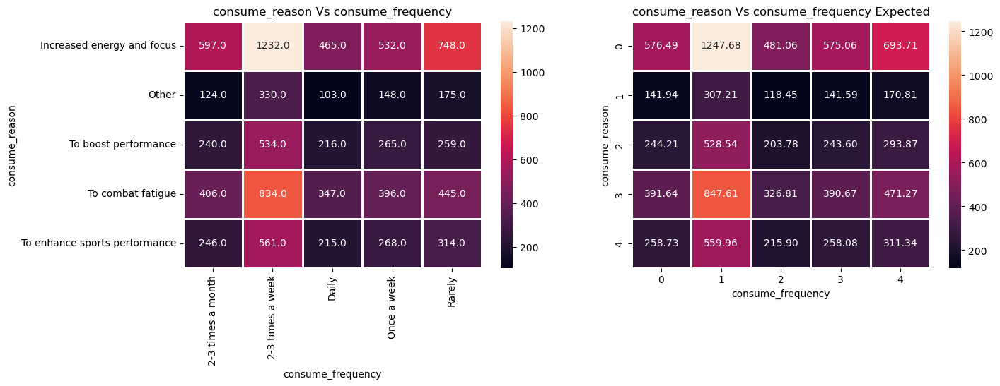

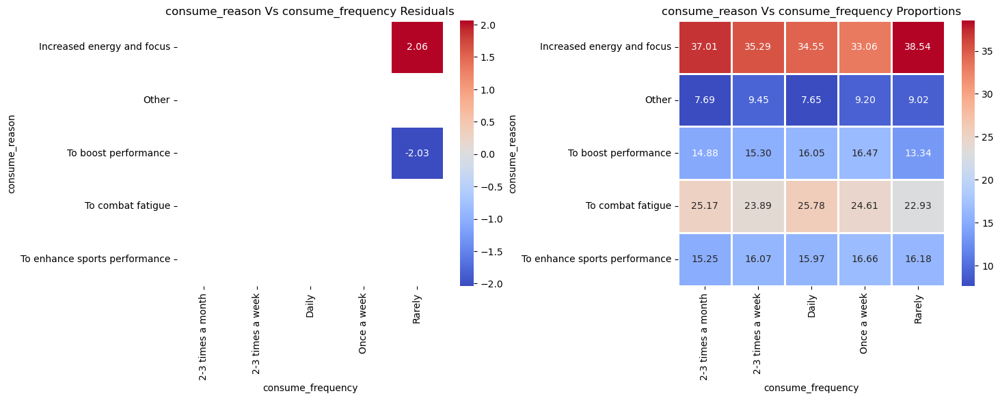

Rarely selected Increased energy and focus over other groups 10.17 %
Rarely selected To boost performance over other groups -14.86 %


In [129]:
# consume_reason vs consume_frequency
heatmap_analysis('consume_reason','consume_frequency')
# not much significant difference mostly consumed to increase energy and focus and to combat fatigue

In [130]:
# heard_before vs consume_frequency
chi_sq_test('heard_before','consume_frequency')

 Chi-sq Statistic: 8.133005268428308, Pvalue: 0.08682576492916555, Cramers_V: 0.028518424340114423


(consume_frequency  2-3 times a month  2-3 times a week  Daily  Once a week  \
 heard_before                                                                 
 No                               874              1902    740          915   
 Yes                              739              1589    606          694   
 
 consume_frequency  Rarely  
 heard_before               
 No                   1122  
 Yes                   819  ,
 array([[ 895.6989, 1938.5523,  747.4338,  893.4777, 1077.8373],
        [ 717.3011, 1552.4477,  598.5662,  715.5223,  863.1627]]))

 Chi-sq Statistic: 10.325989149131875, Pvalue: 0.24288704034289935, Cramers_V: 0.02272222386687962
************



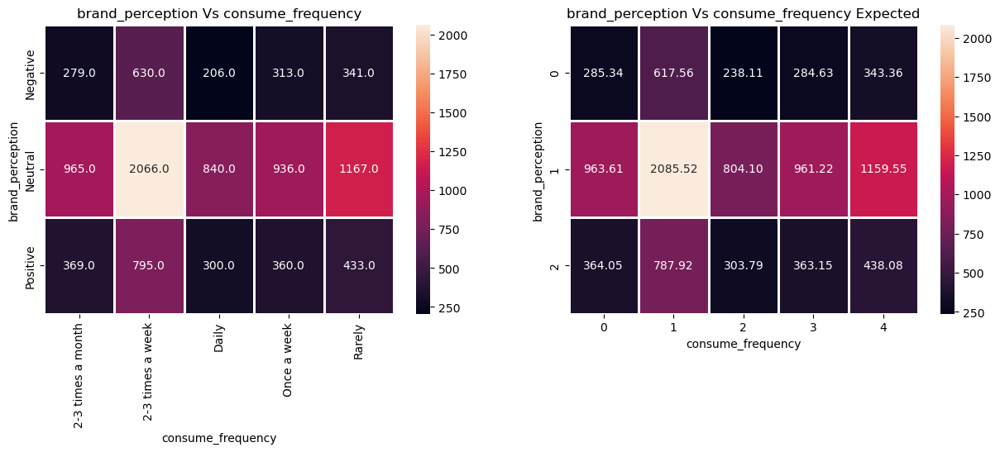

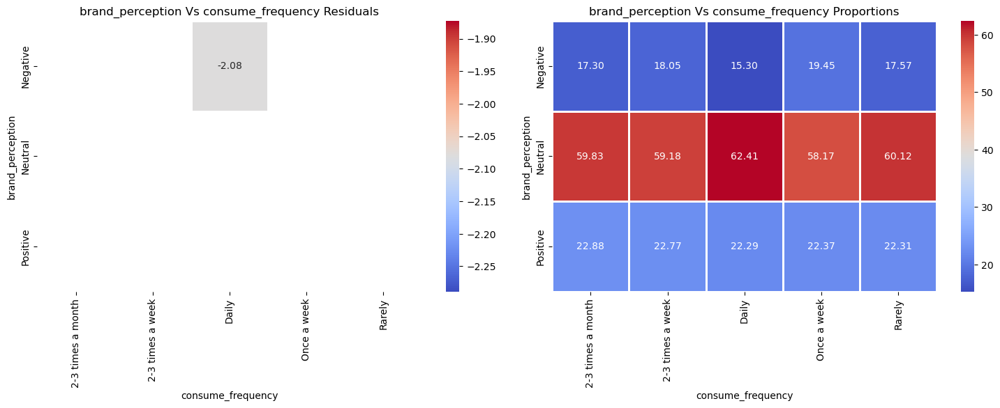

Daily selected Negative over other groups -15.4 %


In [131]:
# brand_perception vs consume_frequency
heatmap_analysis('brand_perception','consume_frequency')

 Chi-sq Statistic: 18.411876374043626, Pvalue: 0.10374482909963513, Cramers_V: 0.024773558736445614


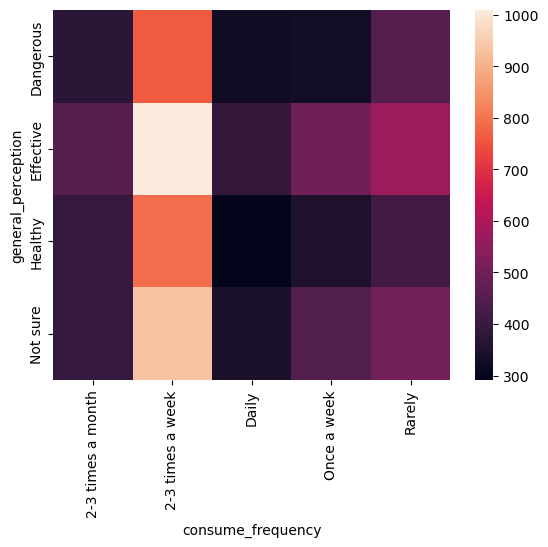

In [132]:
# general_perception vs consume_frquency
chi_sq_test('general_perception','consume_frequency')
heatmap_creator('general_perception','consume_frequency')

 Chi-sq Statistic: 12.716516863548026, Pvalue: 0.012747308175580728, Cramers_V: 0.03566022555109267
************



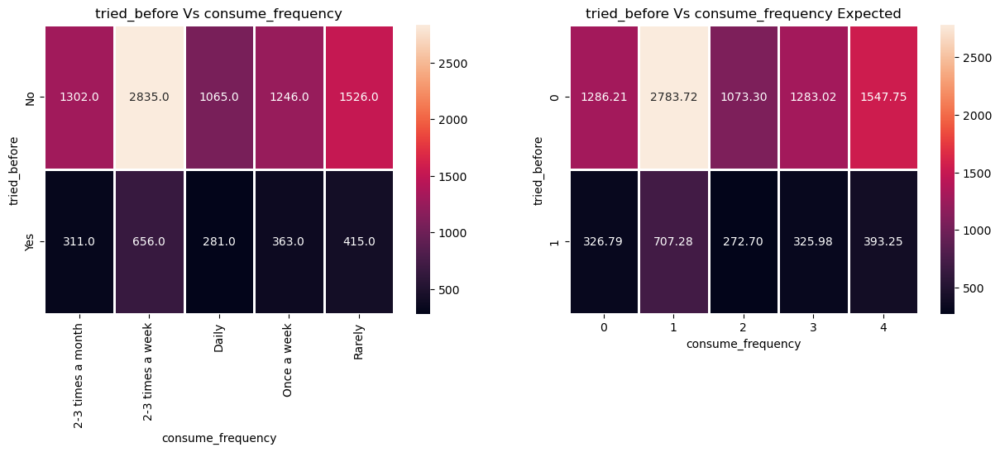

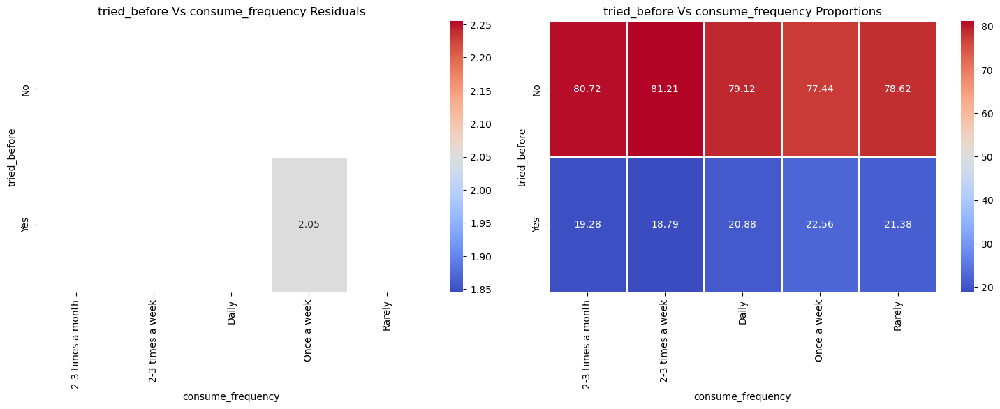

Once a week selected Yes over other groups 12.34 %


In [133]:
# tried_before vs consume_frequency
heatmap_analysis('tried_before','consume_frequency')  # weak association.

In [134]:
# taste_experience vs consume_frequency
chi_sq_test('taste_experience','consume_frequency') 

 Chi-sq Statistic: 8.169396575802084, Pvalue: 0.9436625338254545, Cramers_V: 0.014291078139701431


(consume_frequency  2-3 times a month  2-3 times a week  Daily  Once a week  \
 taste_experience                                                             
 1                                168               359    140          191   
 2                                234               540    220          240   
 3                                483              1034    385          483   
 4                                404               867    337          393   
 5                                324               691    264          302   
 
 consume_frequency  Rarely  
 taste_experience           
 1                     196  
 2                     290  
 3                     572  
 4                     478  
 5                     405  ,
 array([[ 170.0102,  367.9514,  141.8684,  169.5886,  204.5814],
        [ 245.8212,  532.0284,  205.1304,  245.2116,  295.8084],
        [ 476.9641, 1032.2887,  398.0122,  475.7813,  573.9537],
        [ 399.8627,  865.4189,  333.6734,  398

 Chi-sq Statistic: 34.4123545956815, Pvalue: 0.023466896684145463, Cramers_V: 0.029331022227192107
************



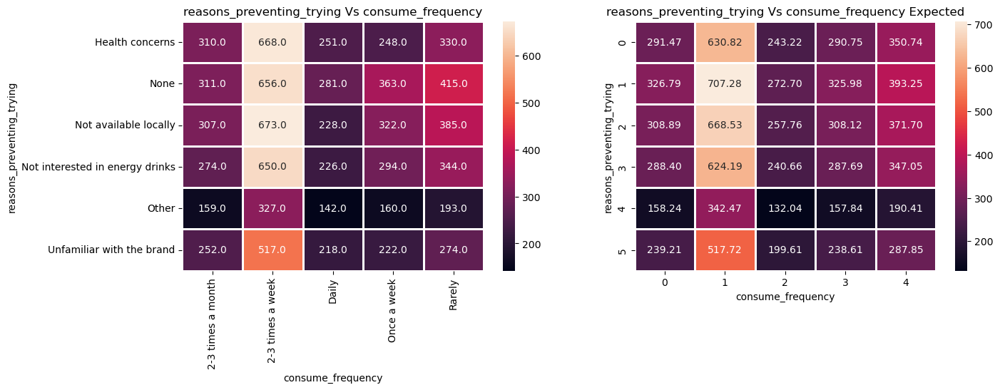

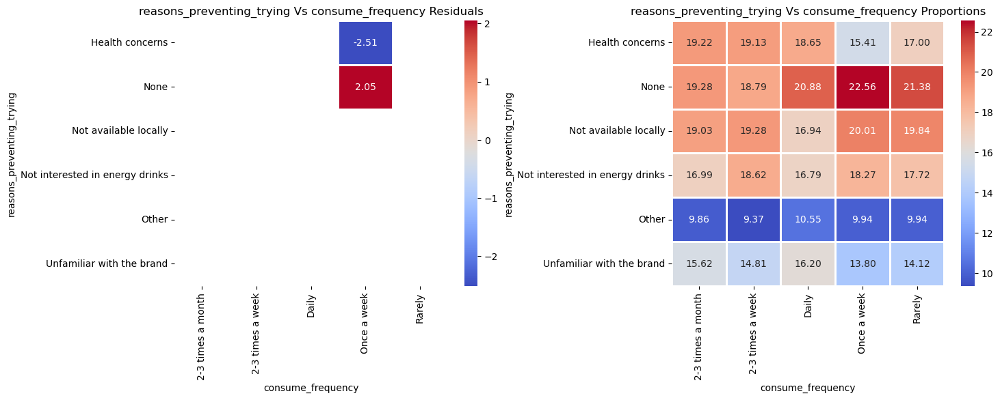

Once a week selected Health concerns over other groups -16.69 %
Once a week selected None over other groups 12.34 %


In [135]:
# reasons_preventing_trying
heatmap_analysis('reasons_preventing_trying','consume_frequency') # nothing much significant

In [136]:
# current_brands vs consume_frequency
chi_sq_test('current_brands','consume_frequency')

 Chi-sq Statistic: 21.246486935305864, Pvalue: 0.6241449994490775, Cramers_V: 0.02304695583765124


(consume_frequency  2-3 times a month  2-3 times a week  Daily  Once a week  \
 current_brands                                                               
 Bepsi                            326               744    272          358   
 Blue Bull                        179               375    147          165   
 CodeX                            147               361    123          145   
 Cola-Coka                        435               858    323          423   
 Gangster                         307               646    271          291   
 Others                            63               174     73           72   
 Sky 9                            156               333    137          155   
 
 consume_frequency  Rarely  
 current_brands             
 Bepsi                 412  
 Blue Bull             192  
 CodeX                 204  
 Cola-Coka             499  
 Gangster              339  
 Others                 97  
 Sky 9                 198  ,
 array([[340.6656, 737.29

 Chi-sq Statistic: 21.733550518497317, Pvalue: 0.15200507525243762, Cramers_V: 0.023309628117205838


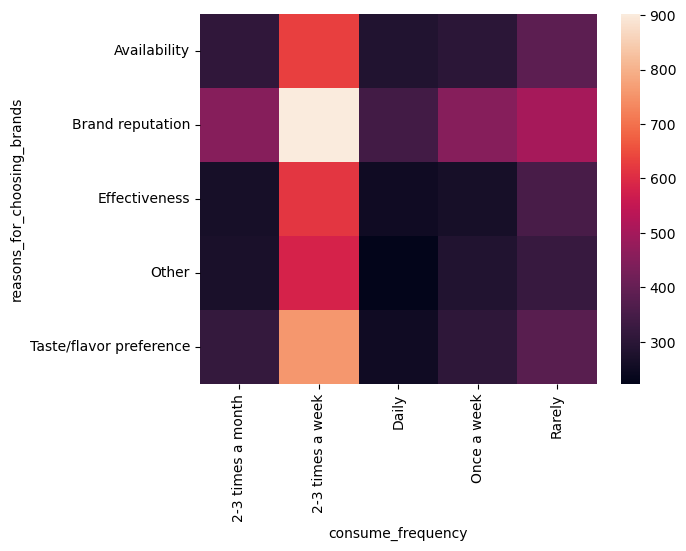

In [137]:
# reasons_for_choosing_brands vs consume_frequency
chi_sq_test('reasons_for_choosing_brands','consume_frequency')
heatmap_creator('reasons_for_choosing_brands','consume_frequency')

In [138]:
# improvements_desired vs consume_frequency
chi_sq_test('improvements_desired','consume_frequency')
# Fail to reject null hypothesis.

 Chi-sq Statistic: 15.41051581144928, Pvalue: 0.49480197820597327, Cramers_V: 0.019628114919325083


(consume_frequency         2-3 times a month  2-3 times a week  Daily  \
 improvements_desired                                                   
 Healthier alternatives                  228               511    187   
 More natural ingredients                398               854    334   
 Other                                   165               336    151   
 Reduced sugar content                   468              1062    408   
 Wider range of flavors                  354               728    266   
 
 consume_frequency         Once a week  Rarely  
 improvements_desired                           
 Healthier alternatives            242     304  
 More natural ingredients          410     502  
 Other                             158     188  
 Reduced sugar content             504     553  
 Wider range of flavors            295     394  ,
 array([[ 237.4336,  513.8752,  198.1312,  236.8448,  285.7152],
        [ 402.9274,  872.0518,  336.2308,  401.9282,  484.8618],
        [ 160

In [139]:
# 'ingredients_expected' vs consume_frequency
chi_sq_test('ingredients_expected','consume_frequency')

 Chi-sq Statistic: 7.398769846173534, Pvalue: 0.8301761609596059, Cramers_V: 0.01570431983688303


(consume_frequency     2-3 times a month  2-3 times a week  Daily  Once a week  \
 ingredients_expected                                                            
 Caffeine                            639              1354    529          626   
 Guarana                             245               537    221          232   
 Sugar                               317               732    258          319   
 Vitamins                            412               868    338          432   
 
 consume_frequency     Rarely  
 ingredients_expected          
 Caffeine                 748  
 Guarana                  318  
 Sugar                    391  
 Vitamins                 484  ,
 array([[ 628.4248, 1360.0936,  524.4016,  626.8664,  756.2136],
        [ 250.4989,  542.1523,  209.0338,  249.8777,  301.4373],
        [ 325.3421,  704.1347,  271.4882,  324.5353,  391.4997],
        [ 408.7342,  884.6194,  341.0764,  407.7206,  491.8494]]))

In [140]:
# health_concerns vs consume_frequency
chi_sq_test('health_concerns','consume_frequency')

 Chi-sq Statistic: 2.264311137841096, Pvalue: 0.6872740921047631, Cramers_V: 0.015047628178025586


(consume_frequency  2-3 times a month  2-3 times a week  Daily  Once a week  \
 health_concerns                                                              
 No                               619              1388    550          641   
 Yes                              994              2103    796          968   
 
 consume_frequency  Rarely  
 health_concerns            
 No                    757  
 Yes                  1184  ,
 array([[ 637.9415, 1380.6905,  532.343 ,  636.3595,  767.6655],
        [ 975.0585, 2110.3095,  813.657 ,  972.6405, 1173.3345]]))

In [141]:
# interest_in_natural_or_organic vs consume_frequency
chi_sq_test('interest_in_natural_or_organic','consume_frequency')

 Chi-sq Statistic: 1.8717673523555234, Pvalue: 0.9846938365168605, Cramers_V: 0.009674108104511556


(consume_frequency               2-3 times a month  2-3 times a week  Daily  \
 interest_in_natural_or_organic                                               
 No                                            485              1067    418   
 Not Sure                                      310               685    252   
 Yes                                           818              1739    676   
 
 consume_frequency               Once a week  Rarely  
 interest_in_natural_or_organic                       
 No                                      497     595  
 Not Sure                                315     393  
 Yes                                     797     953  ,
 array([[ 493.9006, 1068.9442,  412.1452,  492.6758,  594.3342],
        [ 315.3415,  682.4905,  263.143 ,  314.5595,  379.4655],
        [ 803.7579, 1739.5653,  670.7118,  801.7647,  967.2003]]))

 Chi-sq Statistic: 31.84924834901843, Pvalue: 0.010461266023906603, Cramers_V: 0.028217569149830406
************



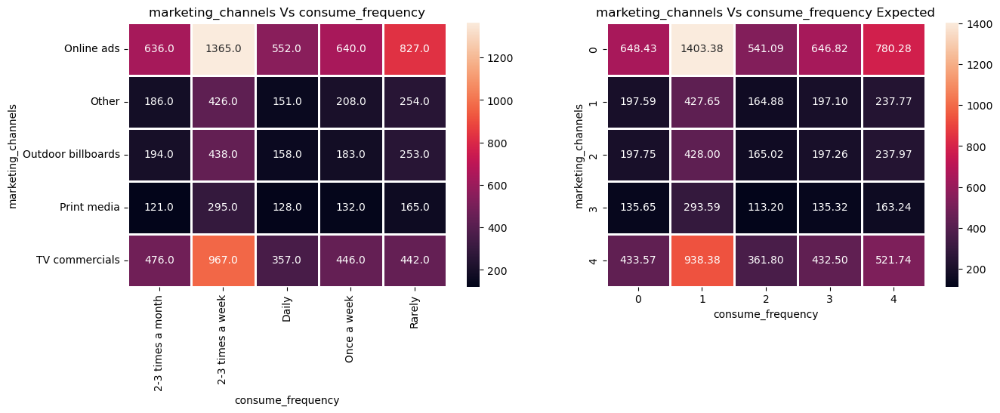

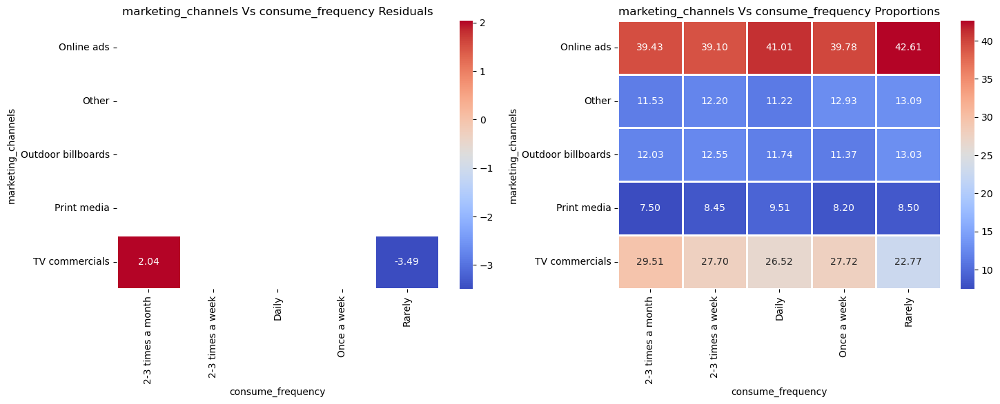

2-3 times a month selected TV commercials over other groups 12.73 %
Rarely selected TV commercials over other groups -18.27 %


In [142]:
# marketing_channels vs consume_frequency
heatmap_analysis('marketing_channels','consume_frequency')

In [143]:
# packaging_preference vs consume_frequency
chi_sq_test('packaging_preference','consume_frequency')

 Chi-sq Statistic: 12.155685094223655, Pvalue: 0.7331949225392487, Cramers_V: 0.017432502039454675


(consume_frequency          2-3 times a month  2-3 times a week  Daily  \
 packaging_preference                                                    
 Collectible packaging                    243               540    205   
 Compact and portable cans                623              1371    563   
 Eco-friendly design                      154               354    130   
 Innovative bottle design                 518              1053    381   
 Other                                     75               173     67   
 
 consume_frequency          Once a week  Rarely  
 packaging_preference                            
 Collectible packaging              246     267  
 Compact and portable cans          625     802  
 Eco-friendly design                157     188  
 Innovative bottle design           509     586  
 Other                               72      98  ,
 array([[ 242.1113,  523.9991,  202.0346,  241.5109,  291.3441],
        [ 642.6192, 1390.8144,  536.2464,  641.0256,  773.2944],

In [144]:
# 'limited_edition_packaging' vs consume_frequency.
chi_sq_test('limited_edition_packaging','consume_frequency')

 Chi-sq Statistic: 6.04176927988386, Pvalue: 0.6425529692822295, Cramers_V: 0.017380692276034147


(consume_frequency          2-3 times a month  2-3 times a week  Daily  \
 limited_edition_packaging                                               
 No                                       645              1380    532   
 Not Sure                                 312               738    276   
 Yes                                      656              1373    538   
 
 consume_frequency          Once a week  Rarely  
 limited_edition_packaging                       
 No                                 674     792  
 Not Sure                           325     380  
 Yes                                610     769  ,
 array([[ 648.9099, 1404.4293,  541.4958,  647.3007,  780.8643],
        [ 327.6003,  709.0221,  273.3726,  326.7879,  394.2171],
        [ 636.4898, 1377.5486,  531.1316,  634.9114,  765.9186]]))

In [145]:
# 'price_range' vs consume_frequency.
chi_sq_test('price_range','consume_frequency')

 Chi-sq Statistic: 9.858614460967653, Pvalue: 0.6283628484117931, Cramers_V: 0.018127892377004424


(consume_frequency  2-3 times a month  2-3 times a week  Daily  Once a week  \
 price_range                                                                  
 100-150                          524              1087    448          491   
 50-99                            702              1507    559          701   
 Above 150                        226               542    213          257   
 Below 50                         161               355    126          160   
 
 consume_frequency  Rarely  
 price_range                
 100-150               592  
 50-99                 819  
 Above 150             323  
 Below 50              207  ,
 array([[ 506.8046, 1096.8722,  422.9132,  505.5478,  609.8622],
        [ 691.6544, 1496.9408,  577.1648,  689.9392,  832.3008],
        [ 251.7893,  544.9451,  210.1106,  251.1649,  302.9901],
        [ 162.7517,  352.2419,  135.8114,  162.3481,  195.8469]]))

In [146]:
chi_sq_test('purchase_location','consume_frequency')

 Chi-sq Statistic: 19.23957504374197, Pvalue: 0.2564355563490304, Cramers_V: 0.02193146999390486


(consume_frequency         2-3 times a month  2-3 times a week  Daily  \
 purchase_location                                                      
 Gyms and fitness centers                248               486    213   
 Local stores                            138               299     99   
 Online retailers                        408               893    358   
 Other                                   118               232     86   
 Supermarkets                            701              1581    590   
 
 consume_frequency         Once a week  Rarely  
 purchase_location                              
 Gyms and fitness centers          228     289  
 Local stores                      129     148  
 Online retailers                  412     479  
 Other                             131     112  
 Supermarkets                      709     913  ,
 array([[ 236.1432,  511.0824,  197.0544,  235.5576,  284.1624],
        [ 131.1369,  283.8183,  109.4298,  130.8117,  157.8033],
        [ 411

In [147]:
# typical_consumption_situations vs consume_frequency.
chi_sq_test('typical_consumption_situations','consume_frequency')

 Chi-sq Statistic: 12.549945236219553, Pvalue: 0.7053351397833154, Cramers_V: 0.017712950937251785


(consume_frequency               2-3 times a month  2-3 times a week  Daily  \
 typical_consumption_situations                                               
 Driving/commuting                              55               107     33   
 Other                                          76               171     62   
 Social outings/parties                        218               534    201   
 Sports/exercise                               739              1532    627   
 Studying/working late                         525              1147    423   
 
 consume_frequency               Once a week  Rarely  
 typical_consumption_situations                       
 Driving/commuting                        43      59  
 Other                                    77     105  
 Social outings/parties                  230     304  
 Sports/exercise                         750     846  
 Studying/working late                   509     627  ,
 array([[  47.9061,  103.6827,   39.9762,   47.7873,   57.6

In [148]:
# chi_sq_test('age','consume_frequency')
# chi_sq_test('gender','consume_frequency')

 Chi-sq Statistic: 3420.22007471465, Pvalue: 0.0, Cramers_V: 0.2924132381884689
************



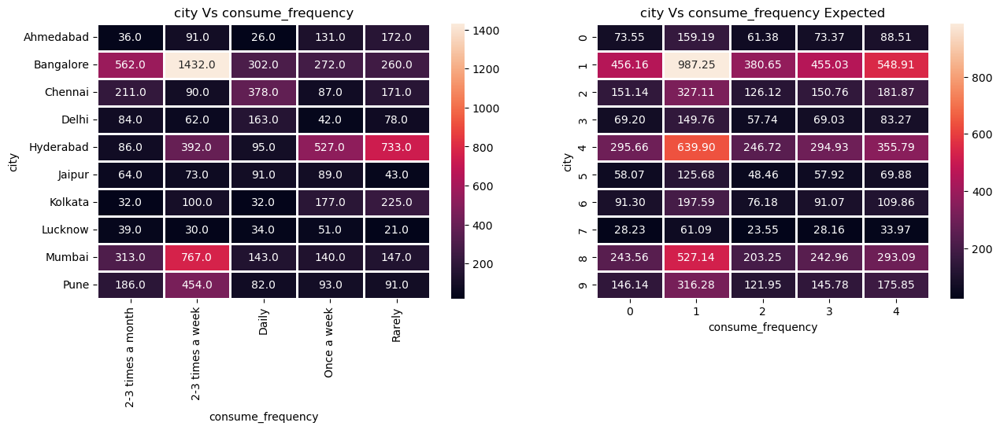

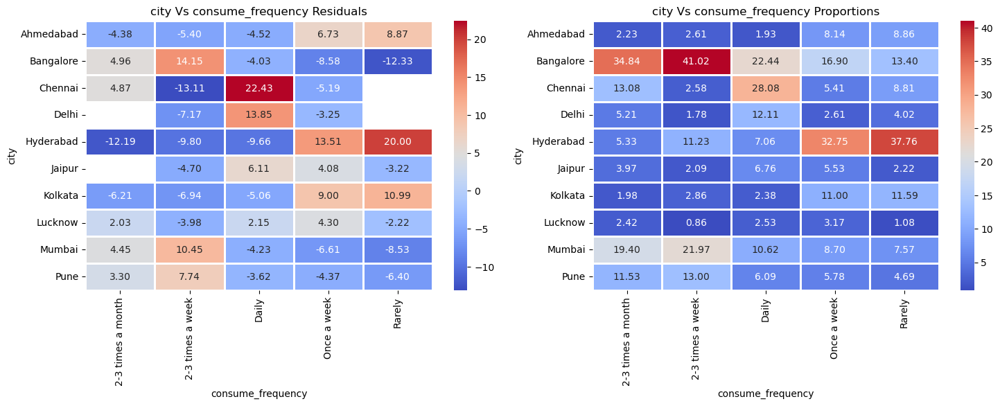

2-3 times a month selected Ahmedabad over other groups -58.56 %
2-3 times a week selected Ahmedabad over other groups -50.74 %
Daily selected Ahmedabad over other groups -64.62 %
Once a week selected Ahmedabad over other groups 108.34 %
Rarely selected Ahmedabad over other groups 137.7 %
2-3 times a month selected Bangalore over other groups 48.65 %
2-3 times a week selected Bangalore over other groups 87.35 %
Daily selected Bangalore over other groups -15.46 %
Once a week selected Bangalore over other groups -39.46 %
Rarely selected Bangalore over other groups -53.49 %
2-3 times a month selected Chennai over other groups 16.59 %
2-3 times a week selected Chennai over other groups -81.38 %
Daily selected Chennai over other groups 275.99 %
Once a week selected Chennai over other groups -58.84 %
2-3 times a week selected Delhi over other groups -70.33 %
Daily selected Delhi over other groups 255.85 %
Once a week selected Delhi over other groups -54.82 %
2-3 times a month selected Hyderab

In [149]:
heatmap_analysis('city','consume_frequency')

# most of the frequent drinkers are from banglore,chennai,mumbai,pune
# and ocassional and rare drinkers are from the hyderabad and kolkata.

 Chi-sq Statistic: 127.69956817354158, Pvalue: 1.2086474354118675e-26, Cramers_V: 0.11300423362579898
************



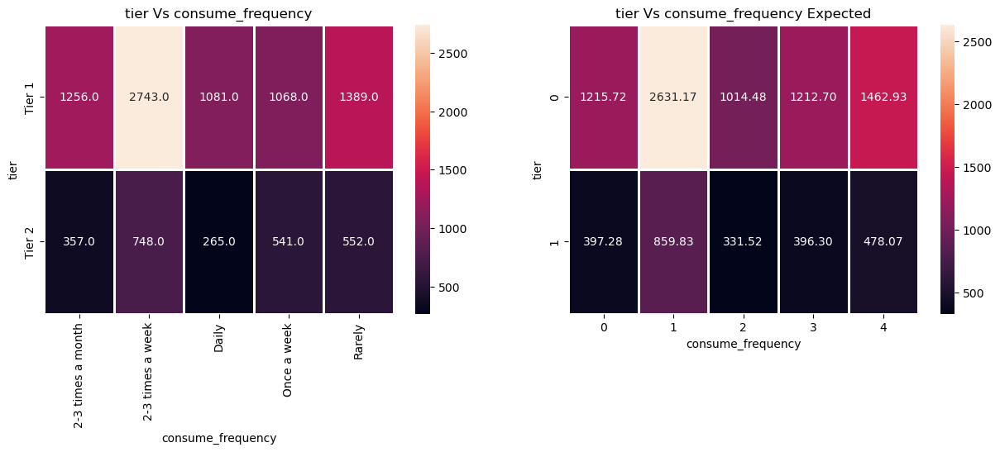

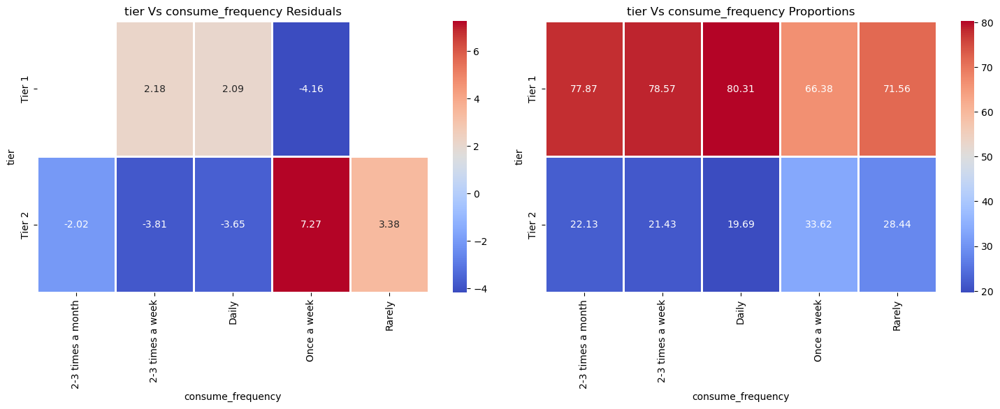

2-3 times a week selected Tier 1 over other groups 6.14 %
Daily selected Tier 1 over other groups 9.13 %
Once a week selected Tier 1 over other groups -13.88 %
2-3 times a month selected Tier 2 over other groups -14.2 %
2-3 times a week selected Tier 2 over other groups -17.5 %
Daily selected Tier 2 over other groups -25.44 %
Once a week selected Tier 2 over other groups 46.69 %
Rarely selected Tier 2 over other groups 17.43 %


In [150]:
heatmap_analysis('tier','consume_frequency')

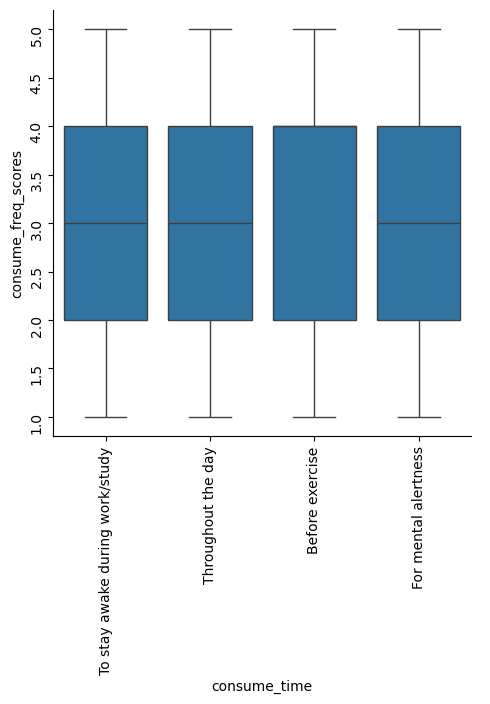

In [151]:
# consume_freq_scores vs consume_time
# numerical vs categorical
sns.catplot(data = df,x = 'consume_time',y = 'consume_freq_scores',kind = 'box')
plt.tick_params(rotation = 90)

# the median value for consume_time(before exercise) is 4 higher than other groups.
# means higher frequency drinkers moslty drink before exercise.

In [152]:
df[df['consume_time'] == 'Before exercise']['consume_freq_scores'].median()

4.0

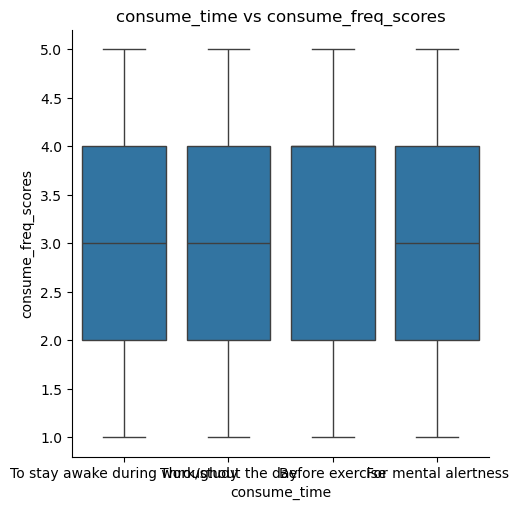

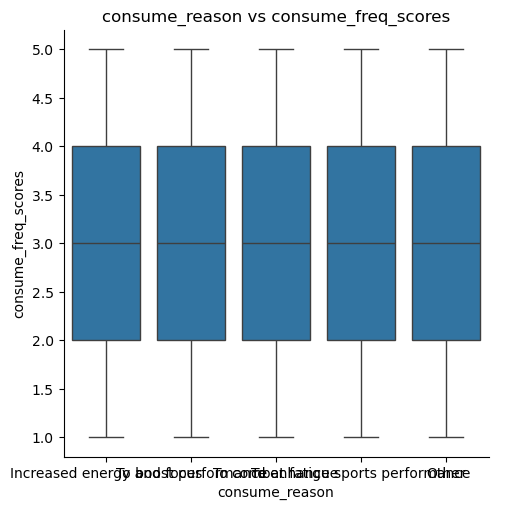

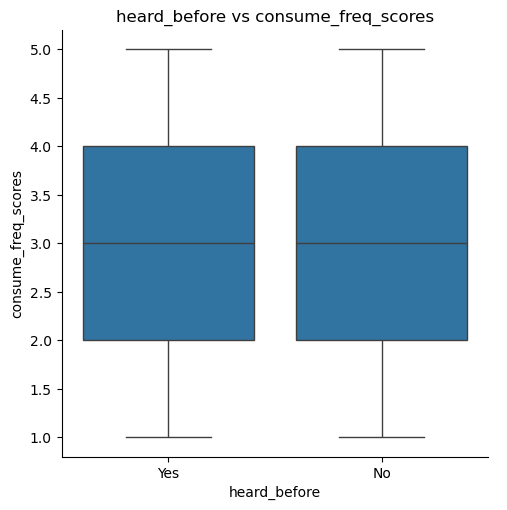

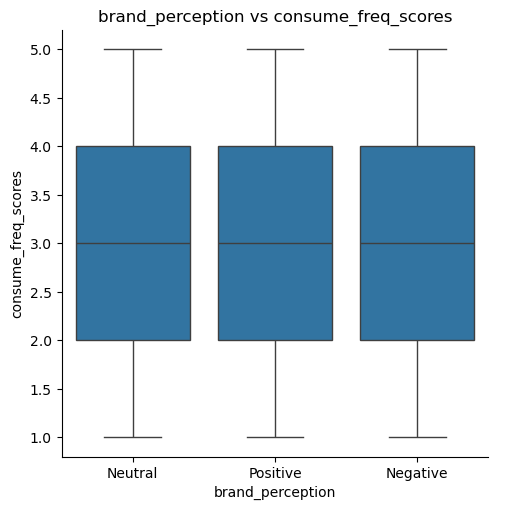

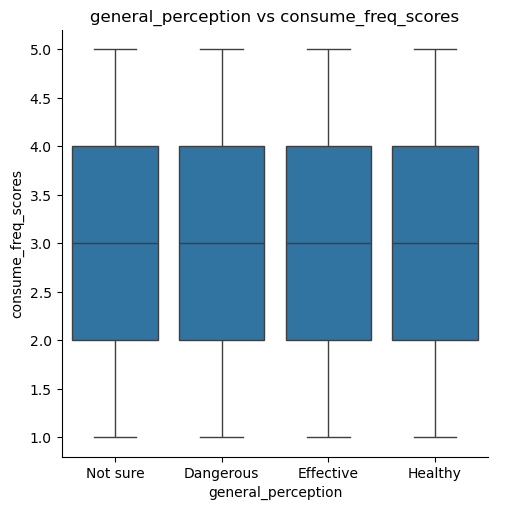

...

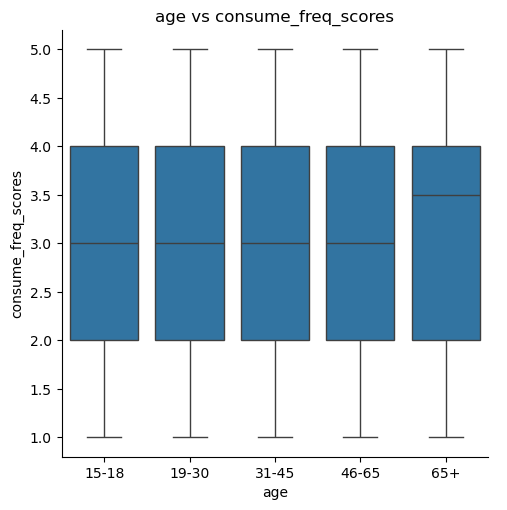

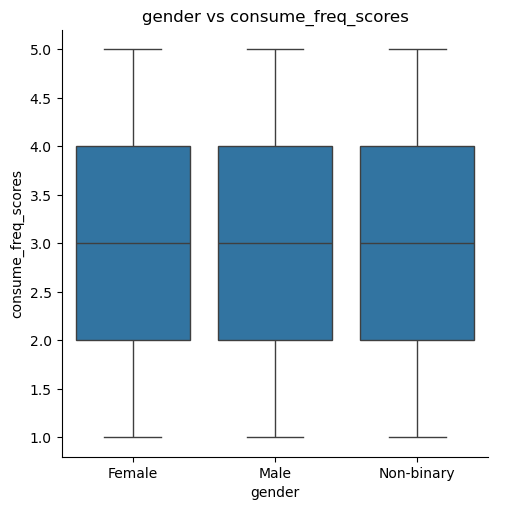

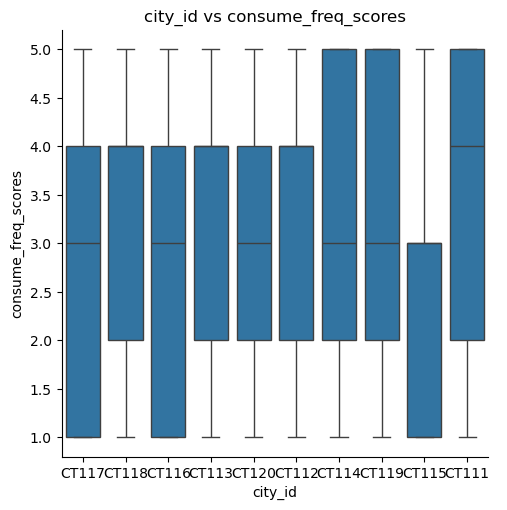

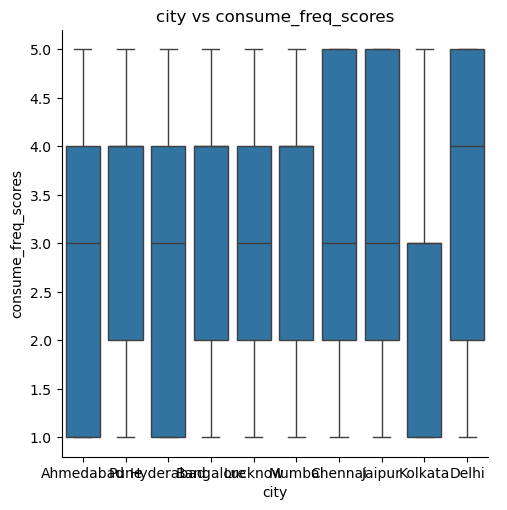

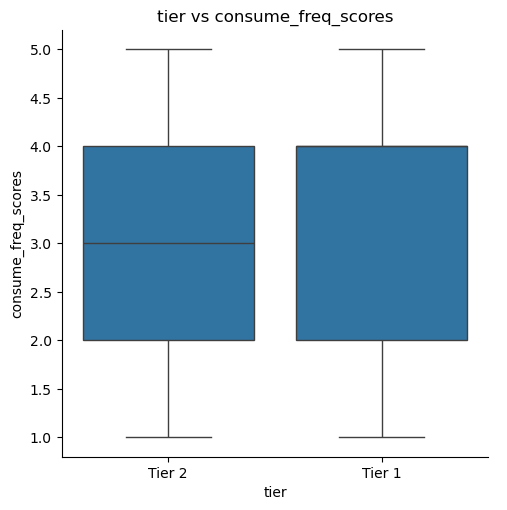

In [153]:
cols = ['consume_time',
       'consume_reason', 'heard_before', 'brand_perception',
       'general_perception', 'tried_before', 'taste_experience',
       'reasons_preventing_trying', 'current_brands',
       'reasons_for_choosing_brands', 'improvements_desired',
       'ingredients_expected', 'health_concerns',
       'interest_in_natural_or_organic', 'marketing_channels',
       'packaging_preference', 'limited_edition_packaging', 'price_range',
       'purchase_location', 'typical_consumption_situations', 'age',
       'gender', 'city_id', 'city', 'tier']
for col in cols:
    sns.catplot(data = df, x = col,y = 'consume_freq_scores', kind = 'box')
    plt.title(f'{col} vs consume_freq_scores')
    plt.show()

In [154]:
# reasons_preventing_trying vs consume_freq_scores
# current_brands vs consume_freq_scores
# reasons_for_choosing_brands vs consume_freq_scores
# marketing_channels vs consume_freq_scores
# age vs consume_freq_scores
# city vs consume_freq_scores
# tier vs consume_freq_scores

In [155]:
df.columns

Index(['response_id', 'respondent_id', 'consume_frequency', 'consume_time',
       'consume_reason', 'heard_before', 'brand_perception',
       'general_perception', 'tried_before', 'taste_experience',
       'reasons_preventing_trying', 'current_brands',
       'reasons_for_choosing_brands', 'improvements_desired',
       'ingredients_expected', 'health_concerns',
       'interest_in_natural_or_organic', 'marketing_channels',
       'packaging_preference', 'limited_edition_packaging', 'price_range',
       'purchase_location', 'typical_consumption_situations', 'name', 'age',
       'gender', 'city_id', 'city', 'tier', 'consume_freq_scores'],
      dtype='object')

In [156]:
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [188]:
model = ols('consume_freq_scores ~ age', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)

----- One-Way ANOVA Results -----
                sum_sq      df        F    PR(>F)
age           2.327859     4.0  0.31956  0.865049
Residual  18202.337741  9995.0      NaN       NaN


In [186]:
model = ols('consume_freq_scores ~ C(age) + C(gender) + C(age):C(gender)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                        sum_sq      df         F    PR(>F)
C(age)                2.288984     4.0  0.314099  0.868721
C(gender)             0.743626     2.0  0.204083  0.815398
C(age):C(gender)     10.261699     8.0  0.704065  0.688306
Residual          18191.332417  9985.0       NaN       NaN


In [190]:
# one way anova to check if the mean consume_freq_score depends or varies with the gender.

In [189]:
model = ols('consume_freq_scores ~ gender', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)

----- One-Way ANOVA Results -----
              sum_sq      df         F    PR(>F)
gender        0.7825     2.0  0.214862  0.806656
Residual  18203.8831  9997.0       NaN       NaN


In [203]:
# consume_freq_scores vs city

In [204]:
model = ols('consume_freq_scores ~ city', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)
if anova_table.loc['city','PR(>F)'] < 0.05:
    print("Statistically significant difference in drinking frequency across cities.")
else:
    print("No statistically significant difference in drinking frequency across cities.")

# we did found this earlier and have noted.

----- One-Way ANOVA Results -----
                sum_sq      df         F         PR(>F)
city       1465.315083     9.0  97.16624  1.035676e-174
Residual  16739.350517  9990.0       NaN            NaN
Statistically significant difference in drinking frequency across cities.


In [213]:
model = ols('consume_freq_scores ~ C(age) + C(city) + C(age):C(city)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)
# we knew about the consume_freq_score vs age
# consume_freq_score gets affected by age, and city
# effect of age on consume_freq gets affected by city or effect of city on age gets affected by age.
# better analysis would be with tier.

----- Two-Way ANOVA Results -----
                      sum_sq      df          F         PR(>F)
C(age)              1.403298     4.0   0.209777   9.331225e-01
C(city)          1464.390523     9.0  97.293386  6.576825e-175
C(age):C(city)     97.915000    36.0   1.626356   1.032949e-02
Residual        16640.032219  9950.0        NaN            NaN


True

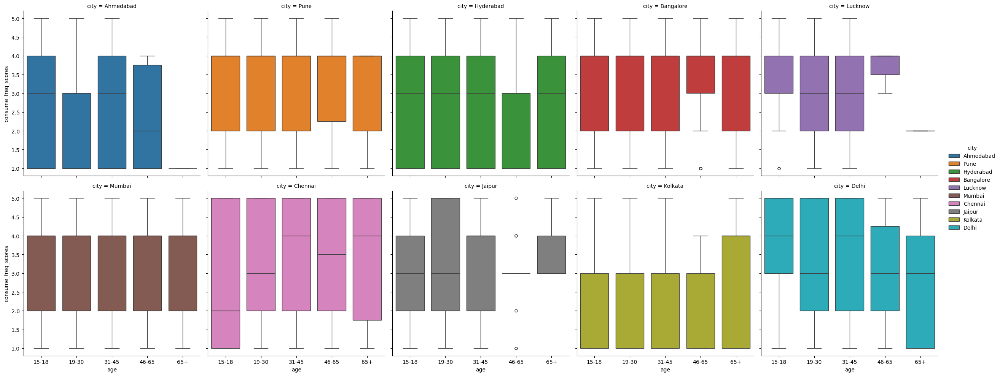

In [214]:
sns.catplot(data = df, x = 'age', y = 'consume_freq_scores', hue = 'city', kind = 'box', col = 'city', col_wrap = 5)

In [215]:
model = ols('consume_freq_scores ~ C(age) + C(tier) + C(age):C(tier)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results-----")
print(anova_table)

# thought there is statistically significant difference but we nothing new.
# already found it using bivariate.

----- Two-Way ANOVA Results -----
                      sum_sq      df          F        PR(>F)
C(age)              2.226263     4.0   0.306662  8.736839e-01
C(tier)            66.816403     1.0  36.815197  1.345879e-09
C(age):C(tier)      4.533940     4.0   0.624539  6.449769e-01
Residual        18130.987398  9990.0        NaN           NaN


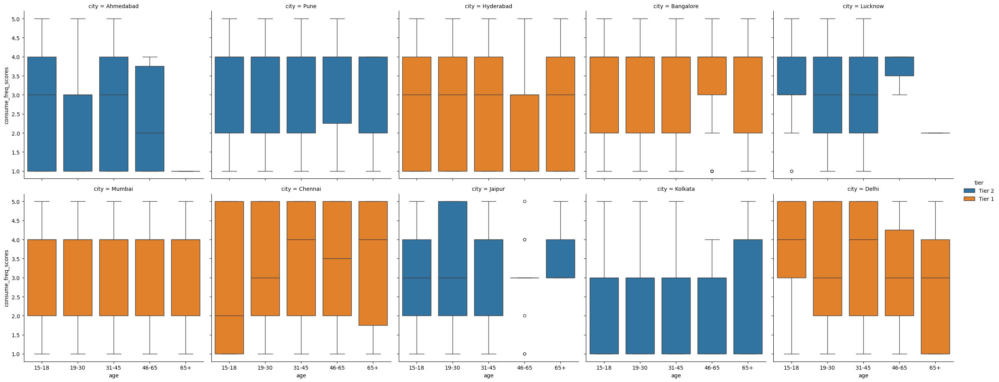

In [216]:
sns.catplot(data = df, x = 'age', y = 'consume_freq_scores', hue = 'tier', kind = 'box', col = 'city', col_wrap = 5)

In [226]:
def grouper(tier_df):
    return tier_df.groupby('age')['consume_freq_scores'].mean()
df.groupby('tier').apply(grouper, include_groups = False)

age,15-18,19-30,31-45,46-65,65+
tier,,,,,
Tier 1,3.162996,3.097356,3.136081,3.065831,3.125000
Tier 2,2.886686,2.938971,2.910744,2.981308,2.894737


In [231]:
pd.pivot_table(data = df,index ='tier',columns = 'age', values = 'consume_freq_scores', aggfunc = ['mean','median'])

mean                                         median              \
age        15-18     19-30     31-45     46-65       65+  15-18 19-30 31-45   
tier                                                                          
Tier 1  3.162996  3.097356  3.136081  3.065831  3.125000    4.0   4.0   4.0   
Tier 2  2.886686  2.938971  2.910744  2.981308  2.894737    3.0   3.0   3.0   

                   
age    46-65  65+  
tier               
Tier 1   3.0  4.0  
Tier 2   3.0  3.0

In [ ]:
# taste_experience vs gender

In [206]:
model = ols('taste_experience ~ gender', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)
if anova_table.loc['gender','PR(>F)'] < 0.05:
    print("Statistically significant difference in drinking frequency across cities.")
else:
    print("No statistically significant difference in drinking frequency across cities.")

----- One-Way ANOVA Results -----
                sum_sq      df        F    PR(>F)
gender        2.961303     2.0  0.96334  0.381651
Residual  15365.362597  9997.0      NaN       NaN
No statistically significant difference in drinking frequency across cities.


In [ ]:
# taste_experience vs age.

In [207]:
model = ols('taste_experience ~ age', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)
if anova_table.loc['age','PR(>F)'] < 0.05:
    print("Statistically significant difference in drinking frequency across cities.")
else:
    print("No statistically significant difference in drinking frequency across cities.")

----- One-Way ANOVA Results -----
                sum_sq      df      F    PR(>F)
age           1.592789     4.0  0.259  0.904281
Residual  15366.731111  9995.0    NaN       NaN
No statistically significant difference in drinking frequency across cities.


In [209]:
model = ols('taste_experience ~ city', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)
if anova_table.loc['city','PR(>F)'] < 0.05:
    print("Statistically significant difference in drinking frequency across cities.")
else:
    print("No statistically significant difference in drinking frequency across cities.")

----- One-Way ANOVA Results -----
                sum_sq      df         F    PR(>F)
city          5.875466     9.0  0.424527  0.922773
Residual  15362.448434  9990.0       NaN       NaN
No statistically significant difference in drinking frequency across cities.


In [211]:
model = ols('taste_experience ~ tier', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)
if anova_table.loc['tier','PR(>F)'] < 0.05:
    print("Statistically significant difference in drinking frequency across cities.")
else:
    print("No statistically significant difference in drinking frequency across cities.")

----- One-Way ANOVA Results -----
                sum_sq      df         F    PR(>F)
tier          0.891467     1.0  0.579986  0.446336
Residual  15367.432433  9998.0       NaN       NaN
No statistically significant difference in drinking frequency across cities.


In [166]:
# age vs gender  -- nothing.
model = ols('taste_experience ~ C(age) + C(gender) + C(age):C(gender)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                        sum_sq      df         F    PR(>F)
C(age)                1.643048     4.0  0.267068  0.899265
C(gender)             3.011561     2.0  0.979025  0.375713
C(age):C(gender)      6.370817     8.0  0.517770  0.844039
Residual          15357.348732  9985.0       NaN       NaN


In [167]:
# age vs city -- no effect individually as well as no interaction effect
model = ols('taste_experience ~ C(age) + C(city) + C(age):C(city)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                      sum_sq      df         F    PR(>F)
C(age)              1.579360     4.0  0.256751  0.905666
C(city)             5.862037     9.0  0.423543  0.923314
C(age):C(city)     59.450163    36.0  1.073846  0.350826
Residual        15301.418911  9950.0       NaN       NaN


In [168]:
# age vs tier -- no effect individually as well as no interaction effect
model = ols('taste_experience ~ C(age) + C(tier) + C(age):C(tier)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                      sum_sq      df         F    PR(>F)
C(age)              1.575853     4.0  0.256261  0.905967
C(tier)             0.874531     1.0  0.568856  0.450732
C(age):C(tier)      7.730678     4.0  1.257144  0.284456
Residual        15358.125902  9990.0       NaN       NaN


In [169]:
# gender vs city -- no effect individually as well as no interaction effect
model = ols('taste_experience ~ C(gender) + C(city) + C(gender):C(city)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                         sum_sq      df         F    PR(>F)
C(gender)              2.888000     2.0  0.938439  0.391273
C(city)                5.802164     9.0  0.418973  0.925806
C(gender):C(city)     18.470403    18.0  0.666872  0.846922
Residual           15341.090031  9970.0       NaN       NaN


In [170]:
# gender vs tier -- no effect individually as well as no interaction effect
model = ols('taste_experience ~ C(gender) + C(tier) + C(gender):C(tier)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                         sum_sq      df         F    PR(>F)
C(gender)              2.905084     2.0  0.944836  0.388778
C(tier)                0.835249     1.0  0.543305  0.461084
C(gender):C(tier)      0.262205     2.0  0.085278  0.918257
Residual           15364.265143  9994.0       NaN       NaN


In [171]:
model = ols('consume_freq_scores ~ C(age) + C(gender) + C(age):C(gender)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)
# consumption freq doesnt depend on the age.
# consumption freq doesnt depend on the gender
# consumption freq doesnt depend on the age:gender

----- Two-Way ANOVA Results -----
                        sum_sq      df         F    PR(>F)
C(age)                2.288984     4.0  0.314099  0.868721
C(gender)             0.743626     2.0  0.204083  0.815398
C(age):C(gender)     10.261699     8.0  0.704065  0.688306
Residual          18191.332417  9985.0       NaN       NaN


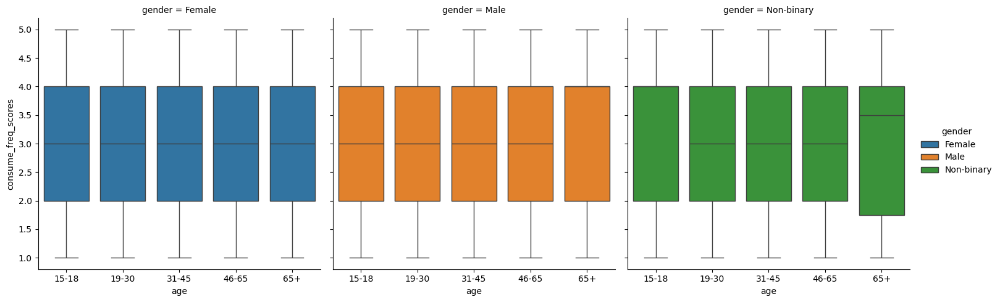

In [173]:
sns.catplot(data = df, x = 'age', y = 'consume_freq_scores', hue = 'gender', kind = 'box', col = 'gender')

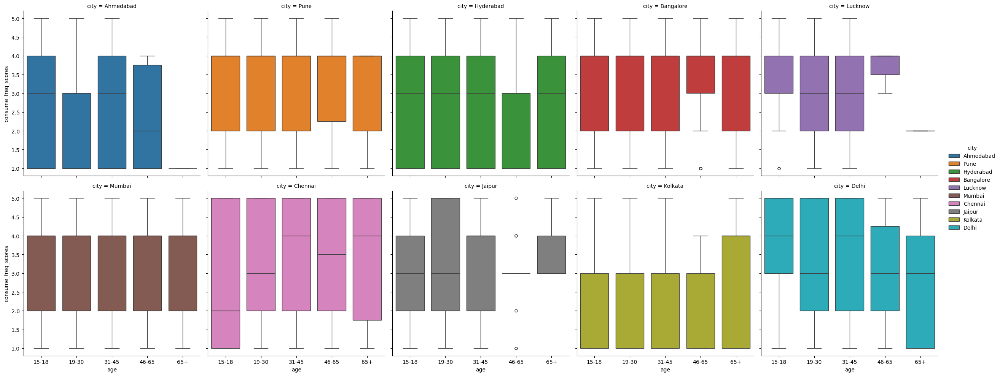

In [174]:
sns.catplot(data = df, x = 'age', y = 'consume_freq_scores', hue = 'city', kind = 'box', col = 'city', col_wrap = 5)

In [175]:
model = ols('consume_freq_scores ~ C(age) + C(tier) + C(age):C(tier)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)

----- Two-Way ANOVA Results -----
                      sum_sq      df          F        PR(>F)
C(age)              2.226263     4.0   0.306662  8.736839e-01
C(tier)            66.816403     1.0  36.815197  1.345879e-09
C(age):C(tier)      4.533940     4.0   0.624539  6.449769e-01
Residual        18130.987398  9990.0        NaN           NaN


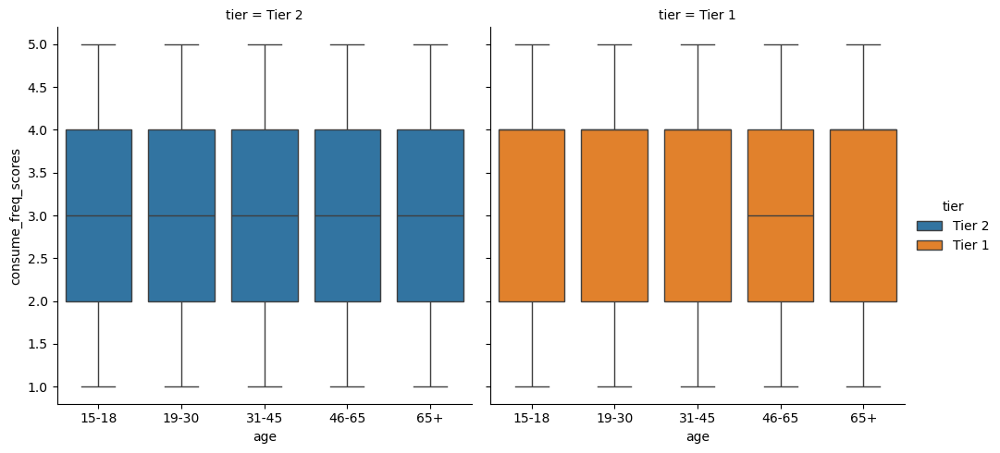

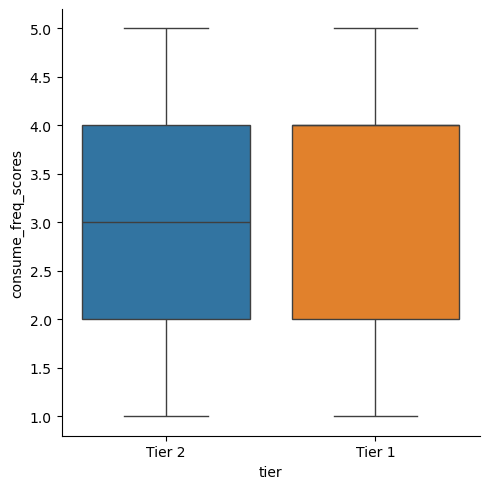

In [176]:
sns.catplot(data = df, x = 'age', y = 'consume_freq_scores', kind = 'box', hue = 'tier', col = 'tier')
sns.catplot(data = df, x = 'tier', y = 'consume_freq_scores', kind = 'box', hue = 'tier')

In [177]:
model = ols('consume_freq_scores ~ C(gender) + C(city) + C(gender):C(city)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)
(4.407077e-01 < 0.05, 5.230308e-175 < 0.05, 1.933224e-01 < 0.05)
# only city has the relationship with the consumption freq

----- Two-Way ANOVA Results -----
                         sum_sq      df          F         PR(>F)
C(gender)              2.744870     2.0   0.819441   4.407077e-01
C(city)             1467.277453     9.0  97.340935  5.230308e-175
C(gender):C(city)     38.416298    18.0   1.274291   1.933224e-01
Residual           16698.189349  9970.0        NaN            NaN


(False, True, False)

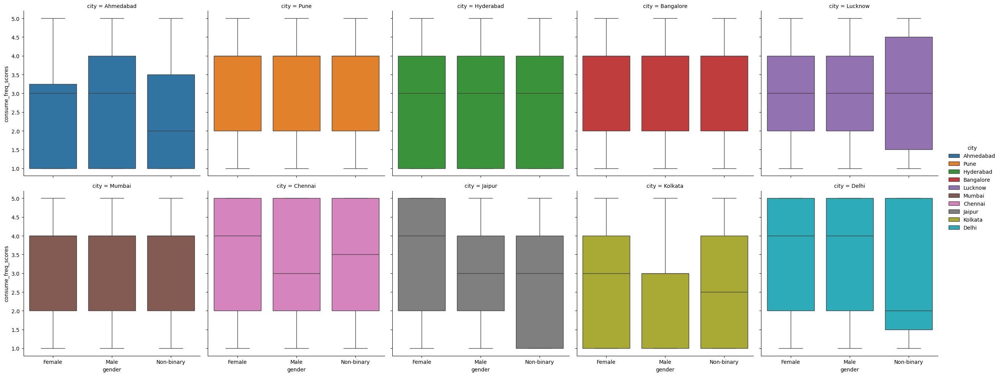

In [178]:
sns.catplot(data = df, x = 'gender' , y = 'consume_freq_scores', hue = 'city', col = 'city', col_wrap = 5, kind = 'box')
# for all the genders the box plots are kind of similar only - so no effect,
# for city there is change in the verical height/ consumption freq so yes

In [179]:
model = ols('consume_freq_scores ~ C(gender) + C(tier) + C(gender):C(tier)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)
( 8.027266e-01 < 0.05 , 1.298455e-09 < 0.05, 6.410101e-01 < 0.05)

----- Two-Way ANOVA Results -----
                         sum_sq      df          F        PR(>F)
C(gender)              0.797512     2.0   0.219746  8.027266e-01
C(tier)               66.933011     1.0  36.885366  1.298455e-09
C(gender):C(tier)      1.614033     2.0   0.444730  6.410101e-01
Residual           18135.336056  9994.0        NaN           NaN


(False, True, False)

In [232]:
model = ols('consume_freq_scores ~ consume_time', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ = 2)
print("----- One-Way ANOVA Results -----")
print(anova_table)
if anova_table.loc['consume_time','PR(>F)'] < 0.05:
    print("Statistically significant difference in drinking frequency across cities.")
else:
    print("No statistically significant difference in drinking frequency across cities.")

----- One-Way ANOVA Results -----
                  sum_sq      df         F    PR(>F)
consume_time     54.8421     3.0  10.06808  0.000001
Residual      18149.8235  9996.0       NaN       NaN
Statistically significant difference in drinking frequency across cities.


In [241]:
model = ols('consume_freq_scores ~ C(consume_time) + C(tier) + C(consume_time):C(tier)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print("----- Two-Way ANOVA Results -----")
print(anova_table)
if anova_table.iloc[2,3] < 0.05:
    print('Effect of consume_time on consume_freq_scores varies by tier or vice versa')
else:
    print('No Interaction')

----- Two-Way ANOVA Results -----
                               sum_sq      df          F        PR(>F)
C(consume_time)             44.208357     3.0   8.143257  2.059737e-05
C(tier)                     56.284256     1.0  31.102976  2.510632e-08
C(consume_time):C(tier)     11.916110     3.0   2.194968  8.644354e-02
Residual                 18081.623134  9992.0        NaN           NaN
No Interaction


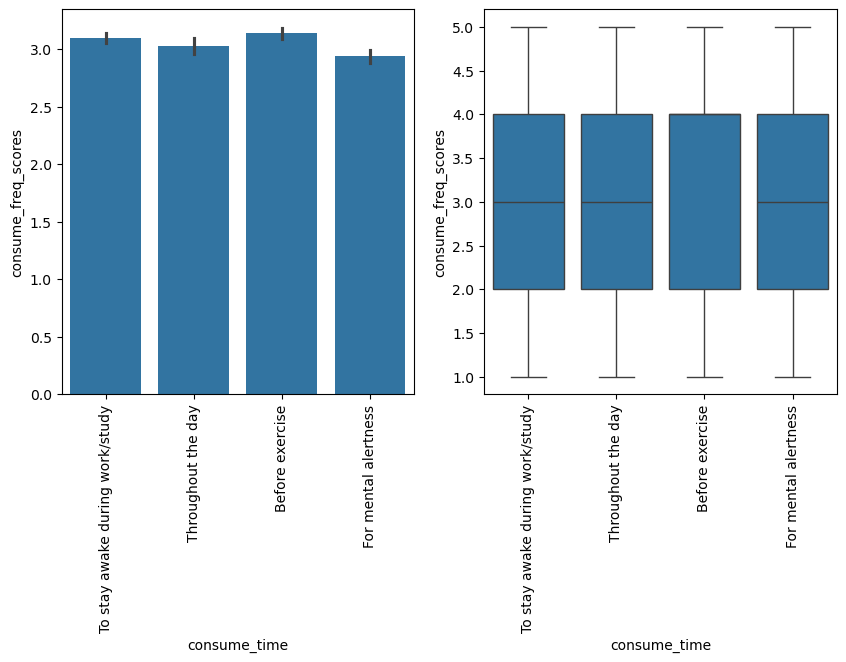

In [181]:
fig = plt.figure(figsize = (10,5),)
ax1 = fig.add_subplot(1,2,1)
sns.barplot(data = df, x = 'consume_time', y = 'consume_freq_scores', estimator = 'mean',ax = ax1)
ax1.tick_params(axis = 'x', rotation = 90)
ax2 = fig.add_subplot(1,2,2)
sns.boxplot(data = df, x = 'consume_time', y = 'consume_freq_scores', ax = ax2)
ax2.tick_params(axis = 'x', rotation = 90)